## Final Project Submission

Please fill out:
* Student name: Mindy Jen
* Student pace: full time
* Scheduled project review date/time: Fri, Jul 24, 2020, 02:45 PM - 03:30 PM (CDT)
* Instructor name: Abhineet Kulkarni 
* Blog post URL: TBD

# obtaining data

In [152]:
# Your code here - remember to use markdown cells for comments as well!
# Import statements go here
import pandas as pd
import numpy as np
import math
import scipy.stats as stats
from scipy.stats import pearsonr
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.metrics import r2_score

from warnings import filterwarnings
filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.style.use('seaborn')
import seaborn as sns
sns.set(style="darkgrid", color_codes=True)

kc = pd.read_csv('kc_house_data.csv',index_col=None,encoding='latin1')
kc.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


## retrieve data information

In [2]:
kc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


# scrubbing and cleaning Data

## run timestamp data conversion  

In [3]:
def general_datetime_converter(df, col):
    df_clone = df.copy()
    df_clone[col] = pd.to_datetime(df_clone[col])
    return df_clone

kc2 = general_datetime_converter(kc, 'date')
kc2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: datetime64[ns](1), float64(8), int64(11), object(1)
memory 

## read missing and symbolic values

In [4]:
def check_cols(df):
    for col in df.columns:
        print('------------------------------------------------------')
        print(col)
        print(f'unique values: {df[col].nunique(dropna=False)} (\'NaN\' included)')
        print(f'NaN exists? {df[col].isna().any()}')
        if df[col].isna().any():
            print(f'how many \'NaN\' values? {df[col].isna().sum()} ({np.divide(df[col].isna().sum(),df.shape[0])*100:.2f}%)')
        print('------------------------------------------------------')
        print(df[col].value_counts(dropna=False, normalize=True))
        print('------------------------------------------------------')
        print('\n') # Break up the output between columns
        
    return None

check_cols(kc2)

------------------------------------------------------
id
unique values: 21420 ('NaN' included)
NaN exists? False
------------------------------------------------------
795000620     0.000139
1825069031    0.000093
2019200220    0.000093
7129304540    0.000093
1781500435    0.000093
                ...   
7812801125    0.000046
4364700875    0.000046
3021059276    0.000046
880000205     0.000046
1777500160    0.000046
Name: id, Length: 21420, dtype: float64
------------------------------------------------------


------------------------------------------------------
date
unique values: 372 ('NaN' included)
NaN exists? False
------------------------------------------------------
2014-06-23    0.006575
2014-06-25    0.006066
2014-06-26    0.006066
2014-07-08    0.005880
2015-04-27    0.005834
                ...   
2014-07-27    0.000046
2015-03-08    0.000046
2014-11-02    0.000046
2015-05-15    0.000046
2015-05-24    0.000046
Name: date, Length: 372, dtype: float64
-------------------

## remove erratic symbols

In [5]:
# Your code here - Manipulate column names
subs = [(' ','_'),('.',''),("'",""),('®',''),('Â',''),('â\x84¢',''),('+','plus'),('½','half'),('-','_')]

def transform_colname(df):
    df_clone = df.copy()
    cols_rename = []
    for col in df_clone.columns:
        for old, new in subs:
            col = col.replace(old,new)
        cols_rename.append(col)
    df_clone.columns = cols_rename
    return df_clone

In [6]:
def convert_obj_to_num(df, col):
    df_clone = df.copy()
    if df_clone[col].dtype == 'object':
        df_clone[col] = df_clone[col].replace({'?':np.NaN}).astype('float64')
    return df_clone

kc3 = convert_obj_to_num(kc2, 'sqft_basement')
kc3.dtypes

id                        int64
date             datetime64[ns]
price                   float64
bedrooms                  int64
bathrooms               float64
sqft_living               int64
sqft_lot                  int64
floors                  float64
waterfront              float64
view                    float64
condition                 int64
grade                     int64
sqft_above                int64
sqft_basement           float64
yr_built                  int64
yr_renovated            float64
zipcode                   int64
lat                     float64
long                    float64
sqft_living15             int64
sqft_lot15                int64
dtype: object

## replace missing values

In [7]:
def find_null_cols(df):
    df_clone = df.copy()
    print('\'NaN\' found in columns as follows:')
    for col in df_clone.columns:
        if (df_clone[col].isnull().any()) | (df_clone[col].isna().any()):
            print(f'\t{col:30} contains {df_clone[col].isna().sum():10} null values ({df_clone[col].isna().sum()*100/df_clone.shape[0]:5.2f}%) !')
    return None

find_null_cols(kc3)

'NaN' found in columns as follows:
	waterfront                     contains       2376 null values (11.00%) !
	view                           contains         63 null values ( 0.29%) !
	sqft_basement                  contains        454 null values ( 2.10%) !
	yr_renovated                   contains       3842 null values (17.79%) !


### continuous features

In [8]:
def fill_null_cols(df, col, nullified=False):
    df_clone = df.copy()
    if nullified:
        df_clone[col] = df_clone[col].fillna(0)
    else:
        try:
            median = df_clone[col].median()
            mean = df_clone[col].mean()
            print(f'{col}: median {median:.3f}, mean {mean:.3f}')
            if median > 0:
                df_clone[col] = df_clone[col].fillna(median)
            else:
                df_clone[col] = df_clone[col].fillna(mean)
        except:
            print('N/A')
    return df_clone

In [9]:
kc4 = fill_null_cols(kc3, 'sqft_basement', nullified=False)
kc4.sqft_basement.isna().any()

sqft_basement: median 0.000, mean 291.852


False

In [10]:
kc5 = fill_null_cols(kc4, 'yr_renovated', nullified=True)
print(kc5.yr_renovated.isna().any())
kc5.yr_renovated.unique()

False


array([   0., 1991., 2002., 2010., 1992., 2013., 1994., 1978., 2005.,
       2003., 1984., 1954., 2014., 2011., 1983., 1945., 1990., 1988.,
       1977., 1981., 1995., 2000., 1999., 1998., 1970., 1989., 2004.,
       1986., 2007., 1987., 2006., 1985., 2001., 1980., 1971., 1979.,
       1997., 1950., 1969., 1948., 2009., 2015., 1974., 2008., 1968.,
       2012., 1963., 1951., 1962., 1953., 1993., 1996., 1955., 1982.,
       1956., 1940., 1976., 1946., 1975., 1964., 1973., 1957., 1959.,
       1960., 1967., 1965., 1934., 1972., 1944., 1958.])

### discrete, categorical features

NaN values are either replaced with 'unknown' (for object data type) or with 0 (for numerical data type)

furthermore, you are allowed to require numerical data be either float or integer

In [11]:
def replace_null_cols(df, col, obj=False, bina=False):
    df_clone = df.copy()
    if obj:
        df_clone[col] = df_clone[col].fillna('unknown')
    else:
        #df_clone[col] = df_clone[col].fillna(-1) 
        df_clone[col] = df_clone[col].fillna(0)
        if bina:
            df_clone[col] = df_clone[col].astype('int64')
        
    return df_clone

In [12]:
kc6 = replace_null_cols(kc5, 'waterfront', obj=False, bina=True)
kc6.waterfront.isna().any()

False

In [13]:
kc7 = replace_null_cols(kc6, 'view', obj=False, bina=True)
kc7.view.isna().any()

False

for the sake of insightful feature creation and multicollinearity elimination, transforming some numerical data to be so-called binary switch, that is, 1 stands for non-zero values in primordial data, and 0 still stays the same, becomes definitely helpful and fairly useful in the model development and fitting

In [14]:
def transform_col_to_binary(df, col, colrename):
    df_clone = df.copy()
    df_clone[colrename] = df_clone[col]
    for idx in range(df_clone.shape[0]):
        if df_clone.loc[idx,colrename] > 0:
            df_clone.loc[idx,colrename] = 1
    
    df_clone[colrename] = df_clone[colrename].astype('int64')
    return df_clone

In [15]:
kc7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null int64
view             21597 non-null int64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: datetime64[ns](1), float64(7), int64(13)
memory usage: 3.5 MB


In [16]:
kc8 = transform_col_to_binary(kc7, 'yr_renovated', 'hasrenovated')
print('any NaN?',kc8.hasrenovated.isna().sum())
print(kc8.hasrenovated.nunique())
print('after:',kc8.hasrenovated.unique())
print('before:',kc8.yr_renovated.nunique())
print('----------------------------------')
kc8.info()

any NaN? 0
2
after: [0 1]
before: 70
----------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 22 columns):
id               21597 non-null int64
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null int64
view             21597 non-null int64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int6

In [17]:
kc8['hasrenovated'].value_counts(normalize=True,dropna=False)

0    0.965551
1    0.034449
Name: hasrenovated, dtype: float64

In [18]:
kc9 = transform_col_to_binary(kc8, 'sqft_basement', 'hasbasement')
print('any NaN?',kc9.hasbasement.isna().sum())
print(kc9.hasbasement.nunique())
print('after:',kc9.hasbasement.unique())
print('before:',kc9.sqft_basement.nunique())
print('----------------------------------')
kc9.info()

any NaN? 0
2
after: [0 1]
before: 304
----------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 23 columns):
id               21597 non-null int64
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null int64
view             21597 non-null int64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int

In [19]:
kc9['hasbasement'].value_counts(normalize=True,dropna=False)

0    0.593879
1    0.406121
Name: hasbasement, dtype: float64

likewise, by comparing one feature's size against another, we take the difference as binary-switch between any pair of features. through binary-switch creation, we could not only remove one feature from the primal data but also further reduce the complexity induced by the multicollinearity among a handful of features

In [20]:
def combine_cols_to_binary(df, cola, colb, colc, cold, colrename):
    df_clone = df.copy()
    df_clone[colrename] = df_clone[cola]
    
    for idx, row in df_clone.iterrows():
        if np.divide(row[colrename],row[colb]) > np.divide(row[colc],row[cold]):
            df_clone.loc[idx,colrename] = 1
        else:
            df_clone.loc[idx,colrename] = 0
            
    df_clone[colrename] = df_clone[colrename].astype('int64')
    return df_clone

In [21]:
kc10 = combine_cols_to_binary(kc9, 'sqft_living', 'sqft_lot', 'sqft_living15', 'sqft_lot15', 'hasbiggerllratio')
print('any NaN?',kc10.hasbiggerllratio.isna().sum())
print(kc10.hasbiggerllratio.nunique())
print(kc10.hasbiggerllratio.unique())
print('----------------------------------')
kc10.info()

any NaN? 0
2
[0 1]
----------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 24 columns):
id                  21597 non-null int64
date                21597 non-null datetime64[ns]
price               21597 non-null float64
bedrooms            21597 non-null int64
bathrooms           21597 non-null float64
sqft_living         21597 non-null int64
sqft_lot            21597 non-null int64
floors              21597 non-null float64
waterfront          21597 non-null int64
view                21597 non-null int64
condition           21597 non-null int64
grade               21597 non-null int64
sqft_above          21597 non-null int64
sqft_basement       21597 non-null float64
yr_built            21597 non-null int64
yr_renovated        21597 non-null float64
zipcode             21597 non-null int64
lat                 21597 non-null float64
long                21597 non-null float64
sqft_living15       21597 non-null 

In [22]:
kc10['hasbiggerllratio'].value_counts(normalize=True,dropna=False)

0    0.516646
1    0.483354
Name: hasbiggerllratio, dtype: float64

## remove duplications

In [23]:
def check_remove_duplicated_data(df):
    df_clone = df.copy()
    #df_clone['is_duplicated'] = df_clone.duplicated(subset=None, keep='first')
    do_drop = '0'
    for col in df_clone.columns:
        print(f'{col} contains duplications?')
        if df_clone[col].duplicated().value_counts(normalize=True, sort=False)[0] == 1:
            print('Nope!')
        else:
            print(f'Yes, how much? {df_clone[col].duplicated().value_counts(normalize=True, sort=False)[1]}')
            do_drop = input('drop? enter 1 (\'True\') or 0 (\'False\')')
            if do_drop == '1':
                df_clone[col+'_korg'] = df_clone[col]
                #df_clone[col] = df_clone[col].drop_duplicates(keep='first') 
                # Thomas T.
                df_clone[col] = df_clone[col].drop_duplicates(keep='last')
                print(f' duplications in {col} dropped ... ')
            else:
                print(f' skip {col} ... ')
        print('---------------------------------------------------------------------------')
    return df_clone

if removal of duplications column-by-column is needed, go ahead to uncomment lines below, please

In [ ]:
#kc9 = check_remove_duplicated_data(kc8)
#kc9.columns

## remove extreme outliers exclusively for EDA studies
(data with outliers removal are inapplicable for establishing model development studies. the major reason is we don't want to throw away any data.)  

In [24]:
def remove_outliers(df):
    df_clone = df.copy()
    cuts = []
    do_work = '0'
    do_cut = '0'
    read_cut = '0'
    for col in df_clone.columns:
        print('\n')
        print('***************************************************************************')
        print(f'{col} (data type: {df_clone[col].dtype}):')
        print(f'>>>>>> remaining data size {df_clone.shape[0]} wrt {df.shape[0]}')
        print(f'>>>>>> Percent remained (previous cuts applied): {round(df_clone.shape[0]/df.shape[0],3)}')
        do_work = input('wanna continue? enter 1 (\'True\') or 0 (\'False\')')
        if do_work == '1':
            print ('----------------------------------------------------------------------')
            print(df_clone[col].value_counts(dropna=False,normalize=True))
            print ('----------------------------------------------------------------------')
            q75, q25 = np.percentile(df_clone[col], [75 ,25])
            iqr = q75 - q25
            minVal = q25 - (1.73 * iqr)
            maxVal = q75 + (1.73 * iqr)
            print(f'*** IQR: {iqr:.6f} ********* ')
            print(f'*** minValue: {minVal:.6f} *** ')
            print(f'*** maxValue: {maxVal:.6f} *** ')
            print('-----------------------------------------------------------------------')
            do_cut = input('make cut? enter 1 (\'True\') or 0 (\'False\')')
            if (maxVal == minVal) & (do_cut == '1'):
                do_cut = 0
                print('minimal and maximal values are the same. cut not recommended.')
            if do_cut == '1':
                print(f'\tcut on {col} applied ... ')
                try:
                    orig_tot = df.shape[0]
                    df_cut = df_clone.copy()
                    df_cut = df_clone[(df_clone[col]<minVal) | (df_clone[col]>maxVal)]
                    df_clone = df_clone[(df_clone[col]>minVal) & (df_clone[col]<maxVal)]
                    print(f'\tPercent removed: {round(df_cut.shape[0]/orig_tot,3)}')
                    cuts.append([col,round(minVal,6),round(maxVal,6),round(df_clone.shape[0]/df.shape[0],3),round(df_cut.shape[0]/orig_tot,3)])
                except Exception as e:
                    print('\t\t>>> Sorry! ',e)
            else:
                print(f'\tskip {col} ... ')
                read_cut = input('\tbut... wanna read cut? enter 1 (\'True\') or 0 (\'False\')')
                if read_cut == '1':
                    df_kept = df_clone.copy()
                    try:
                        orig_tot = df_clone.shape[0]
                        df_cut = df_clone.copy()
                        df_cut = df_clone[(df_clone[col]<minVal) | (df_clone[col]>maxVal)]
                        df_clone = df_clone[(df_clone[col]>minVal) & (df_clone[col]<maxVal)]
                        print(f'\tPercent removed: {round(df_cut.shape[0]/orig_tot,3)}')
                        cuts.append([col,round(minVal,6),round(maxVal,6),round(df_clone.shape[0]/df.shape[0],3),round(df_cut.shape[0]/orig_tot,3)])
                    except Exception as e:
                        print('\t\t>>> Sorry! ',e)
                    df_clone = df_kept.copy()
                else:
                    cuts.append([col,0.,0.,0.,0.])
        else:
            cuts.append([col,0.,0.,0.,0.])
            continue
        input("Press Enter to continue...")
    return cuts, df_clone

removal of extreme outliers (Q1 - 1.73 * IQR , Q3 + 1.73 * IQR) column-by-column ; uncomment lines below

**recreate another identical data-frame where outliers removal process is conducted column-by-column exclusively for EDA studies**   

In [25]:
results_eda, kc_eda = remove_outliers(kc10)
print(kc_eda.columns)
results_eda



***************************************************************************
id (data type: int64):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
date (data type: datetime64[ns]):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
price (data type: float64):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
bedrooms (data type: int64):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('Fal

----------------------------------------------------------------------
2014    0.025338
2005    0.020437
1977    0.020333
2004    0.019968
2003    0.019551
          ...   
1901    0.001303
1902    0.001303
1933    0.000991
1934    0.000938
1935    0.000834
Name: yr_built, Length: 116, dtype: float64
----------------------------------------------------------------------
*** IQR: 44.000000 ********* 
*** minValue: 1874.880000 *** 
*** maxValue: 2071.120000 *** 
-----------------------------------------------------------------------
make cut? enter 1 ('True') or 0 ('False')0
	skip yr_built ... 
	but... wanna read cut? enter 1 ('True') or 0 ('False')1
	Percent removed: 0.0
Press Enter to continue...


***************************************************************************
yr_renovated (data type: float64):
>>>>>> remaining data size 19181 wrt 21597
>>>>>> Percent remained (previous cuts applied): 0.888
wanna continue? enter 1 ('True') or 0 ('False')1
----------------------------------

[['id', 0.0, 0.0, 0.0, 0.0],
 ['date', 0.0, 0.0, 0.0, 0.0],
 ['price', 0.0, 0.0, 0.0, 0.0],
 ['bedrooms', 1.27, 5.73, 0.975, 0.025],
 ['bathrooms', 0.4525, 3.7975, 0.961, 0.015],
 ['sqft_living', 0.0, 0.0, 0.0, 0.0],
 ['sqft_lot', 0.0, 0.0, 0.0, 0.0],
 ['floors', -0.73, 3.73, 0.961, 0.0],
 ['waterfront', 0.0, 0.0, 0.0, 0.006],
 ['view', 0.0, 0.0, 0.0, 0.092],
 ['condition', 1.27, 5.73, 0.96, 0.001],
 ['grade', 5.27, 9.73, 0.888, 0.071],
 ['sqft_above', 0.0, 0.0, 0.0, 0.0],
 ['sqft_basement', 0.0, 0.0, 0.0, 0.0],
 ['yr_built', 1874.88, 2071.12, 0.888, 0.0],
 ['yr_renovated', 0.0, 0.0, 0.0, 0.033],
 ['zipcode', 97885.95, 98265.05, 0.888, 0.0],
 ['lat', 0.0, 0.0, 0.0, 0.0],
 ['long', 0.0, 0.0, 0.0, 0.0],
 ['sqft_living15', 0.0, 0.0, 0.0, 0.0],
 ['sqft_lot15', 0.0, 0.0, 0.0, 0.0],
 ['hasrenovated', 0.0, 0.0, 0.0, 0.033],
 ['hasbasement', -1.73, 2.73, 0.888, 0.0],
 ['hasbiggerllratio', -1.73, 2.73, 0.888, 0.0]]

In [26]:
kc101 = kc10  # make a backup prior to manipulation

get kc11 recovered back to its original shape in case something wrong made in following operations

In [ ]:
#kc10 = kc101 # uncomment this line, if kc11 re-generation needed

removal of extreme outliers (Q1 - 1.73 * IQR , Q3 + 1.73 * IQR) column-by-column ; uncomment lines below

**recreate another identical data-frame where outliers removal process is conducted column-by-column exclusively for modeling** 

In [ ]:
#results_model, kc11 = remove_outliers(kc10)
#print(kc11.columns)
#results_model

## feature engineering for modeling

### renovation for sale?

In [27]:
kc10['yr_sold'] = kc10['date'].dt.year.astype('int64')
kc10['mo_sold'] = kc10['date'].dt.month.astype('int64')
print(kc10.dtypes)
kc10.head()

id                           int64
date                datetime64[ns]
price                      float64
bedrooms                     int64
bathrooms                  float64
sqft_living                  int64
sqft_lot                     int64
floors                     float64
waterfront                   int64
view                         int64
condition                    int64
grade                        int64
sqft_above                   int64
sqft_basement              float64
yr_built                     int64
yr_renovated               float64
zipcode                      int64
lat                        float64
long                       float64
sqft_living15                int64
sqft_lot15                   int64
hasrenovated                 int64
hasbasement                  int64
hasbiggerllratio             int64
yr_sold                      int64
mo_sold                      int64
dtype: object


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zipcode,lat,long,sqft_living15,sqft_lot15,hasrenovated,hasbasement,hasbiggerllratio,yr_sold,mo_sold
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,98178,47.5112,-122.257,1340,5650,0,0,0,2014,10
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,98125,47.7210,-122.319,1690,7639,1,1,1,2014,12
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,98028,47.7379,-122.233,2720,8062,0,0,0,2015,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,98136,47.5208,-122.393,1360,5000,0,1,1,2014,12
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,98074,47.6168,-122.045,1800,7503,0,0,0,2015,2


In [28]:
def combine_cols_to_cats(df, cola, colb, colrename):
    df_clone = df.copy()
    df_clone[colrename] = 0
    
    for idx, row in df_clone.iterrows():
        if (row[colb] > 0) & (row[cola] > row[colb]):
            df_clone.loc[idx,colrename] = np.ceil(np.divide(row[cola] - row[colb],10))
        elif (row[colb] > 0) & (row[cola] < row[colb]):
            df_clone.loc[idx,colrename] = np.floor(np.divide(row[cola] - row[colb],10))
        else:
            df_clone.loc[idx,colrename] = 0
            
    df_clone[colrename] = np.multiply(df_clone[colrename],10).astype('int64')
    return df_clone

In [29]:
kc10['yearLater?'] = np.where((kc10['yr_sold'] >= kc10['yr_renovated']) & (kc10['yr_renovated'] > 0), True, False)
kc10.loc[(kc10['yearLater?']==False) & (kc10['yr_renovated'] > 0),['yearLater?','yr_renovated','yr_sold']]

,yearLater?,yr_renovated,yr_sold
2293,False,2015.0,2014
7090,False,2015.0,2014
11587,False,2015.0,2014
14845,False,2015.0,2014
15673,False,2015.0,2014
18560,False,2015.0,2014


In [30]:
kc10 = combine_cols_to_cats(kc10, 'yr_sold', 'yr_renovated', 'hasreno4sale')
print('any NaN?',kc10.hasreno4sale.isna().sum())
print(kc10.hasreno4sale.nunique())
print(kc10.hasreno4sale.unique())
print('----------------------------------')
kc10.info()

any NaN? 0
10
[  0  30  20  10  40  60  70  50 -10  80]
----------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 28 columns):
id                  21597 non-null int64
date                21597 non-null datetime64[ns]
price               21597 non-null float64
bedrooms            21597 non-null int64
bathrooms           21597 non-null float64
sqft_living         21597 non-null int64
sqft_lot            21597 non-null int64
floors              21597 non-null float64
waterfront          21597 non-null int64
view                21597 non-null int64
condition           21597 non-null int64
grade               21597 non-null int64
sqft_above          21597 non-null int64
sqft_basement       21597 non-null float64
yr_built            21597 non-null int64
yr_renovated        21597 non-null float64
zipcode             21597 non-null int64
lat                 21597 non-null float64
long                21597 non-null float6

In [31]:
kc10['hasreno4sale'].value_counts(normalize=True,dropna=False)

 0     0.968699
 10    0.009677
 20    0.007964
 30    0.006853
 40    0.003102
 50    0.001760
 60    0.001111
 70    0.000417
-10    0.000278
 80    0.000139
Name: hasreno4sale, dtype: float64

### how large is overall floor living area? 

(basement excluded)

In [32]:
kc10['sqft_tot'] = (kc10['sqft_above'] + kc10['sqft_basement']).apply(np.ceil).astype('int64')
kc10['areaMatch?'] = np.where(kc10['sqft_living'] >= kc10['sqft_tot'], True, False)
kc10.loc[kc10['areaMatch?']==False,['areaMatch?','sqft_living','sqft_tot','floors']]

,areaMatch?,sqft_living,sqft_tot,floors
6,False,1715,2007,2.0
18,False,1200,1492,1.0
42,False,3595,3887,2.0
79,False,3450,3742,2.0
217,False,2250,2542,2.0
...,...,...,...,...
21365,False,820,1112,3.0
21447,False,2330,2622,2.0
21473,False,980,1272,3.0
21519,False,2380,2672,2.0


In [33]:
kc10.loc[kc10['areaMatch?']==True,['areaMatch?','sqft_living','sqft_tot','floors']]

,areaMatch?,sqft_living,sqft_tot,floors
0,True,1180,1180,1.0
1,True,2570,2570,2.0
2,True,770,770,1.0
3,True,1960,1960,1.0
4,True,1680,1680,1.0
...,...,...,...,...
21592,True,1530,1530,3.0
21593,True,2310,2310,2.0
21594,True,1020,1020,2.0
21595,True,1600,1600,2.0


### how large is every room?

(bathrooms included)

In [34]:
def cal_aveArea_perRm(df, colA, colB, divA, divB, colrename):
    df_clone = df.copy()   
    df_clone[colrename] = 0
        
    for idx, row in df_clone.iterrows():
        if idx%5000 == 0:
            print(idx,row[colA],row[colB],row[divA],row[divB])
        if row[colA] >= row[colB]:
            df_clone.loc[idx,colrename] = row[colA] / (row[divA] + row[divB])
        else:
            df_clone.loc[idx,colrename] = row[colB] / (row[divA] + row[divB])
            
    df_clone[colrename] = df_clone[colrename].apply(np.ceil).astype('int64')    
    print('any 0?',df_clone[colrename].isna().sum())
        
    return df_clone

In [35]:
kc10 = cal_aveArea_perRm(kc10, 'sqft_tot', 'sqft_living', 'bedrooms', 'bathrooms', 'AvgAreaPerRm')
kc10.loc[:5,['sqft_tot','sqft_living','bedrooms','bathrooms','AvgAreaPerRm']]

0 1180 1180 3 1.0
5000 3220 3220 4 3.0
10000 2120 2120 2 1.75
15000 2120 2120 4 2.25
20000 2960 2960 4 3.5
any 0? 0


,sqft_tot,sqft_living,bedrooms,bathrooms,AvgAreaPerRm
0,1180,1180,3,1.00,295
1,2570,2570,3,2.25,490
2,770,770,2,1.00,257
3,1960,1960,4,3.00,280
4,1680,1680,3,2.00,336
5,5420,5420,4,4.50,638


### lateral and longitudinal coordinates combined

(sign removed for the convenience of logarithm transformation) 

In [36]:
#kc10['llr2'] = np.sqrt(np.add(kc10['lat']**2,kc10['long']**2))
#kc10['llr2'] = kc10['llr2'].astype('float64')
#kc10.loc[:5,['llr2','lat','long']]
kc10.loc[:20,['zipcode','lat','long']]

,zipcode,lat,long
0,98178,47.5112,-122.257
1,98125,47.7210,-122.319
2,98028,47.7379,-122.233
3,98136,47.5208,-122.393
4,98074,47.6168,-122.045
5,98053,47.6561,-122.005
6,98003,47.3097,-122.327
7,98198,47.4095,-122.315
8,98146,47.5123,-122.337
9,98038,47.3684,-122.031


zip code gets greater from southeastern up to northwestern

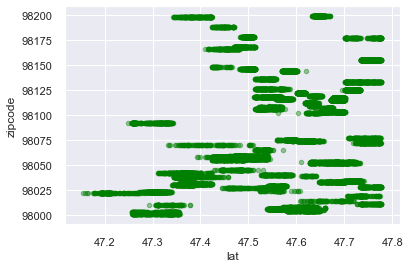

In [37]:
kc10.plot.scatter(x='lat',y='zipcode',c='green',alpha=0.4)

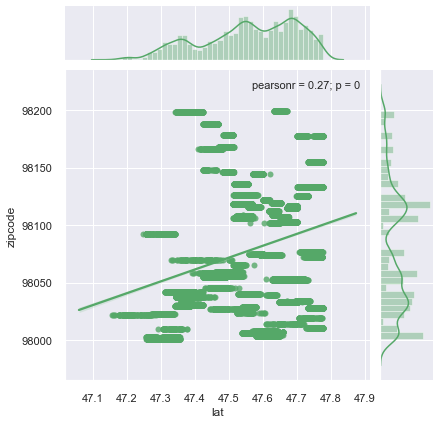

In [38]:
j = sns.jointplot(x='lat', y='zipcode', data=kc10, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

In [ ]:
#kc10['zipcode_lat'] = np.divide(kc10.zipcode,kc10.lat)
#kc10['zipcode_lat'].hist(bins=100, log=True)

In [39]:
kc10['lat_seattle_diff'] = kc10['lat'] - 47.3635

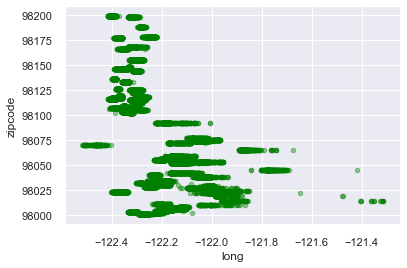

In [40]:
kc10.plot.scatter(x='long',y='zipcode',c='green',alpha=0.4)

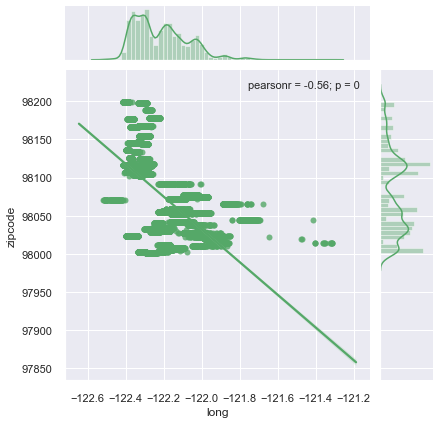

In [41]:
j = sns.jointplot(x='long', y='zipcode', data=kc10, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

In [ ]:
#kc10['zipcode_long'] = np.divide(kc10.zipcode,kc10.long)
#kc10['zipcode_long'].hist(bins=100, log=True)

In [42]:
kc10['long_seattle_diff'] = kc10['long'] + 122.1959

In [ ]:
#j = sns.jointplot(x='zipcode_long', y='zipcode_lat', data=kc10, kind='reg', color='g')
#j.annotate(stats.pearsonr)
#plt.show()

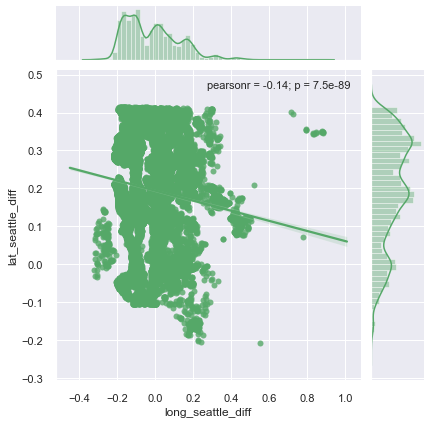

In [43]:
j = sns.jointplot(x='long_seattle_diff', y='lat_seattle_diff', data=kc10, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

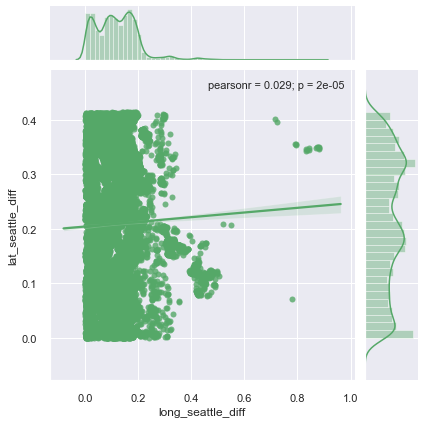

In [44]:
kc10['long_seattle_diff'] = kc10['long_seattle_diff'].abs()
kc10['lat_seattle_diff'] = kc10['lat_seattle_diff'].abs()
j = sns.jointplot(x='long_seattle_diff', y='lat_seattle_diff', data=kc10, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

In [115]:
kc10['long_seattle_diff'].describe()

count    21597.000000
mean         0.117159
std          0.080020
min          0.000100
25%          0.056100
50%          0.113100
75%          0.166100
max          0.880900
Name: long_seattle_diff, dtype: float64

In [116]:
kc10['lat_seattle_diff'].describe()

count    21597.000000
mean         0.209442
std          0.118234
min          0.000000
25%          0.114200
50%          0.208300
75%          0.314500
max          0.414100
Name: lat_seattle_diff, dtype: float64

### house label (zip code) scaled by house built year

(differentiate same-zipcode houses depending on their built year)

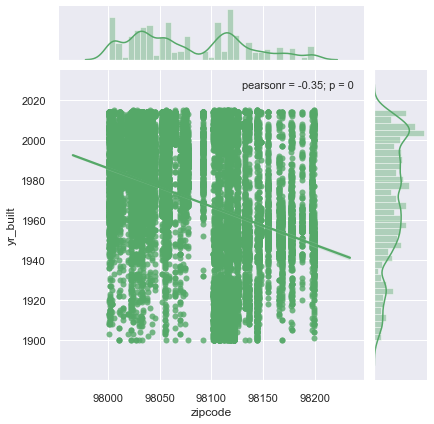

In [45]:
j = sns.jointplot(x='zipcode', y='yr_built', data=kc10, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

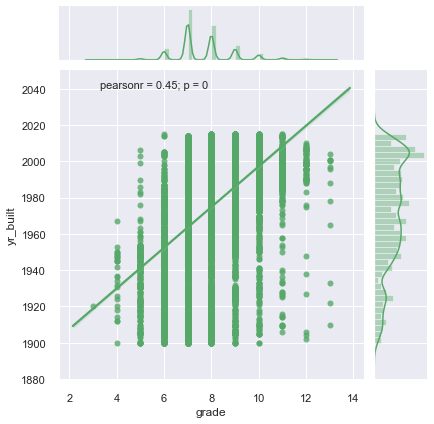

In [46]:
j = sns.jointplot(x='grade', y='yr_built', data=kc10, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

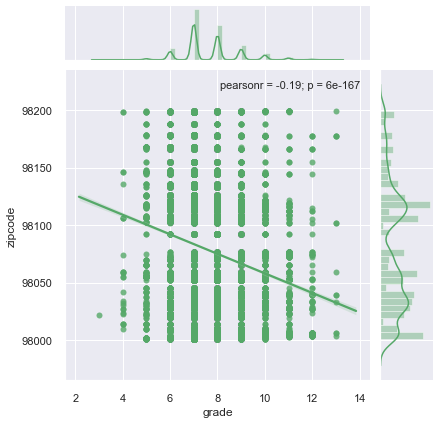

In [47]:
j = sns.jointplot(x='grade', y='zipcode', data=kc10, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

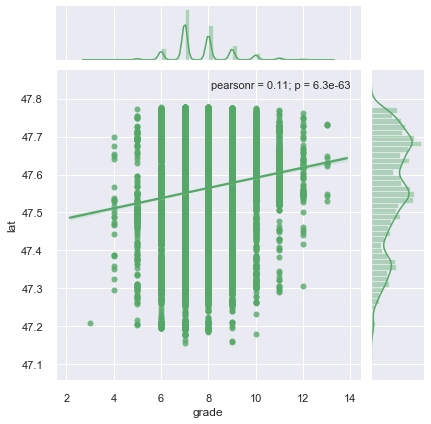

In [48]:
j = sns.jointplot(x='grade', y='lat', data=kc10, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

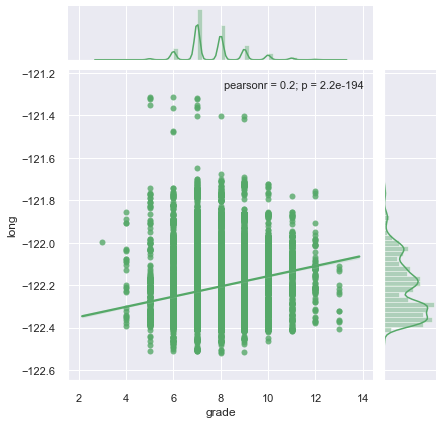

In [49]:
j = sns.jointplot(x='grade', y='long', data=kc10, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

In [50]:
kc10.zipcode.describe()

count    21597.000000
mean     98077.951845
std         53.513072
min      98001.000000
25%      98033.000000
50%      98065.000000
75%      98118.000000
max      98199.000000
Name: zipcode, dtype: float64

In [53]:
def zipcodes_seattle(df, col, colrename):
    df_clone = df.copy()
    df_clone[colrename] = 0
    
    for idx, row in df_clone.iterrows():
        if (row[col] > 98100) & (row[col] < 98200):
            #print(idx, row[col])
            df_clone.loc[idx,colrename] = 1
            
    df_clone[colrename] = df_clone[colrename].astype('int64')
    
    return df_clone

In [54]:
kc10 = zipcodes_seattle(kc10, 'zipcode', 'hasinSeattle')
kc10['hasinSeattle'].unique() 

array([1, 0], dtype=int64)

In [55]:
kc10['hasinSeattle'].value_counts(normalize=True,dropna=False)

0    0.584526
1    0.415474
Name: hasinSeattle, dtype: float64

### house sold years and sold months combined

(dependency removed for avoiding multicollinearity)

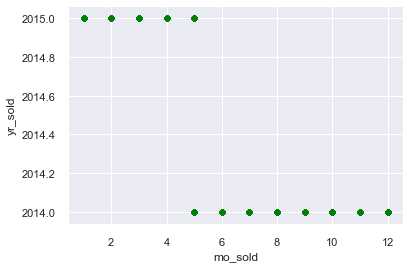

In [56]:
kc10.plot.scatter(x='mo_sold',y='yr_sold',c='green',alpha=0.4)

In [57]:
def sep_yrs_mons(df, colA, colB, colrename):
    df_clone = df.copy()
    df_clone[colrename] = 0
    
    for idx, row in df_clone.iterrows():
        df_clone.loc[idx,colrename] = row[colA] * 100 + row[colB] 
    
    return df_clone

In [58]:
kc10 = sep_yrs_mons(kc10, 'yr_sold', 'mo_sold', 'yrmo_sold')
kc10['yrmo_sold'].unique()

array([201410, 201412, 201502, 201405, 201406, 201501, 201504, 201503,
       201407, 201408, 201411, 201409, 201505], dtype=int64)

In [59]:
kc10['yrmo_sold'].value_counts(normalize=True,dropna=False)

201504    0.103209
201407    0.102375
201406    0.100847
201408    0.089781
201410    0.086864
201503    0.086818
201409    0.082002
201405    0.081863
201412    0.068065
201411    0.065241
201502    0.057740
201501    0.045284
201505    0.029912
Name: yrmo_sold, dtype: float64

In [60]:
kc10.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'hasrenovated',
       'hasbasement', 'hasbiggerllratio', 'yr_sold', 'mo_sold', 'yearLater?',
       'hasreno4sale', 'sqft_tot', 'areaMatch?', 'AvgAreaPerRm',
       'lat_seattle_diff', 'long_seattle_diff', 'hasinSeattle', 'yrmo_sold'],
      dtype='object')

-------------------------------------------------------------------------------------------------------------------------------

Note: if any additional columns are created in order to keep copies of their original data after the duplication data removal process (see above) is done, and these columns are considered to be useless in EDA and modeling, please remember to account for dropping them from data-frame.

-------------------------------------------------------------------------------------------------------------------------------

* id: not used in my analysis, deleted

* date: split into **yr_sold** and **mo_sold** that stand for the house sold-month and sold-year

* yr_renovated: turned into one categorical **hasreno4sale**

* yr_built: turned into a categorical called **yrgrade_built**

* sqft_living: turned into **AvgAreaPerRm** and one binary-switch **hasbiggerllratio**

* sqft_lot: turned into one binary-switch **hasbiggerllratio**

* sqft_basement: turned into a binary-switch called **hasbasement**

* sqft_living15: turned into a binary switch called **hasbiggerllratio**

* sqft_lot15: turned into a binary switch called **hasbiggerllratio**

* lat: turned into **lat_seattle_diff** which is zipcode - Seattle latitude

* long: turned into **long_seattle_diff** which is zipcode + Seattle latitude

* zipcode: turned into a categorical called **hasinSeattle**

In [61]:
kc11 = kc10.drop(['id','date','yr_renovated','yr_sold','mo_sold','hasrenovated','bedrooms','bathrooms',
                 'sqft_basement','sqft_tot','sqft_living','sqft_lot','sqft_living15','sqft_lot15',
                 'lat','long','zipcode','yearLater?','areaMatch?'],axis=1)
kc11.head()

,price,floors,waterfront,view,condition,grade,sqft_above,yr_built,hasbasement,hasbiggerllratio,hasreno4sale,AvgAreaPerRm,lat_seattle_diff,long_seattle_diff,hasinSeattle,yrmo_sold
0,221900.0,1.0,0,0,3,7,1180,1955,0,0,0,295,0.1477,0.0611,1,201410
1,538000.0,2.0,0,0,3,7,2170,1951,1,1,30,490,0.3575,0.1231,1,201412
2,180000.0,1.0,0,0,3,6,770,1933,0,0,0,257,0.3744,0.0371,0,201502
3,604000.0,1.0,0,0,5,7,1050,1965,1,1,0,280,0.1573,0.1971,1,201412
4,510000.0,1.0,0,0,3,8,1680,1987,0,0,0,336,0.2533,0.1509,0,201502


In [62]:
kc11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 16 columns):
price                21597 non-null float64
floors               21597 non-null float64
waterfront           21597 non-null int64
view                 21597 non-null int64
condition            21597 non-null int64
grade                21597 non-null int64
sqft_above           21597 non-null int64
yr_built             21597 non-null int64
hasbasement          21597 non-null int64
hasbiggerllratio     21597 non-null int64
hasreno4sale         21597 non-null int64
AvgAreaPerRm         21597 non-null int64
lat_seattle_diff     21597 non-null float64
long_seattle_diff    21597 non-null float64
hasinSeattle         21597 non-null int64
yrmo_sold            21597 non-null int64
dtypes: float64(4), int64(12)
memory usage: 2.6 MB


## feature manipulation for EDA

In [63]:
kc_eda['yr_sold'] = kc_eda['date'].dt.year.astype('int64')
kc_eda['mo_sold'] = kc_eda['date'].dt.month.astype('int64')
print(kc_eda.dtypes)
kc_eda.head()

id                           int64
date                datetime64[ns]
price                      float64
bedrooms                     int64
bathrooms                  float64
sqft_living                  int64
sqft_lot                     int64
floors                     float64
waterfront                   int64
view                         int64
condition                    int64
grade                        int64
sqft_above                   int64
sqft_basement              float64
yr_built                     int64
yr_renovated               float64
zipcode                      int64
lat                        float64
long                       float64
sqft_living15                int64
sqft_lot15                   int64
hasrenovated                 int64
hasbasement                  int64
hasbiggerllratio             int64
yr_sold                      int64
mo_sold                      int64
dtype: object


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zipcode,lat,long,sqft_living15,sqft_lot15,hasrenovated,hasbasement,hasbiggerllratio,yr_sold,mo_sold
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,98178,47.5112,-122.257,1340,5650,0,0,0,2014,10
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,98125,47.7210,-122.319,1690,7639,1,1,1,2014,12
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,98028,47.7379,-122.233,2720,8062,0,0,0,2015,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,98136,47.5208,-122.393,1360,5000,0,1,1,2014,12
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,98074,47.6168,-122.045,1800,7503,0,0,0,2015,2


* id: not used in my analysis

* date: split into **year** and **month** that stand for the house sold-month and sold-year

* yr_renovated: turned into a binary-switch called **hasrenovated**

* sqft_basement: turned into a binary-switch called **hasbasement**

* sqft_living15: turned into a binary switch called **hasbiggerliving** (1, if sqft_living >= sqft_living15. otherwise, 0)

* sqft_lot15: turned into a binary switch called **hasbiggerlot** (1, if sqft_lot >= sqft_lot15. otherwise, 0)

In [64]:
kc_eda = kc_eda.drop(['id','date','yr_renovated','sqft_basement','sqft_living15','sqft_lot15'],axis=1)
kc_eda.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,zipcode,lat,long,hasrenovated,hasbasement,hasbiggerllratio,yr_sold,mo_sold
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,1955,98178,47.5112,-122.257,0,0,0,2014,10
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,1951,98125,47.7210,-122.319,1,1,1,2014,12
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,1933,98028,47.7379,-122.233,0,0,0,2015,2
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,1965,98136,47.5208,-122.393,0,1,1,2014,12
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,1987,98074,47.6168,-122.045,0,0,0,2015,2


# pre-processing data
## feature engineering for EDA

* read: a flag used to either open or close the option of reading an array of unique values

* intype : if true, data type will be integer. otherwise, float. 

In [65]:
def combine_vars(df, col, read=True, intype=False, digit=0):
    df_clone = df.copy()
    df_clone[col] = sorted(df_clone[col])
    
    print(f'no. unique variables in {col}: {df_clone[col].nunique()}')
    if read:
        print(f'unique values as follows: {df_clone[col].unique()}')
    
    q_0 = float(df_clone[col].min())
    q_5 = df_clone[col].quantile(q=0.05)
    q_25 = df_clone[col].quantile(q=0.25)
    q_50 = df_clone[col].median()
    q_75 = df_clone[col].quantile(q=0.75)
    q_95 = df_clone[col].quantile(q=0.95)
    q_100 = float(df_clone[col].max())
            
    print('q0=',round(q_0,digit),'q5=',round(q_5,digit),'q25=',round(q_25,digit),'q50=',round(q_50,digit),
          'q75=',round(q_75,digit),'q95=',round(q_95,digit),'q100=',round(q_100,digit))
    print('size:',df_clone[col].shape[0])
    
    for idx, row in df_clone.iterrows():
        if (row[col] >= q_0) & (row[col] < q_5):
            df_clone.loc[idx,col] = q_0
        elif (row[col] >= q_5) & (row[col] <= q_25):
            df_clone.loc[idx,col] = (q_5 + q_25) / 2
        elif (row[col] > q_25) & (row[col] <= q_50):
            df_clone.loc[idx,col] = (q_25 + q_50) / 2
        elif (row[col] > q_50) & (row[col] <= q_75):
            df_clone.loc[idx,col] = (q_50 + q_75) / 2
        elif (row[col] > q_75) & (row[col] <= q_95):
            df_clone.loc[idx,col] = (q_75 + q_95) / 2 
        elif (row[col] > q_95) & (row[col] <= q_100):
            df_clone.loc[idx,col] = q_100
        else:
            print('sth.',row[col],'not included!')
    
    df_clone[col] = df_clone[col].apply(np.ceil) # or np.floor
    if intype:
        df_clone[col] = df_clone[col].astype('int64')
    else:
        df_clone[col] = df_clone[col].apply(lambda x:round(x,digit))
    
    return df_clone

### size reduction for discrete feature: date (from 12 to 5)

In [66]:
kc_eda['mo_sold_eda'] = kc_eda['mo_sold']
kc_eda = combine_vars(kc_eda, 'mo_sold_eda', True, True, 0) # integer
print('original:',kc_eda.mo_sold.unique())
print('eda:',kc_eda.mo_sold_eda.unique())

no. unique variables in mo_sold_eda: 12
unique values as follows: [ 1  2  3  4  5  6  7  8  9 10 11 12]
q0= 1.0 q5= 2.0 q25= 4.0 q50= 6.0 q75= 9.0 q95= 12.0 q100= 12.0
size: 19181
original: [10 12  2  6  1  4  3  5  7  8 11  9]
eda: [ 1  3  5  8 11]


### size reduction for other discrete features

* view (from 5 to 3)
* waterfront (from 2 to 2)
* bathrooms (from 14 to 4)
* bedrooms (from 4 to 4)
* floors (from 6 to 3)

In [67]:
kc_eda['view_eda'] = kc_eda['view']
kc_eda = combine_vars(kc_eda, 'view_eda', True, True, 0) # integer
kc_eda.view_eda.unique()

no. unique variables in view_eda: 5
unique values as follows: [0 1 2 3 4]
q0= 0.0 q5= 0.0 q25= 0.0 q50= 0.0 q75= 0.0 q95= 2.0 q100= 4.0
size: 19181


array([0, 1, 4], dtype=int64)

In [68]:
kc_eda['waterfront_eda'] = kc_eda['waterfront']
kc_eda = combine_vars(kc_eda, 'waterfront_eda', True, True, 0) # integer
kc_eda.waterfront_eda.unique()

no. unique variables in waterfront_eda: 2
unique values as follows: [0 1]
q0= 0.0 q5= 0.0 q25= 0.0 q50= 0.0 q75= 0.0 q95= 0.0 q100= 1.0
size: 19181


array([0, 1], dtype=int64)

In [69]:
kc_eda['bathrooms_eda'] = kc_eda['bathrooms']
kc_eda = combine_vars(kc_eda, 'bathrooms_eda', True, False, 2) # float
kc_eda.bathrooms_eda.unique()

no. unique variables in bathrooms_eda: 14
unique values as follows: [0.5  0.75 1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.   3.25 3.5  3.75]
q0= 0.5 q5= 1.0 q25= 1.5 q50= 2.0 q75= 2.5 q95= 3.0 q100= 3.75
size: 19181


array([1., 2., 3., 4.])

In [70]:
kc_eda['bedrooms_eda'] = kc_eda['bedrooms']
kc_eda = combine_vars(kc_eda, 'bedrooms', True, False, 0) # float
kc_eda.bedrooms_eda.unique()

no. unique variables in bedrooms: 4
unique values as follows: [2 3 4 5]
q0= 2.0 q5= 2.0 q25= 3.0 q50= 3.0 q75= 4.0 q95= 5.0 q100= 5.0
size: 19181


array([3, 2, 4, 5], dtype=int64)

In [71]:
kc_eda['floors_eda'] = kc_eda['floors']
kc_eda = combine_vars(kc_eda, 'floors_eda', True, False, 1) # float
kc_eda.floors_eda.unique()

no. unique variables in floors_eda: 6
unique values as follows: [1.  1.5 2.  2.5 3.  3.5]
q0= 1.0 q5= 1.0 q25= 1.0 q50= 1.0 q75= 2.0 q95= 2.0 q100= 3.5
size: 19181


array([1., 2., 4.])

### size reduction for categorical features

* condition (from 4 to 4)
* grade (from 4 to 3)

In [72]:
kc_eda['condition_eda'] = kc_eda['condition']
kc_eda = combine_vars(kc_eda, 'condition_eda', True, True, 0) # integer
kc_eda.condition_eda.unique()

no. unique variables in condition_eda: 4
unique values as follows: [2 3 4 5]
q0= 2.0 q5= 3.0 q25= 3.0 q50= 3.0 q75= 4.0 q95= 5.0 q100= 5.0
size: 19181


array([2, 3, 4, 5], dtype=int64)

In [73]:
kc_eda['grade_eda'] = kc_eda['grade']
kc_eda = combine_vars(kc_eda, 'grade_eda', True, True, 0) # integer
kc_eda.grade_eda.unique()

no. unique variables in grade_eda: 4
unique values as follows: [6 7 8 9]
q0= 6.0 q5= 6.0 q25= 7.0 q50= 7.0 q75= 8.0 q95= 9.0 q100= 9.0
size: 19181


array([7, 8, 9], dtype=int64)

### size reduction for continuous features

In [74]:
kc_eda['lat_eda'] = kc_eda['lat']
kc_eda['lat_eda'] = kc_eda['lat_eda'] * 100000
kc_eda = combine_vars(kc_eda, 'lat_eda', False, False, 4) # float
kc_eda['lat_eda'] /= 100000
kc_eda['lat_eda'] = kc_eda['lat_eda'].apply(lambda x:round(x,4))
kc_eda.lat_eda.unique()

no. unique variables in lat_eda: 4956
q0= 4715590.0 q5= 4730890.0 q25= 4745830.0 q50= 4756860.0 q75= 4768010.0 q95= 4775120.0 q100= 4777760.0
size: 19181


array([47.1559, 47.3836, 47.5134, 47.6243, 47.7156, 47.7776])

In [75]:
kc_eda['long_eda'] = kc_eda['long']
kc_eda['long_eda'] = kc_eda['long_eda'] * 1000
kc_eda = combine_vars(kc_eda, 'long_eda', False, False, 3) # float
kc_eda['long_eda'] /= 1000
kc_eda['long_eda'] = kc_eda['long_eda'].apply(lambda x:round(x,3))
kc_eda.long_eda.unique()

no. unique variables in long_eda: 736
q0= -122519.0 q5= -122387.0 q25= -122332.0 q50= -122244.0 q75= -122133.0 q95= -121983.0 q100= -121319.0
size: 19181


array([-122.518, -122.359, -122.288, -122.188, -122.058, -121.319])

### EDA : What're major factors that make impact on house decision-making buyers' behaviors?
* house **location**
    - weather factor
    - maintenance cost
    - daily commute time, road condition and traffic safety
    - neighborhood quality, e.g. ethics, religion, immigration backgrounds, political parties, education level, salary range, career/occupation and ages 
    - school district for kid education
    - community life, convenience and entertainment, e.g. close to national state park, fishing, dairy food farms and so on
    - crime rate
    
* house **condition**
    - when it was built
    - has it ever been renovated?
    - with or without basement?
    - grade
    
* house **size**
    - family size
    - above average compared to the neighborhood?
    
* house **price**
    - buyer's economic capability
    - buyer's health condition
    - buyer's age
    - buyer's intension to be a landlord of the house (monthly rental fee)
    - annual tax payment
    - renovation/maintenance expanses included? 
    - loan option for specific groups
    - discount deal/offer for specific groups and seasons
    
https://en.wikipedia.org/wiki/Seattle

Coordinates: 47°36′35″N 122°19′59″W

https://en.wikipedia.org/wiki/History_of_Seattle

#### house size vs. price in view and sold month aspects over a range of grades

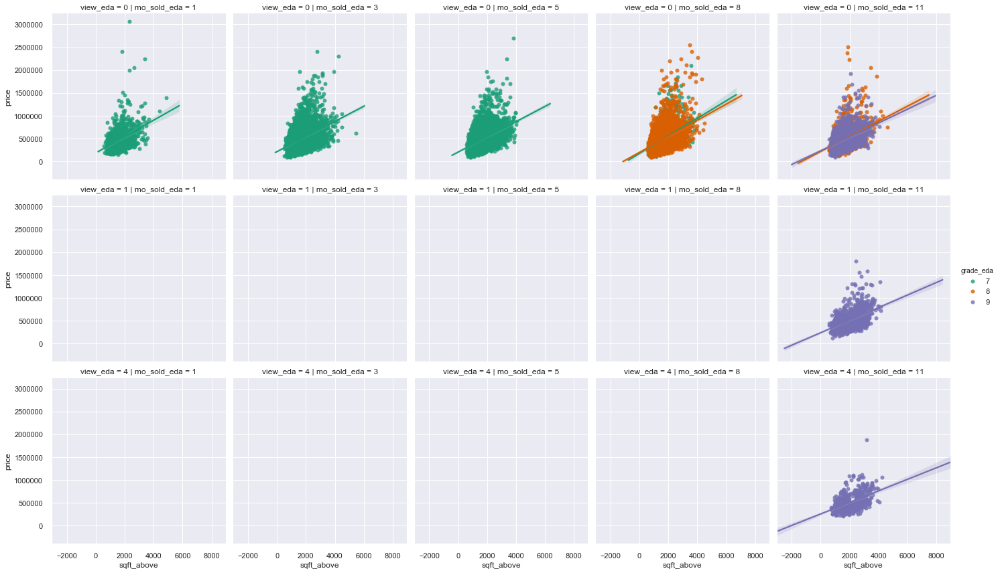

In [76]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='grade_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. price in view and sold month aspects over a range of conditions

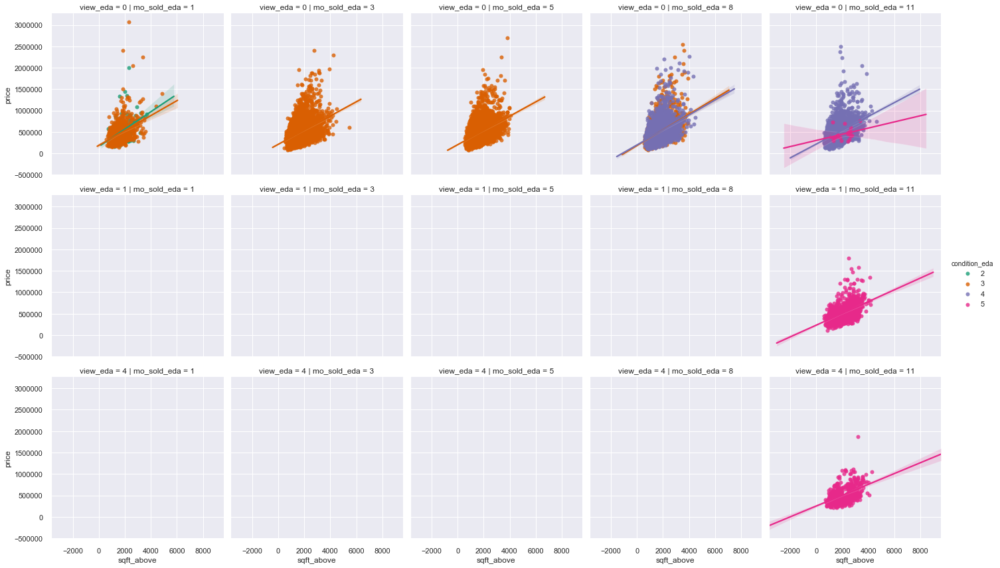

In [77]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. price in view and sold month aspects over a range of latitudes (either more northern or southern)

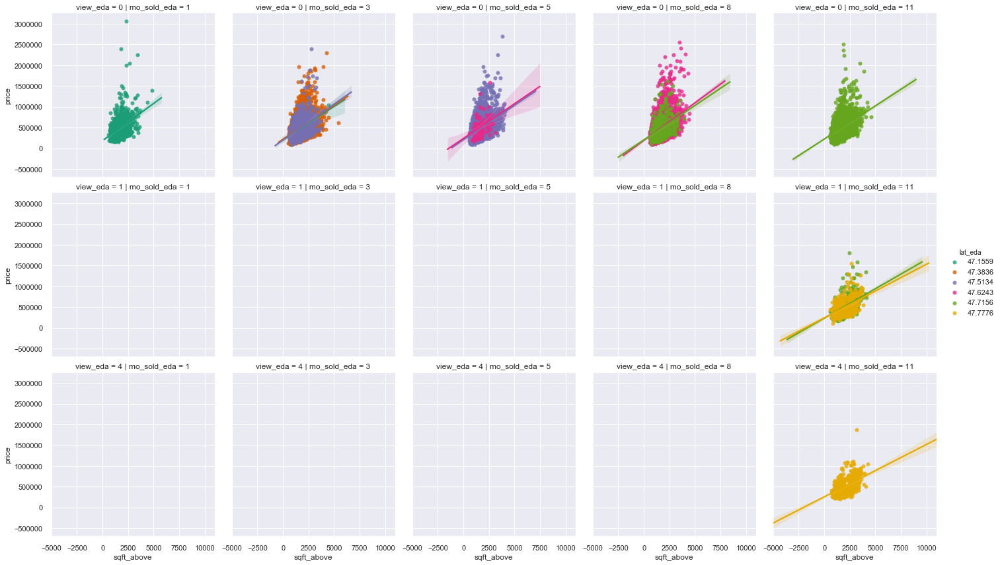

In [78]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='lat_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. price in view and sold month aspects over a range of latitudes (either more northern or southern)

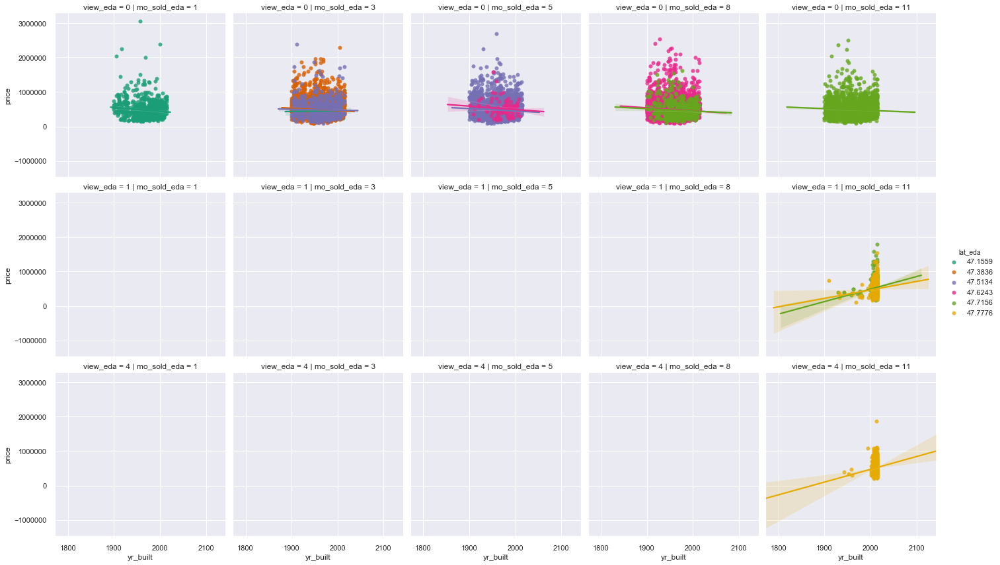

In [79]:
sns.lmplot(x ='yr_built', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='lat_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in view and sold month aspects over a range of latitudes (either more northern or southern)

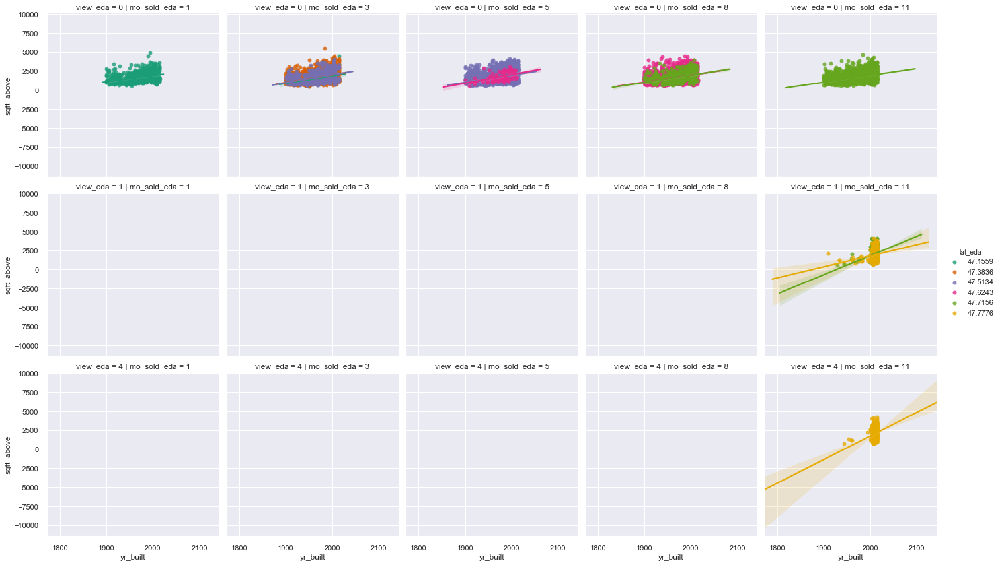

In [80]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='lat_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. price in view and sold month aspects over a range of longitudes (either more eastern or western)

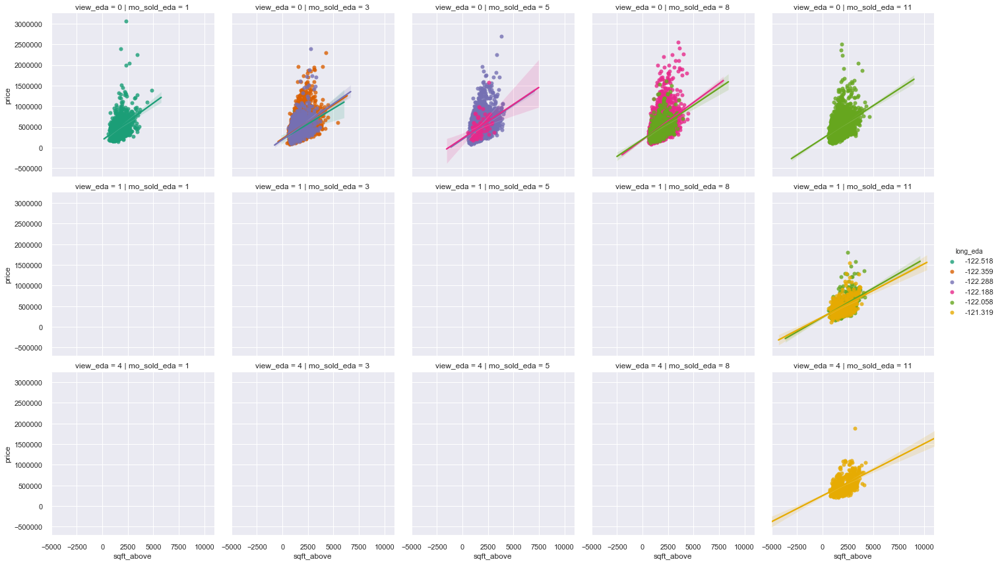

In [81]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='long_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. price in view and sold month aspects over a range of longitudes (either more eastern or western)

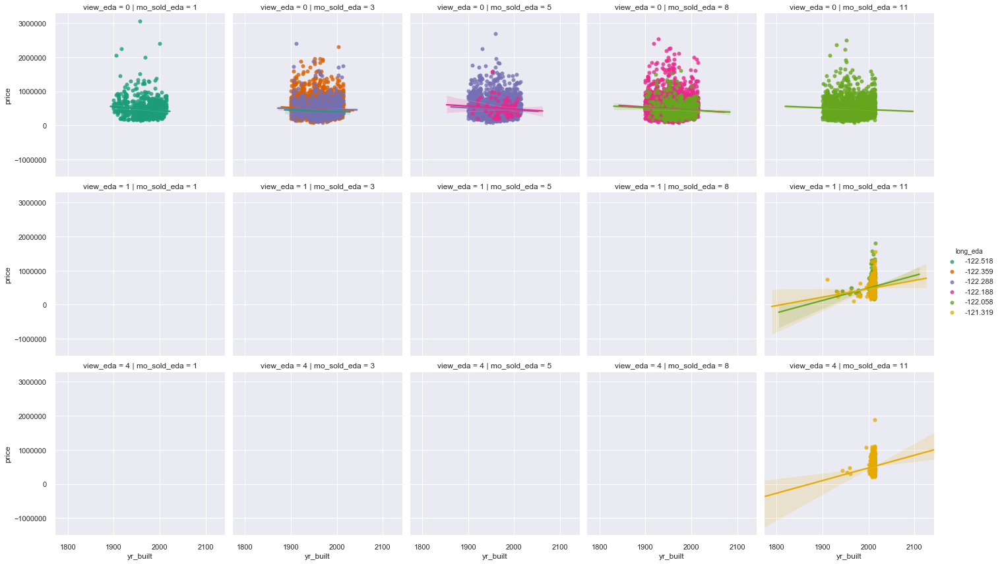

In [82]:
sns.lmplot(x ='yr_built', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='long_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. size in view and sold month aspects over a range of longitudes (either more eastern or western)

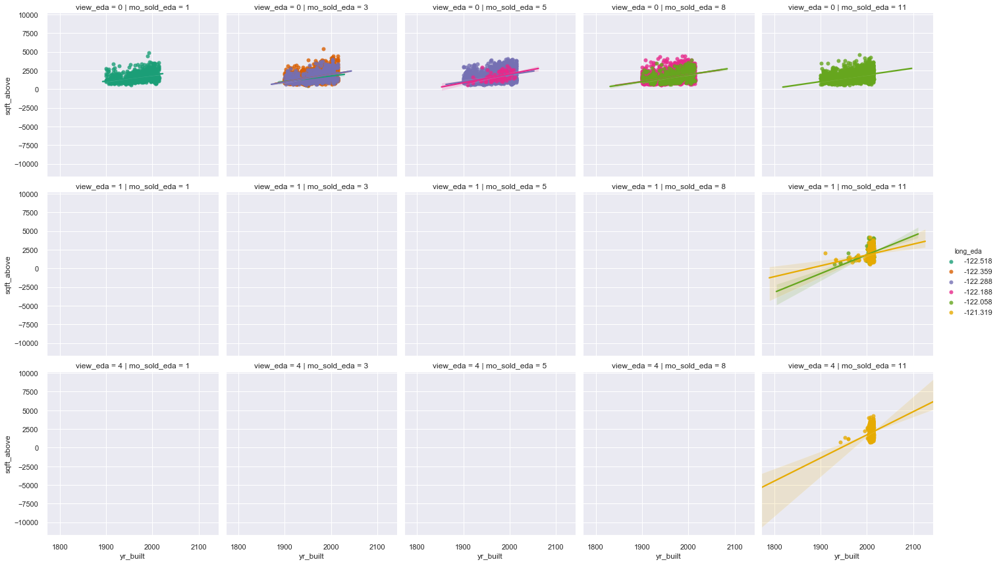

In [83]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='long_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### N/S location vs. price in view and sold month aspects over a range of conditions

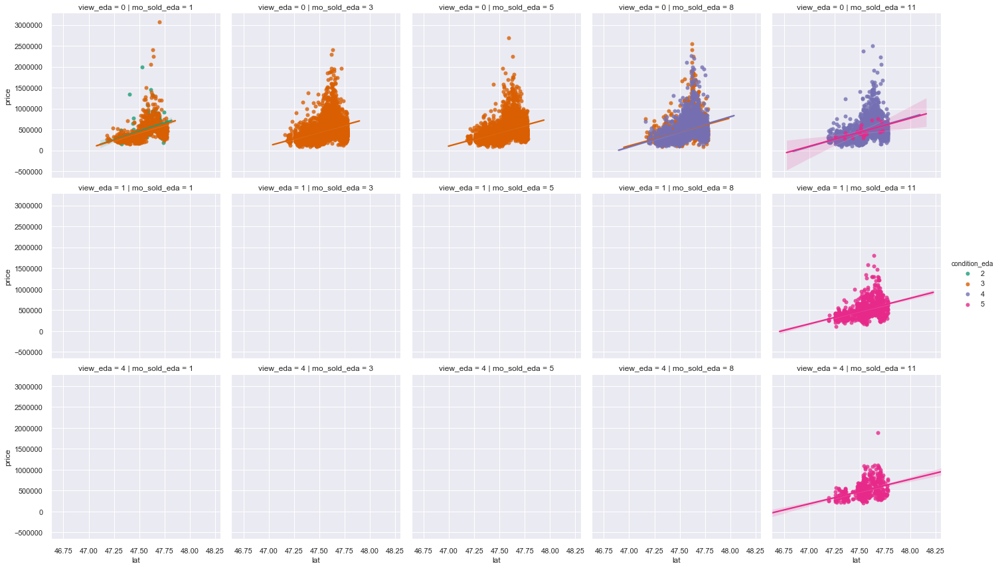

In [84]:
sns.lmplot(x ='lat', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### N/S location vs. house size in view and sold month aspects over a range of conditions

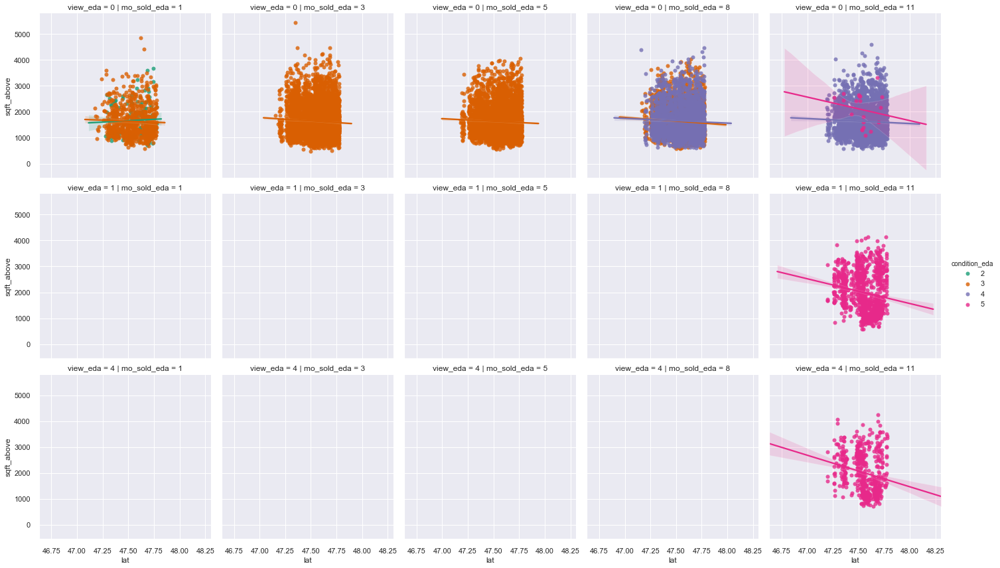

In [85]:
sns.lmplot(x ='lat', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### E/W location vs. price in view and sold month aspects over a range of conditions

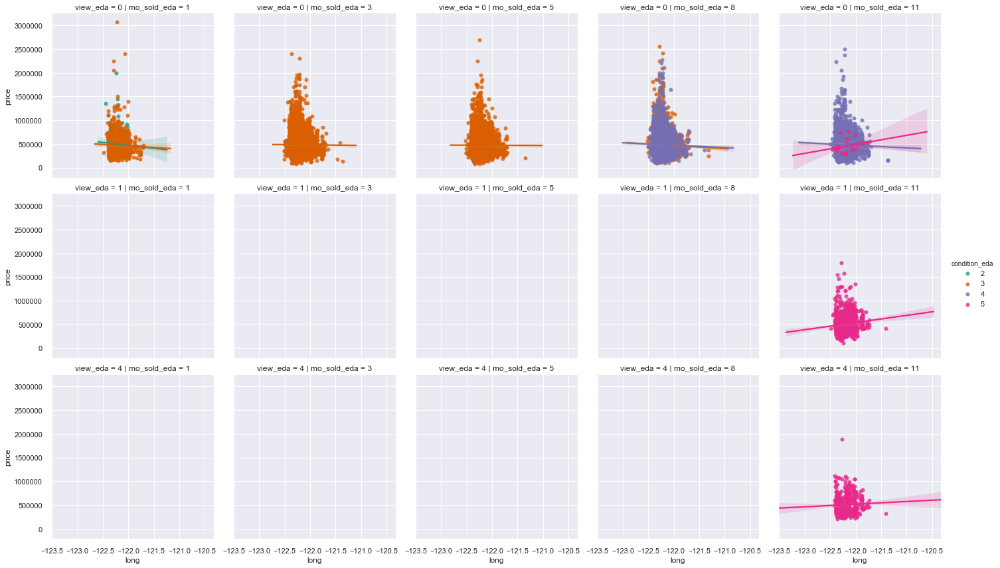

In [86]:
sns.lmplot(x ='long', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### E/W location vs. house size in view and sold month aspects over a range of conditions

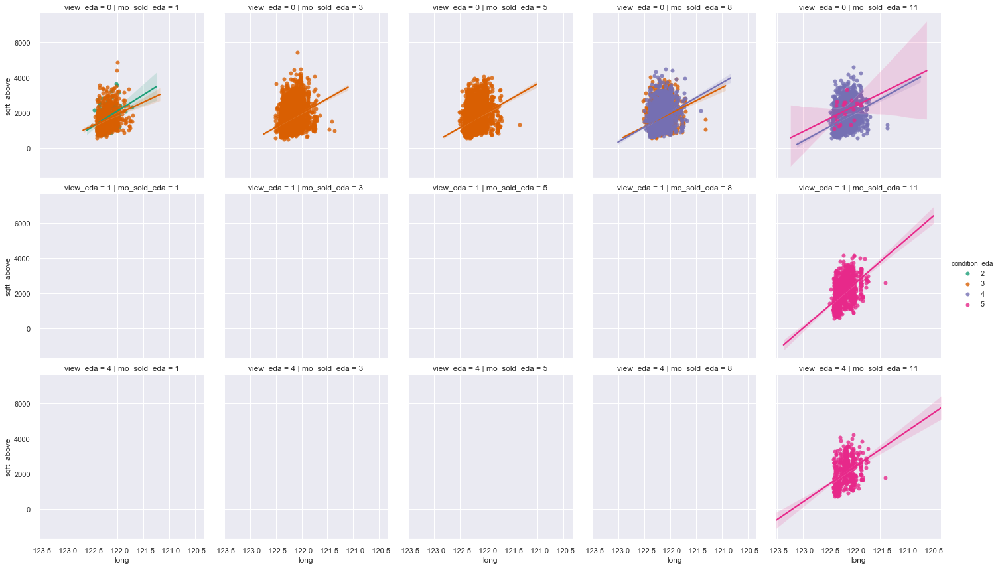

In [87]:
sns.lmplot(x ='long', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. price in view and sold month aspects with renovation

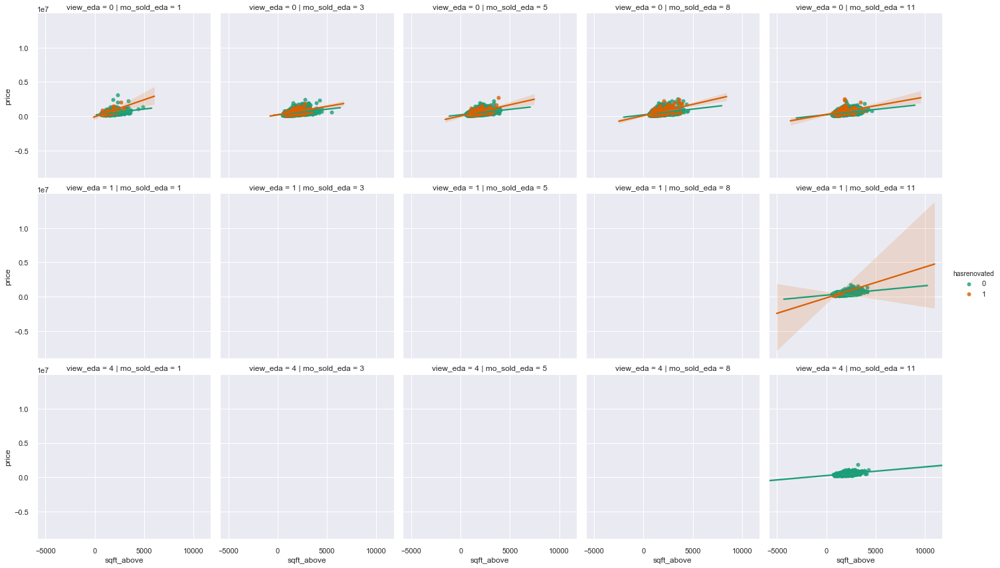

In [88]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasrenovated', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in view and sold month aspects with renovation

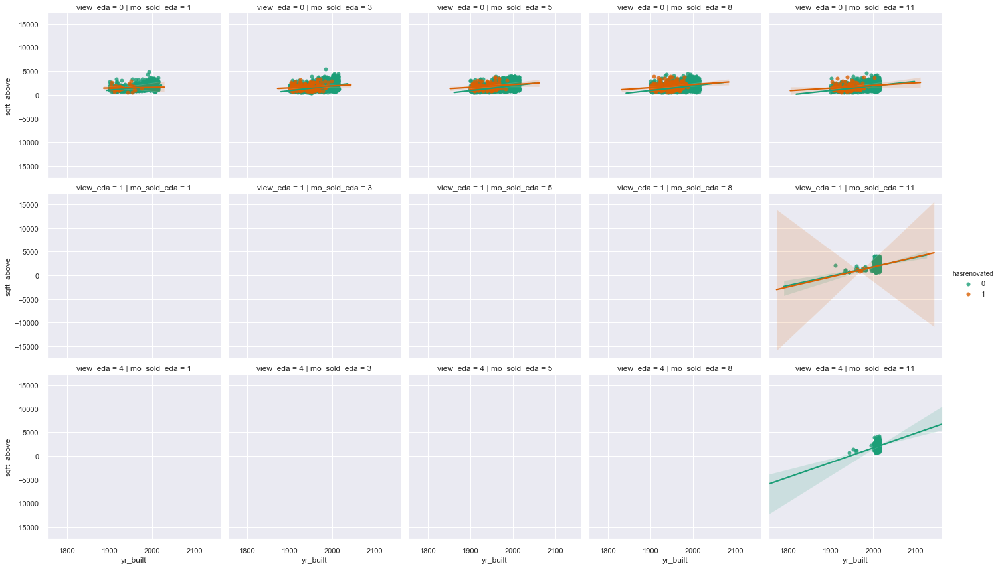

In [89]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasrenovated', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. price in view and sold month aspects with basement

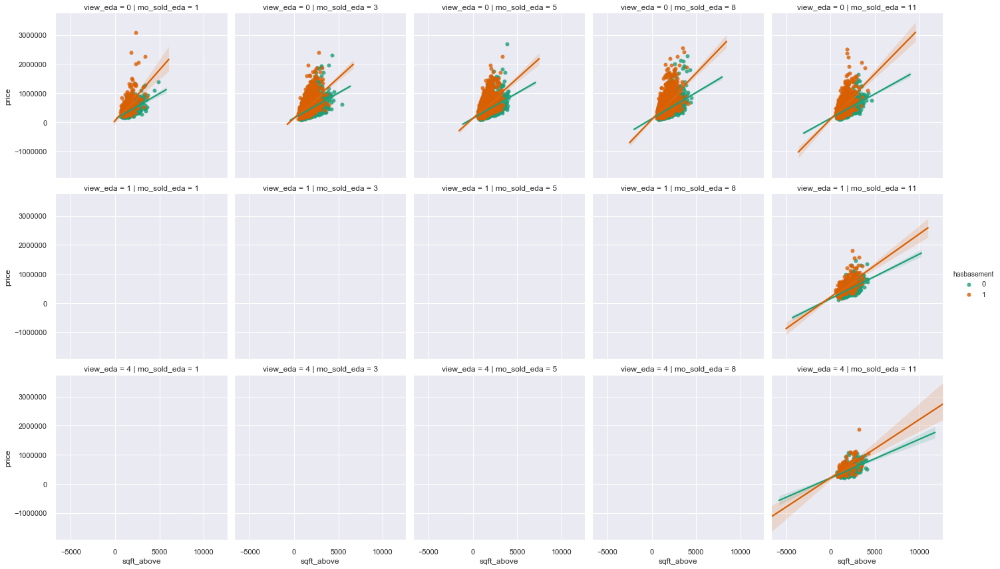

In [90]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbasement', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in view and sold month aspects with basement

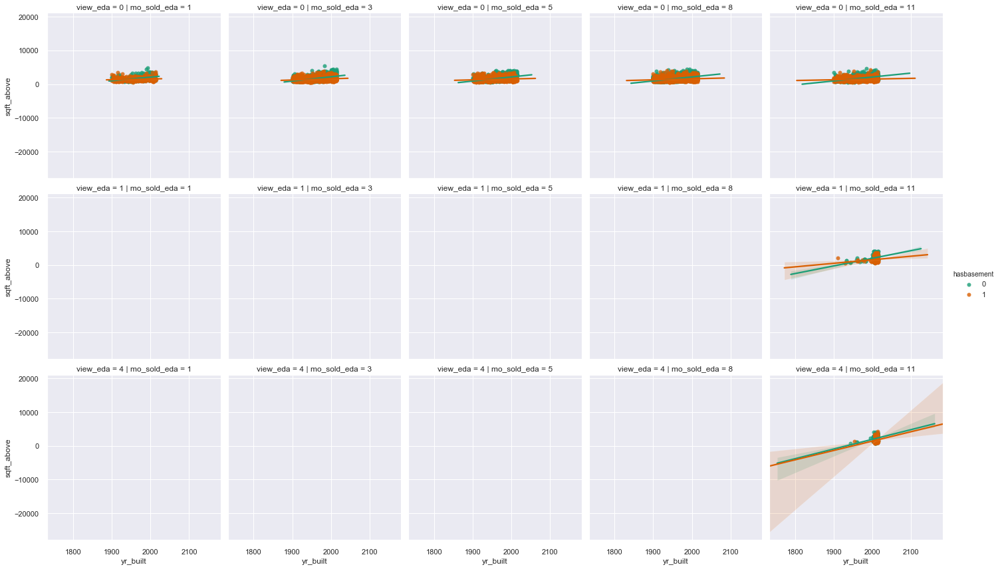

In [91]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbasement', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. its price in view and sold month aspects with larger living area

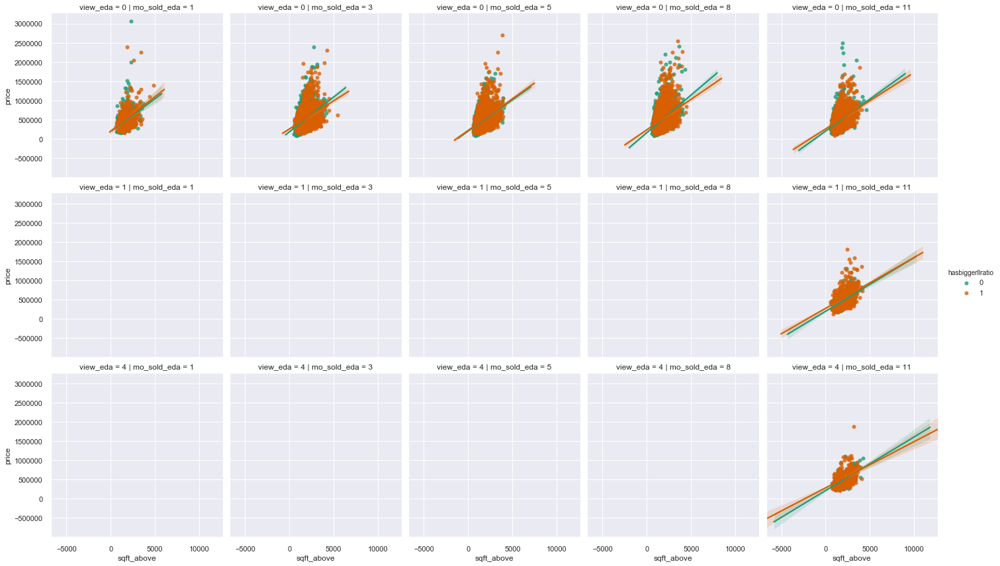

In [92]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerllratio', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in view and sold month aspects with larger living area

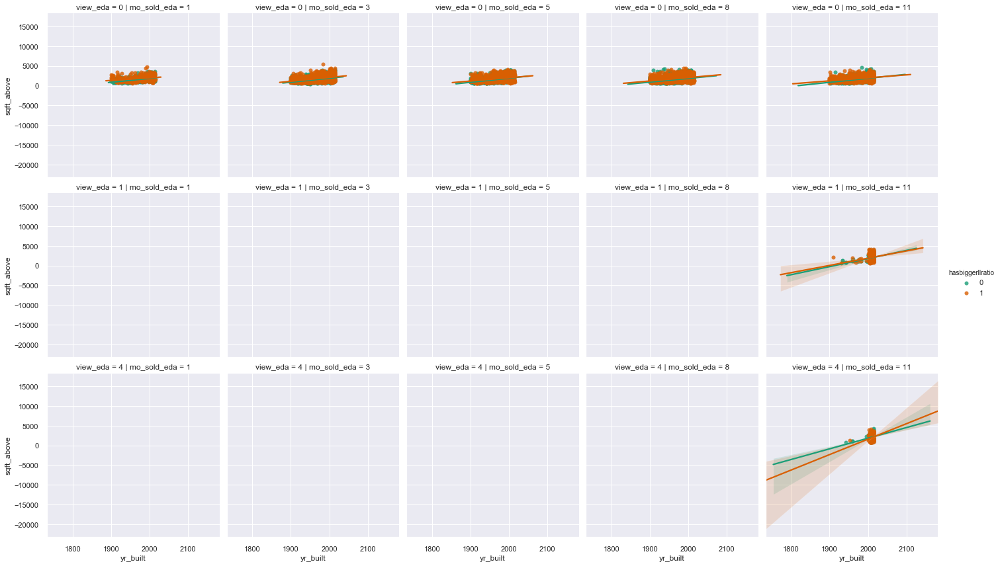

In [93]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerllratio', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. its price in N/S location and sold month aspects with larger living area

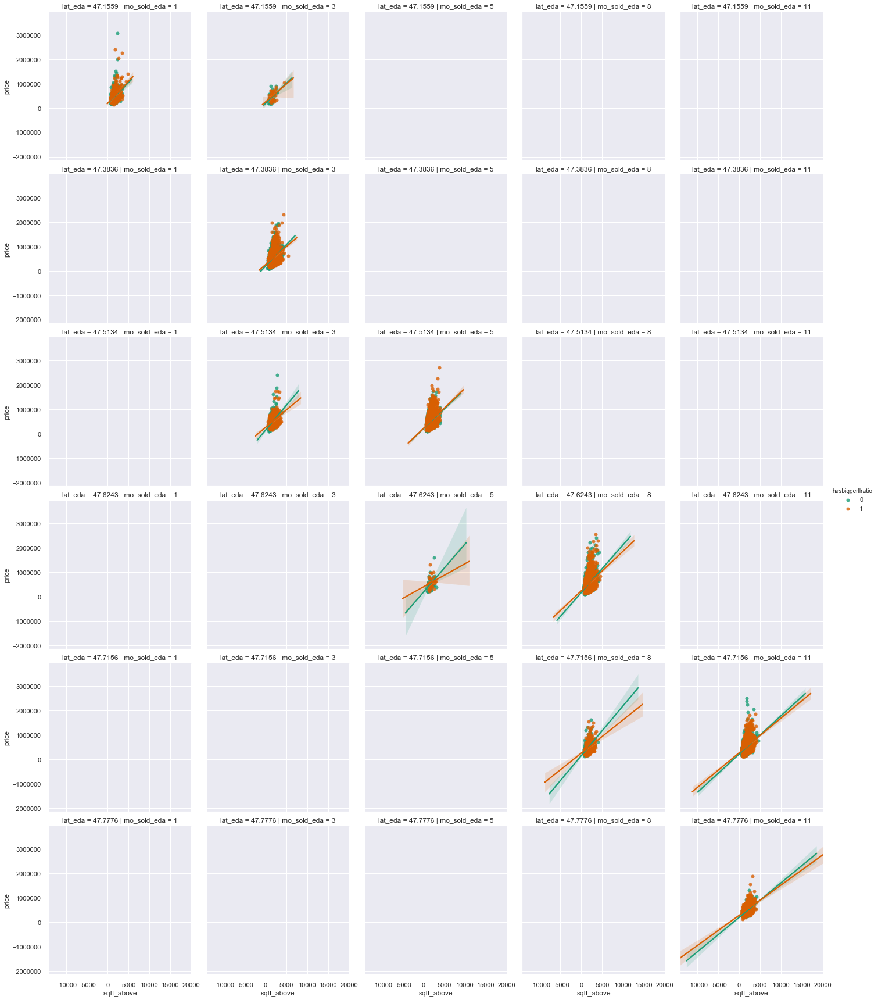

In [94]:
sns.lmplot(x ='sqft_above', y ='price', row='lat_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerllratio', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in N/S location and sold month aspects with larger living area

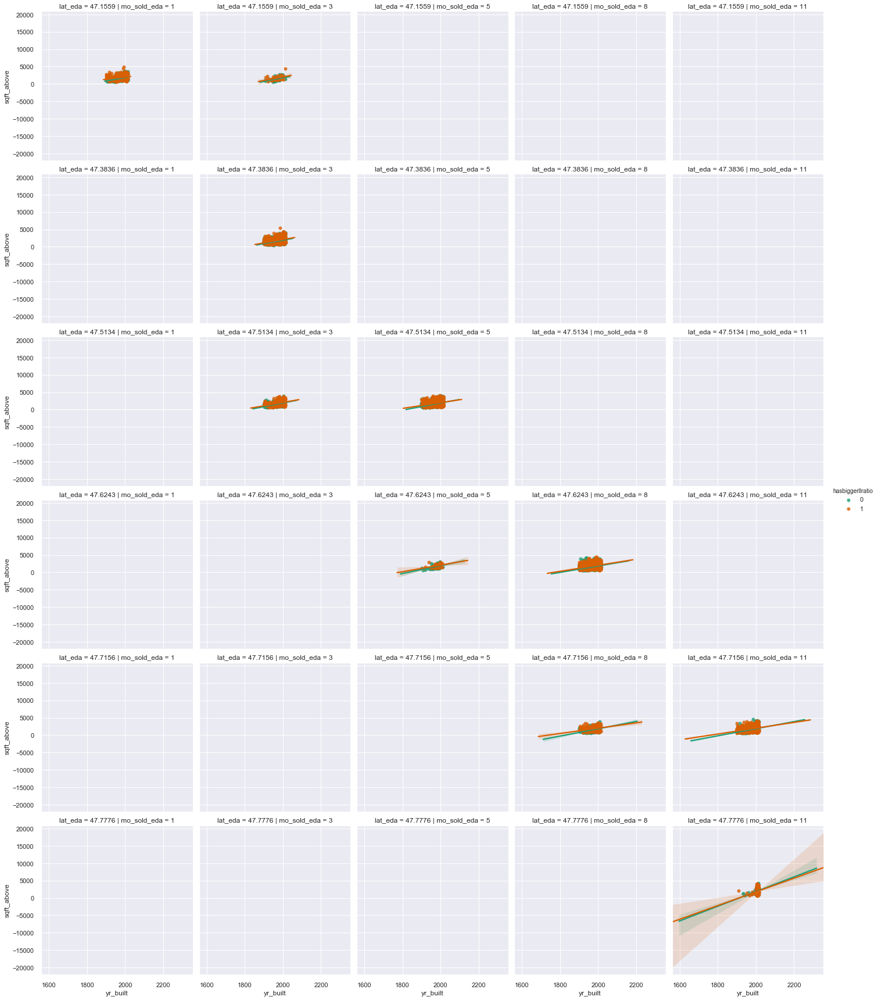

In [95]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='lat_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerllratio', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. its price in E/W location and sold month aspects with larger living area

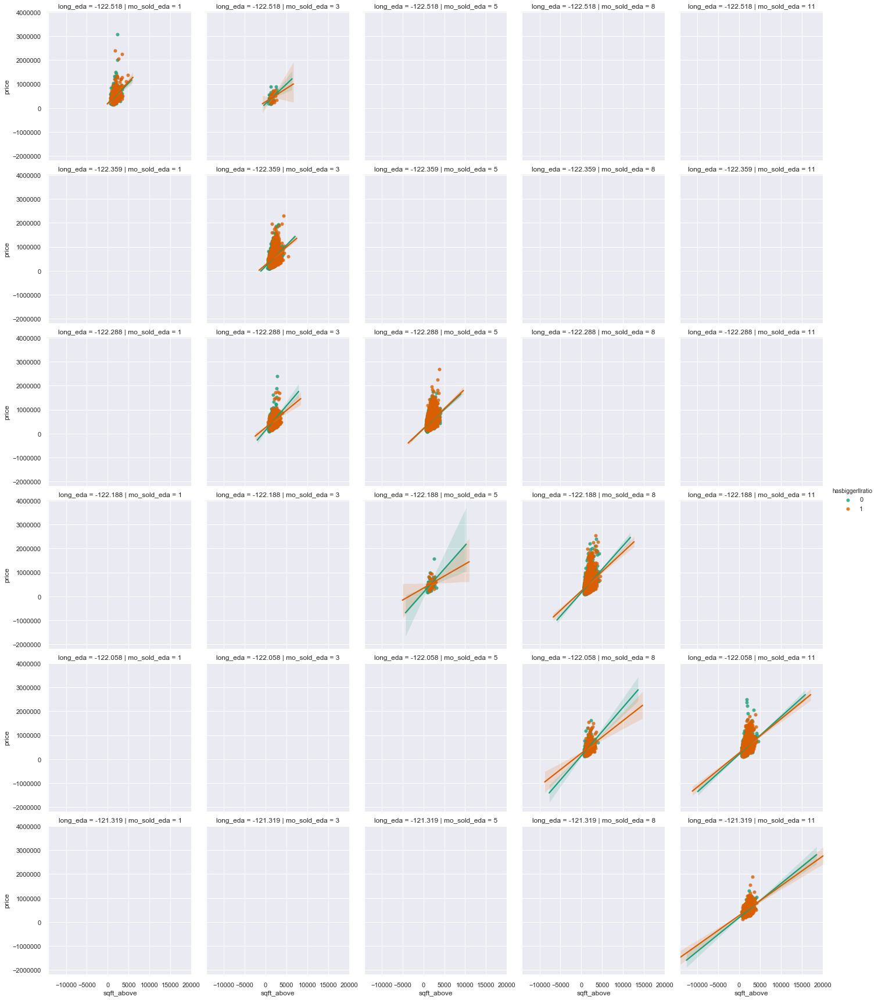

In [96]:
sns.lmplot(x ='sqft_above', y ='price', row='long_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerllratio', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in E/W location and sold month aspects with larger living area

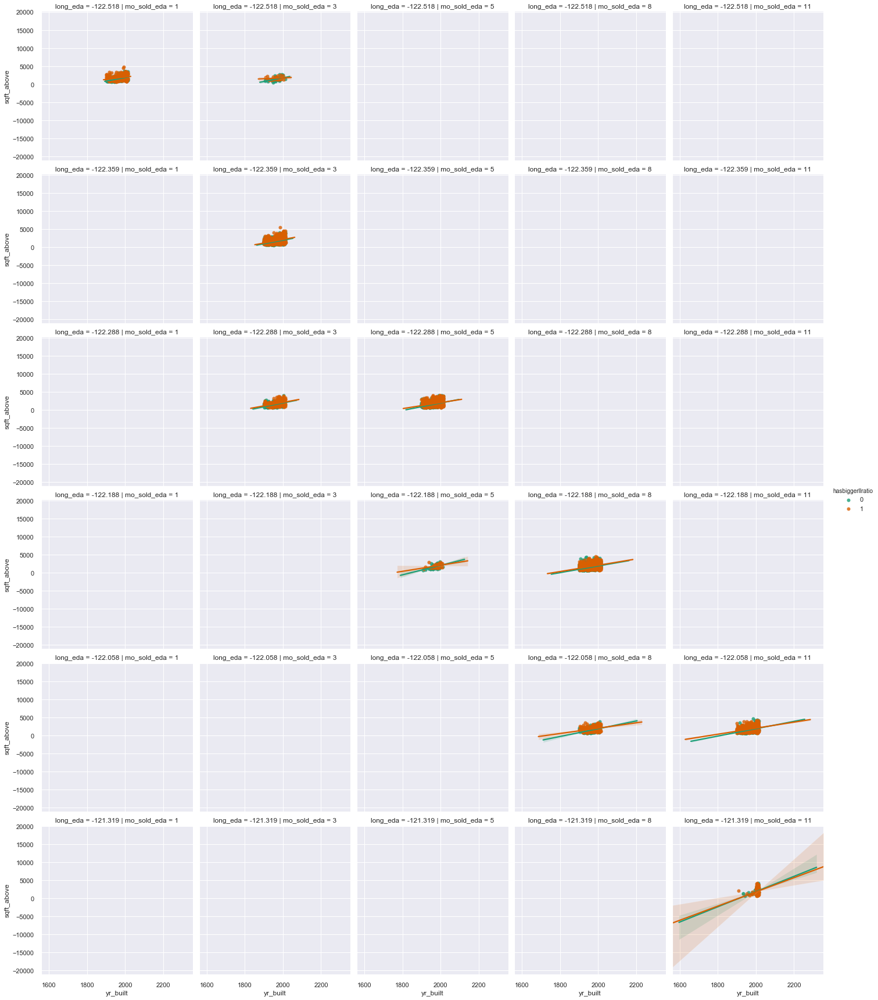

In [97]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='long_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerllratio', height=4, aspect=1, palette='Dark2', fit_reg=True) 

## more feature engineering for modeling: train, test and make predictions
### feature conversion : from continuous to categorical

convert continuous features into categorical ones by re-arranging them into groups at every 10% of their sizes

In [98]:
kc111 = kc11 # make a backup

In [ ]:
#kc11 = kc111

In [99]:
def convert_to_cate(df, col, read=True, intype=True, digit=0):
    df_clone = df.copy()
    df_clone[col] = sorted(df_clone[col])
    
    print(f'no. unique variables in {col}: {df_clone[col].nunique()}')
    if read:
        print(f'unique values as follows: {df_clone[col].unique()}')
    
    q_0 = float(df_clone[col].min())
    q_10 = df_clone[col].quantile(q=0.10)
    q_20 = df_clone[col].quantile(q=0.20)
    q_30 = df_clone[col].quantile(q=0.30)
    q_40 = df_clone[col].quantile(q=0.40)
    q_50 = df_clone[col].median()
    q_60 = df_clone[col].quantile(q=0.60)
    q_70 = df_clone[col].quantile(q=0.70)
    q_80 = df_clone[col].quantile(q=0.80)
    q_90 = df_clone[col].quantile(q=0.90)
    q_100 = float(df_clone[col].max())
            
    print('q0=',round(q_0,digit),'q10=',round(q_10,digit),'q20=',round(q_20,digit),'q30=',round(q_30,digit),
          'q40=',round(q_40,digit))
    print('q50=',round(q_50,digit),'q60=',round(q_60,digit),'q70=',round(q_70,digit),'q80=',round(q_80,digit), 
          'q90=',round(q_90,digit),'q100=',round(q_100,digit))
    print(f'size {df_clone[col].shape[0]}')
    
    for idx, row in df_clone.iterrows():
        if (row[col] <= q_10):
            df_clone.loc[idx,col] = (q_0 + q_10) / 2
        elif (row[col] > q_10) & (row[col] <= q_20):
            df_clone.loc[idx,col] = (q_10 + q_20) / 2
        elif (row[col] > q_20) & (row[col] <= q_30):
            df_clone.loc[idx,col] = (q_20 + q_30) / 2
        elif (row[col] > q_30) & (row[col] <= q_40):
            df_clone.loc[idx,col] = (q_30 + q_40) / 2
        elif (row[col] > q_40) & (row[col] <= q_50):
            df_clone.loc[idx,col] = (q_40 + q_50) / 2
        elif (row[col] > q_50) & (row[col] <= q_60):
            df_clone.loc[idx,col] = (q_50 + q_60) / 2
        elif (row[col] > q_60) & (row[col] <= q_70):
            df_clone.loc[idx,col] = (q_60 + q_70) / 2
        elif (row[col] > q_70) & (row[col] <= q_80):
            df_clone.loc[idx,col] = (q_70 + q_80) / 2
        elif (row[col] > q_80) & (row[col] <= q_90):
            df_clone.loc[idx,col] = (q_80 + q_90) / 2
        elif (row[col] > q_90) & (row[col] <= q_100):
            df_clone.loc[idx,col] = (q_90 + q_100) / 2
        else:
            print('sth.',row[col],'not included!')
            
    df_clone[col] = df_clone[col].apply(np.ceil) # or np.floor
    
    if intype:
        df_clone[col] = df_clone[col].astype('int64')
    else:
        df_clone[col] = df_clone[col].apply(lambda x:round(x,digit))
    
    return df_clone

convert continuous features into categorical ones by chopping them into groups with the same separation size

In [100]:
def convert_to_grps(df, col, sep=5, read=True, intype=True, back=True, digit=0):
    df_clone = df.copy()
    df_clone[col] = sorted(df_clone[col])
    
    print(f'no. unique variables in {col}: {df_clone[col].nunique()}')
    if read:
        print(f'unique values as follows: {df_clone[col].unique()}')
    
    q_0 = float(df_clone[col].min())
    q_10 = df_clone[col].quantile(q=0.10)
    q_20 = df_clone[col].quantile(q=0.20)
    q_30 = df_clone[col].quantile(q=0.30)
    q_40 = df_clone[col].quantile(q=0.40)
    q_50 = df_clone[col].median()
    q_60 = df_clone[col].quantile(q=0.60)
    q_70 = df_clone[col].quantile(q=0.70)
    q_80 = df_clone[col].quantile(q=0.80)
    q_90 = df_clone[col].quantile(q=0.90)
    q_100 = float(df_clone[col].max())
            
    print('q0=',round(q_0,digit),'q10=',round(q_10,digit),'q20=',round(q_20,digit),'q30=',round(q_30,digit),
          'q40=',round(q_40,digit))
    print('q50=',round(q_50,digit),'q60=',round(q_60,digit),'q70=',round(q_70,digit),'q80=',round(q_80,digit), 
          'q90=',round(q_90,digit),'q100=',round(q_100,digit))
    print(f'size {df_clone[col].shape[0]}')
    
    df_clone[col] = np.divide(df_clone[col], sep) 
    df_clone[col] = df_clone[col].apply(np.floor) # or np.ceil
    
    if intype:
        df_clone[col] = df_clone[col].astype('int64')
    else:
        df_clone[col] = df_clone[col].apply(lambda x:round(x,digit))
        
    if back:
        df_clone[col] = np.multiply(df_clone[col], sep)
    
    return df_clone

### feature conversion : from discrete to categorical

house built years and grade combined
(dependency removed for avoiding multicollinearity)

In [101]:
def sep_yrs_grades(df, colA, colB, colrename):
    df_clone = df.copy()
    df_clone[colrename] = 0
    
    for idx, row in df_clone.iterrows():
        df_clone.loc[idx,colrename] = row[colA] * 100 + row[colB] 
        
    df_clone[colrename] = df_clone[colrename].astype('int64')
    
    return df_clone

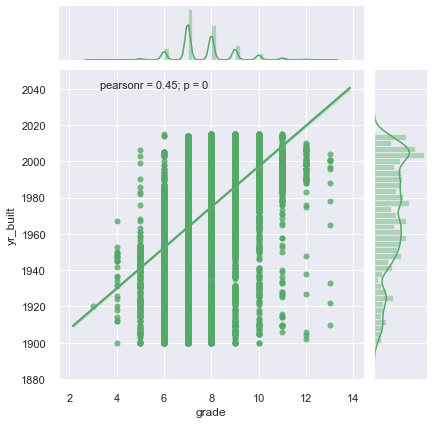

In [102]:
j = sns.jointplot(x='grade', y='yr_built', data=kc11, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

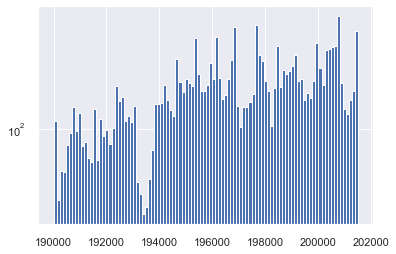

In [103]:
kc11 = sep_yrs_grades(kc11, 'yr_built', 'grade', 'yrgrade_built')
kc11['yrgrade_built'].hist(bins=100, log=True)

In [104]:
print(kc11['yrgrade_built'].nunique())
kc11['yrgrade_built'].value_counts(normalize=True,dropna=False)

736


201408    0.011344
196807    0.010742
196207    0.010464
201409    0.009909
196707    0.009862
            ...   
199412    0.000046
198312    0.000046
191804    0.000046
190004    0.000046
192213    0.000046
Name: yrgrade_built, Length: 736, dtype: float64

unify digital values for features

In [105]:
#kc12['bathrooms'] = np.around(kc12['bathrooms'],2)
kc11['floors'] = np.around(kc11['floors'],1)
#kc12['bedrooms'] = np.around(kc12['bedrooms'],0)
kc11['condition'] = np.around(kc11['condition'],0)
kc11['yrgrade_built'] = np.around(kc11['yrgrade_built'],0)
kc11['waterfront'] = np.around(kc11['waterfront'],0)
kc11['view'] = np.around(kc11['view'],0)
#kc12['hasrenovated'] = np.around(kc12['hasrenovated'],0)
kc11['hasbasement'] = np.around(kc11['hasbasement'],0)
kc11['hasbiggerllratio'] = np.around(kc11['hasbiggerllratio'],0)
#kc12['hasbiggerliving'] = np.around(kc12['hasbiggerliving'],0)
#kc12['hasbiggerlot'] = np.around(kc12['hasbiggerlot'],0)
kc11['hasreno4sale'] = np.around(kc11['hasreno4sale'],0)
#kc12['hasextraliving'] = np.around(kc12['hasextraliving'],0)
kc11['hasinSeattle'] = np.around(kc11['hasinSeattle'],0)
kc11['AvgAreaPerRm'] = np.around(kc11['AvgAreaPerRm'],0)
#kc11['zipcode_yrbuilt'] = np.around(kc11['zipcode_yrbuilt'],0)
kc11['yrmo_sold'] = np.around(kc11['yrmo_sold'],0)

In [106]:
kc12 = kc11.drop(['yr_built','grade'],axis=1)
kc12.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 15 columns):
price                21597 non-null float64
floors               21597 non-null float64
waterfront           21597 non-null int64
view                 21597 non-null int64
condition            21597 non-null int64
sqft_above           21597 non-null int64
hasbasement          21597 non-null int64
hasbiggerllratio     21597 non-null int64
hasreno4sale         21597 non-null int64
AvgAreaPerRm         21597 non-null int64
lat_seattle_diff     21597 non-null float64
long_seattle_diff    21597 non-null float64
hasinSeattle         21597 non-null int64
yrmo_sold            21597 non-null int64
yrgrade_built        21597 non-null int64
dtypes: float64(4), int64(11)
memory usage: 2.5 MB


# exploring data

## count unique values 

In [107]:
def unique_features_plt(df):
    df_clone = df.copy()
    df_clone = df_clone.loc[:, df_clone.dtypes != 'object']
    print(df_clone.info())
    print(df_clone.nunique())
    
    fig, ax = plt.subplots(1,1,figsize = (15, 5)) 
    plt.bar(df_clone.columns,df_clone.nunique(),color='green',alpha=0.4,width=0.2)
    plt.xticks(rotation=90)
    plt.yscale('log')
    plt.show()
    
    return None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 15 columns):
price                21597 non-null float64
floors               21597 non-null float64
waterfront           21597 non-null int64
view                 21597 non-null int64
condition            21597 non-null int64
sqft_above           21597 non-null int64
hasbasement          21597 non-null int64
hasbiggerllratio     21597 non-null int64
hasreno4sale         21597 non-null int64
AvgAreaPerRm         21597 non-null int64
lat_seattle_diff     21597 non-null float64
long_seattle_diff    21597 non-null float64
hasinSeattle         21597 non-null int64
yrmo_sold            21597 non-null int64
yrgrade_built        21597 non-null int64
dtypes: float64(4), int64(11)
memory usage: 2.5 MB
None
price                3622
floors                  6
waterfront              2
view                    5
condition               5
sqft_above            942
hasbasement             2
hasbiggerllrati

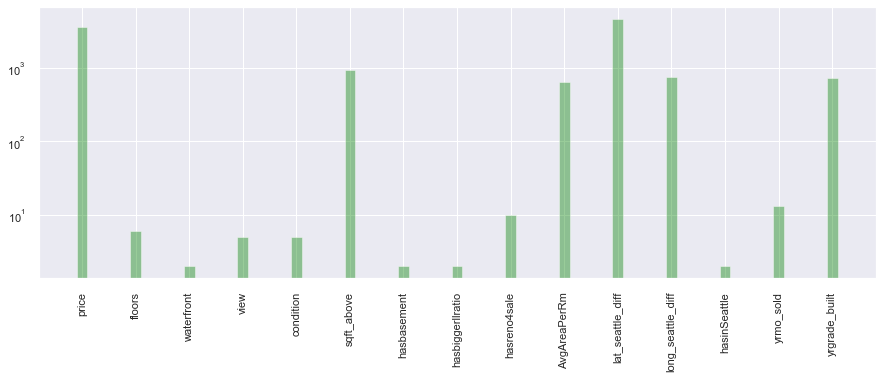

In [108]:
unique_features_plt(kc12)

## understand data

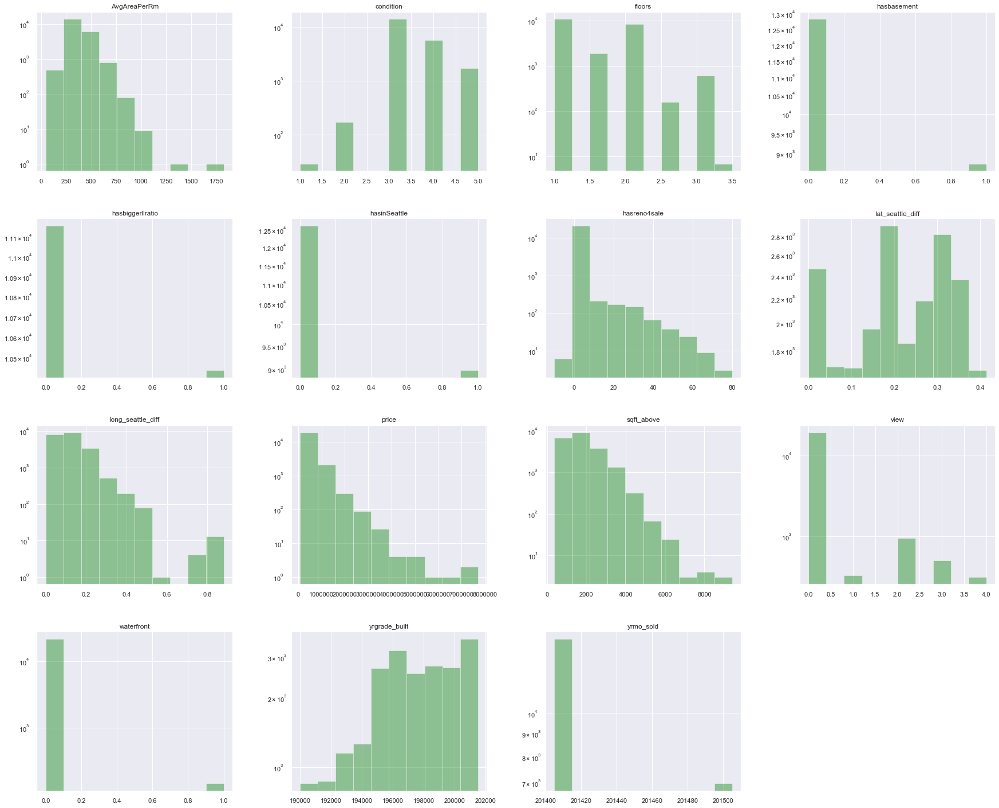

In [109]:
kc12.hist(figsize=(30,25), color='green', alpha=0.4, log=True)
plt.show()

##  inspect features

Column Names and descriptions for Kings County Data Set
* **id** - unique identified for a house
* **date** - house was sold
* **price** -  is prediction target
* **bedrooms** -  of Bedrooms/House
* **bathrooms** -  of bathrooms/bedrooms
* **sqft_living** -  footage of the home
* **sqft_lot** -  footage of the lot
* **floors** -  floors (levels) in house
* **waterfront** - House which has a view to a waterfront
* **view** - Has been viewed
* **condition** - How good the condition is ( Overall )
* **grade** - overall grade given to the housing unit, based on King County grading system
* **sqft_above** - square footage of house apart from basement
* **sqft_basement** - square footage of the basement
* **yr_built** - Built Year
* **yr_renovated** - Year when house was renovated
* **zipcode** - zip
* **lat** - Latitude coordinate
* **long** - Longitude coordinate
* **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors
* **sqft_lot15** - The square footage of the land lots for the nearest 15 neighbors

### continuous features

In [110]:
def check_continuous_feats(df):
    df_clone = df.copy()
    
    for col in df_clone.columns:
        if (df_clone[col].min() < 0) & (df_clone[col].max() < 0):
            print(f'{col} minimal/maximal are negative!')
            df_clone[col+'_korg'] = df_clone[col]
            df_clone[col] = df_clone[col].abs()
        elif (df_clone[col].min() <= 0) & (df_clone[col].max() > 0):
            print(f'{col} minimal is negative!')
            df_clone[col+'_korg'] = df_clone[col]
            df_clone[col] -= df_clone[col].min()
            df_clone[col] += 1
        else:
            print(f'{col} is positive!')
            
    return df_clone

In [111]:
kc_continuous = kc12.loc[:, (kc12.dtypes != 'object') & (kc12.nunique() > 20)]
kc_continuous.columns

Index(['price', 'sqft_above', 'AvgAreaPerRm', 'lat_seattle_diff',
       'long_seattle_diff', 'yrgrade_built'],
      dtype='object')

In [112]:
#kc_continuous = kc12.loc[:, (kc12.dtypes != 'object') & (kc12.nunique() > 10)]
#removed_contfeats = ['sqft_living','grade','mo_sold']
#continuous = list(col for col in kc_continuous.columns if col not in removed_contfeats)
continuous = list(kc_continuous.columns)
print(continuous)
kc_continuous = kc_continuous.loc[:,continuous]
print(kc_continuous.shape)
kc_continuous.head()

['price', 'sqft_above', 'AvgAreaPerRm', 'lat_seattle_diff', 'long_seattle_diff', 'yrgrade_built']
(21597, 6)


,price,sqft_above,AvgAreaPerRm,lat_seattle_diff,long_seattle_diff,yrgrade_built
0,221900.0,1180,295,0.1477,0.0611,195507
1,538000.0,2170,490,0.3575,0.1231,195107
2,180000.0,770,257,0.3744,0.0371,193306
3,604000.0,1050,280,0.1573,0.1971,196507
4,510000.0,1680,336,0.2533,0.1509,198708


price
sqft_above
AvgAreaPerRm
lat_seattle_diff
long_seattle_diff
yrgrade_built


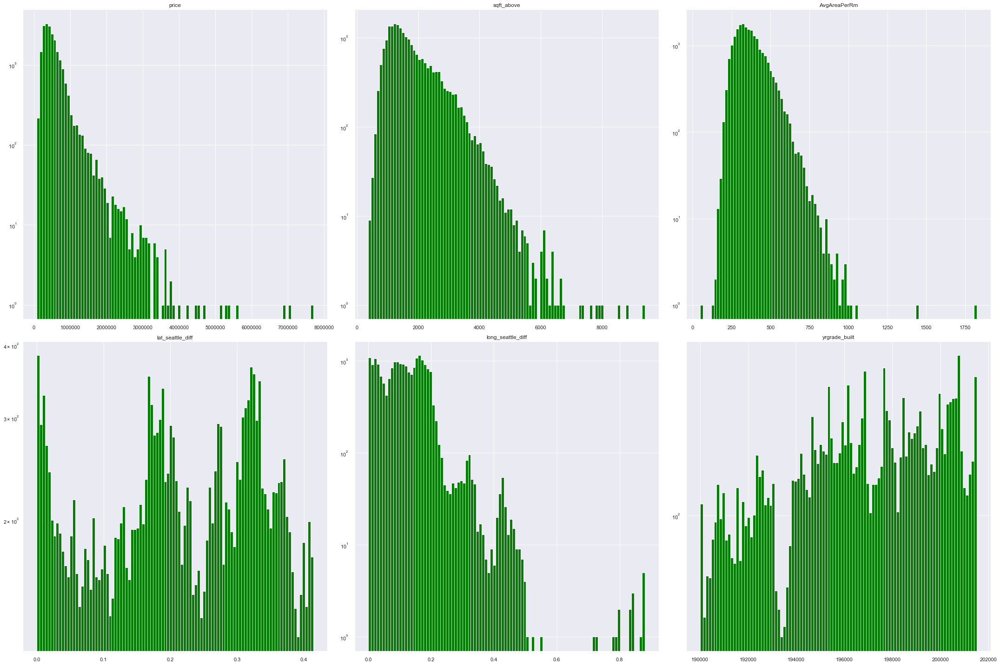

In [113]:
fig, axes = plt.subplots(nrows=kc_continuous.shape[1] // 3, ncols = 3, figsize=(30,20))
for xcol, ax in zip(continuous, axes.flatten()):
    print(xcol)
    ax.hist(kc_continuous[xcol], bins=100, color='green')
    ax.set_title(xcol)
    ax.set_yscale('log')
    
fig.tight_layout()

#### check features column by column before applying logarithm transformation

In [114]:
kc_continuous_fit = check_continuous_feats(kc_continuous)
kc_continuous_fit.head()

price is positive!
sqft_above is positive!
AvgAreaPerRm is positive!
lat_seattle_diff minimal is negative!
long_seattle_diff is positive!
yrgrade_built is positive!


,price,sqft_above,AvgAreaPerRm,lat_seattle_diff,long_seattle_diff,yrgrade_built,lat_seattle_diff_korg
0,221900.0,1180,295,1.1477,0.0611,195507,0.1477
1,538000.0,2170,490,1.3575,0.1231,195107,0.3575
2,180000.0,770,257,1.3744,0.0371,193306,0.3744
3,604000.0,1050,280,1.1573,0.1971,196507,0.1573
4,510000.0,1680,336,1.2533,0.1509,198708,0.2533


In [117]:
kc_continuous_fit = kc_continuous_fit.drop(['lat_seattle_diff_korg'],axis=1)

#### logarithm transformation (scaling) and standard normalization 

Note: we removed columns with non-positive values before applying logarithm transformation.

In [118]:
# log features

#removed_feats = ['yr_sdiff_korg','yr_rdiff_korg','yr_srdif_korg']
#removed_feats = ['long_korg']
#kc_continuous_fit = kc_continuous_fit.drop(removed_feats,axis=1)

continuous = kc_continuous_fit.columns
log_names = [f'{col}_log' for col in continuous]

kc_log = np.log(kc_continuous_fit)
kc_log.columns = log_names

kc_log.head()

,price_log,sqft_above_log,AvgAreaPerRm_log,lat_seattle_diff_log,long_seattle_diff_log,yrgrade_built_log
0,12.309982,7.073270,5.686975,0.137760,-2.795243,12.183351
1,13.195614,7.682482,6.194405,0.305645,-2.094758,12.181303
2,12.100712,6.646391,5.549076,0.318017,-3.294138,12.172030
3,13.311329,6.956545,5.634790,0.146090,-1.624044,12.188453
4,13.142166,7.426549,5.817111,0.225780,-1.891138,12.199592


In [119]:
# normalize (subract mean and divide by std)

def normalize(feature):
    return (feature - feature.mean()) / feature.std()

kc_log_norm = kc_log.apply(normalize)
kc_log_norm.head()

,price_log,sqft_above_log,AvgAreaPerRm_log,lat_seattle_diff_log,long_seattle_diff_log,yrgrade_built_log
0,-1.401998,-0.753565,-0.770991,-0.479738,-0.259714,-0.537535
1,0.279938,0.672693,1.165257,1.214572,0.379686,-0.674428
2,-1.799430,-1.752954,-1.297186,1.339437,-0.715103,-1.294285
3,0.499698,-1.026835,-0.970121,-0.395673,0.809351,-0.196525
4,0.178434,0.073515,-0.274420,0.408570,0.565549,0.547966


price_log
sqft_above_log
AvgAreaPerRm_log
lat_seattle_diff_log
long_seattle_diff_log
yrgrade_built_log


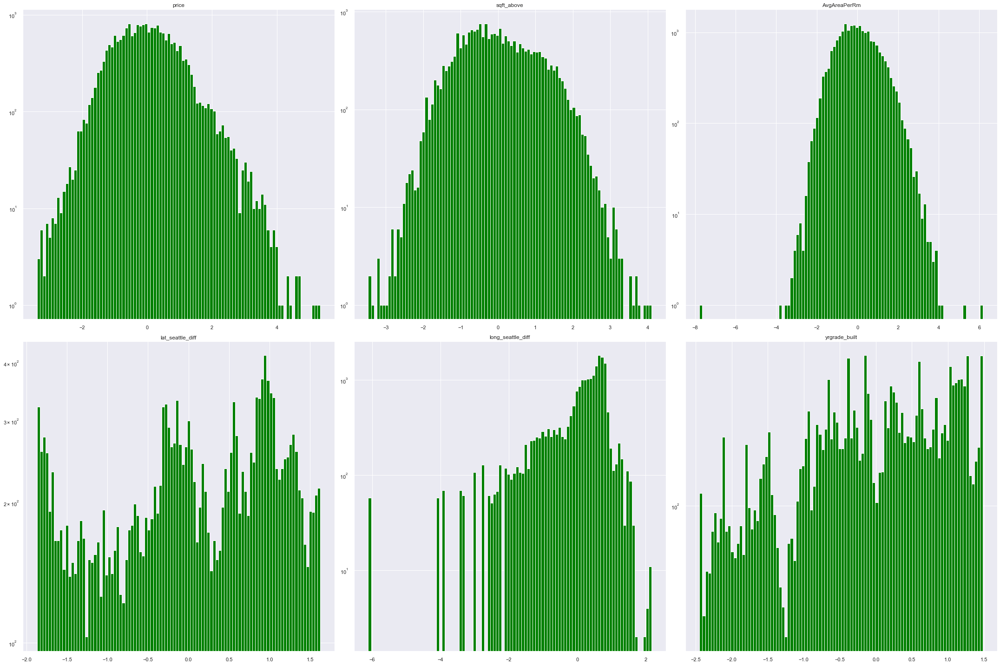

In [120]:
fig2, axes = plt.subplots(nrows=kc_log_norm.shape[1] // 3, ncols = 3, figsize=(30,20))
for xcol, ax in zip(continuous, axes.flatten()):
    print(xcol+'_log')
    ax.hist(kc_log_norm[xcol+'_log'], bins=100, color='green')
    ax.set_title(xcol)
    ax.set_yscale('log')
    
fig2.tight_layout()

### categoricals features

In [121]:
kc12.columns

Index(['price', 'floors', 'waterfront', 'view', 'condition', 'sqft_above',
       'hasbasement', 'hasbiggerllratio', 'hasreno4sale', 'AvgAreaPerRm',
       'lat_seattle_diff', 'long_seattle_diff', 'hasinSeattle', 'yrmo_sold',
       'yrgrade_built'],
      dtype='object')

In [122]:
kc_continuous_fit.columns

Index(['price', 'sqft_above', 'AvgAreaPerRm', 'lat_seattle_diff',
       'long_seattle_diff', 'yrgrade_built'],
      dtype='object')

In [123]:
categorical = ['price','floors','waterfront','view','hasbasement','hasbiggerllratio',
               'hasreno4sale','hasinSeattle','yrmo_sold','condition']
kc_categorical = kc12.loc[:, categorical]
print(kc_categorical.shape)
kc_categorical.head()

(21597, 10)


,price,floors,waterfront,view,hasbasement,hasbiggerllratio,hasreno4sale,hasinSeattle,yrmo_sold,condition
0,221900.0,1.0,0,0,0,0,0,1,201410,3
1,538000.0,2.0,0,0,1,1,30,1,201412,3
2,180000.0,1.0,0,0,0,0,0,0,201502,3
3,604000.0,1.0,0,0,1,1,0,1,201412,5
4,510000.0,1.0,0,0,0,0,0,0,201502,3


price
floors
waterfront
view
hasbasement
hasbiggerllratio
hasreno4sale
hasinSeattle
yrmo_sold
condition


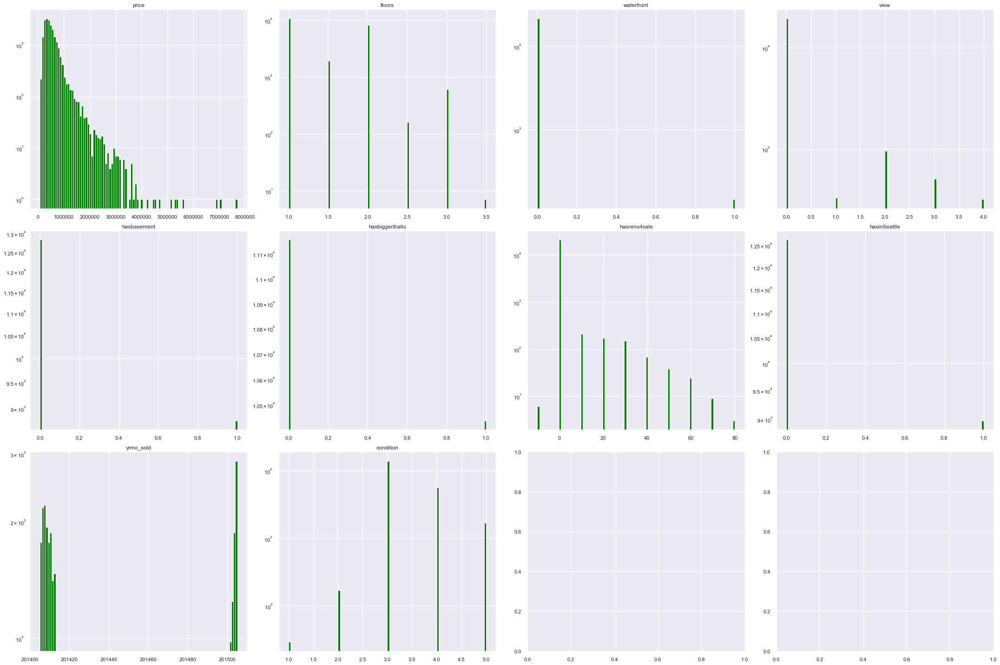

In [124]:
fig3, axes = plt.subplots(nrows=kc_categorical.shape[1] // 3, ncols = 4, figsize=(30,20))
for xcol, ax in zip(categorical, axes.flatten()):
    print(xcol)
    ax.hist(kc_categorical[xcol], bins=100, color='green')
    ax.set_title(xcol)
    ax.set_yscale('log')
    
fig3.tight_layout()

## check linearity
### continuous features

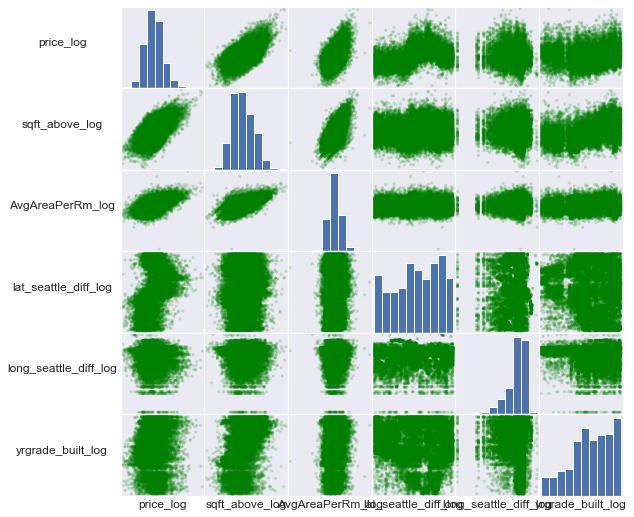

In [125]:
# Your code here 
sm = pd.plotting.scatter_matrix(kc_log_norm, color='green', alpha=0.2, figsize=[9, 9]);

# Rotates the text
[s.xaxis.label.set_rotation(0) for s in sm.reshape(-1)]
[s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]

# May need to offset label when rotating to prevent overlap of figure
[s.get_yaxis().set_label_coords(-0.7,0.5) for s in sm.reshape(-1)]

# Hide all ticks
[s.set_xticks(()) for s in sm.reshape(-1)]
[s.set_yticks(()) for s in sm.reshape(-1)]

plt.show()

In [126]:
kc_log_norm.corr()

,price_log,sqft_above_log,AvgAreaPerRm_log,lat_seattle_diff_log,long_seattle_diff_log,yrgrade_built_log
price_log,1.000000,0.586013,0.567875,0.435444,0.000679,0.079252
sqft_above_log,0.586013,1.000000,0.651917,-0.018263,-0.068988,0.450238
AvgAreaPerRm_log,0.567875,0.651917,1.000000,0.069644,-0.005757,0.141515
lat_seattle_diff_log,0.435444,-0.018263,0.069644,1.000000,0.072495,-0.151932
long_seattle_diff_log,0.000679,-0.068988,-0.005757,0.072495,1.000000,-0.075482
yrgrade_built_log,0.079252,0.450238,0.141515,-0.151932,-0.075482,1.000000


In [127]:
cc1_df = kc_log_norm.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc1_df.head())
cc1_df['pairs'] = list(zip(cc1_df.level_0, cc1_df.level_1))
cc1pairs_df = cc1_df.set_index('pairs')
cc1pairs_df = cc1pairs_df.drop(['level_1', 'level_0'], axis=1)
cc1pairs_df.columns = ['cc']
cc1pairs_df = cc1pairs_df.drop_duplicates(keep='first')
cc1pairs_df.head()

                  level_0                level_1         0
4               price_log  long_seattle_diff_log  0.000679
24  long_seattle_diff_log              price_log  0.000679
26  long_seattle_diff_log       AvgAreaPerRm_log  0.005757
16       AvgAreaPerRm_log  long_seattle_diff_log  0.005757
9          sqft_above_log   lat_seattle_diff_log  0.018263


,cc
pairs,
"(price_log, long_seattle_diff_log)",0.000679
"(long_seattle_diff_log, AvgAreaPerRm_log)",0.005757
"(sqft_above_log, lat_seattle_diff_log)",0.018263
"(long_seattle_diff_log, sqft_above_log)",0.068988
"(lat_seattle_diff_log, AvgAreaPerRm_log)",0.069644


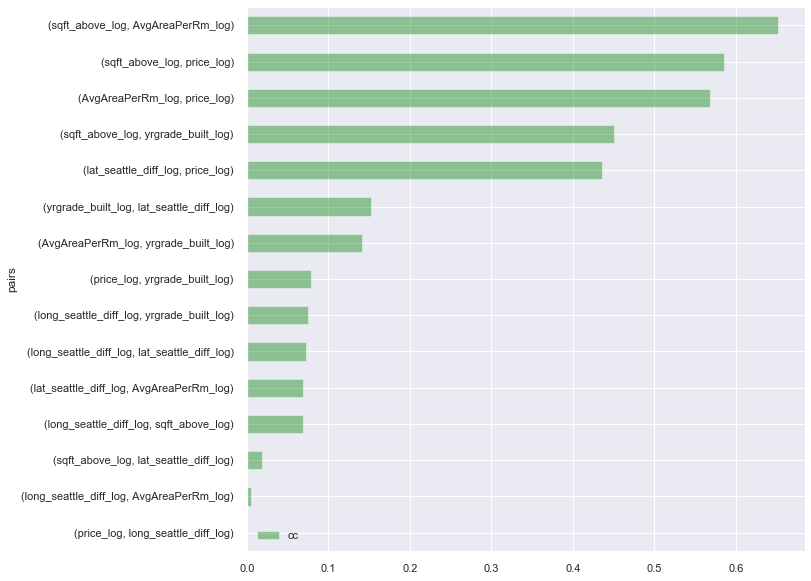

In [128]:
cc1pairs_update_df = cc1pairs_df[cc1pairs_df.cc<1]
cc1pairs_update_df.plot.barh(figsize=(10,10), color='green', alpha=0.4)

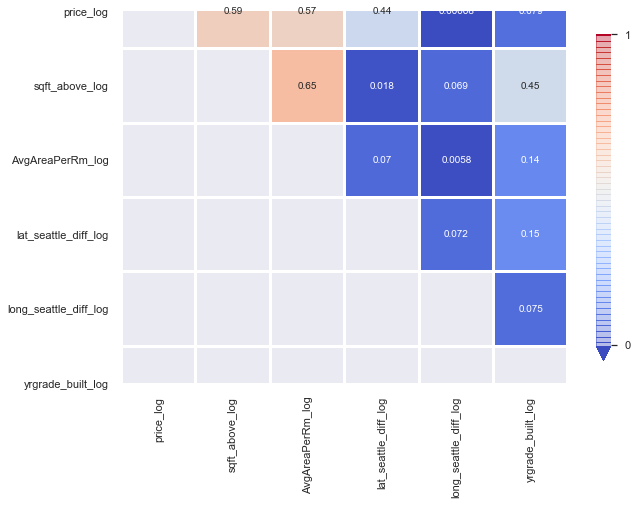

In [133]:
plt.figure(figsize=(10,10))
cbar_kws = {"orientation":"vertical", 
            "shrink":.6,
            'extend':'min', 
            'extendfrac':0.05, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(kc_log_norm.corr().abs(), mask=np.tril(kc_log_norm.corr().abs()), cmap='coolwarm', center=0.5, linewidths=2, 
            square= True, annot=True, cbar_kws=cbar_kws)
plt.show()

In [130]:
def corrfunc(x, y, **kws):
    (r, p) = pearsonr(x, y)
    ax = plt.gca()
    ax.annotate(r"$\rho$ = " + str(round(r, 2)), xy=(.1, 1.), size=15, xycoords=ax.transAxes)
    ax.annotate(f"p = {p:.3f}", xy=(.6, 1.), size=15, xycoords=ax.transAxes)

In [131]:
def corr(x, y, **kwargs):
    
    # Calculate the value
    coef = np.corrcoef(x, y)[0][1]
    # Make the label
    label = r'$\rho$ = ' + str(round(coef, 2))
    
    # Add the label to the plot
    ax = plt.gca()
    ax.annotate(label, xy = (.2, .95), size=20, xycoords = ax.transAxes)

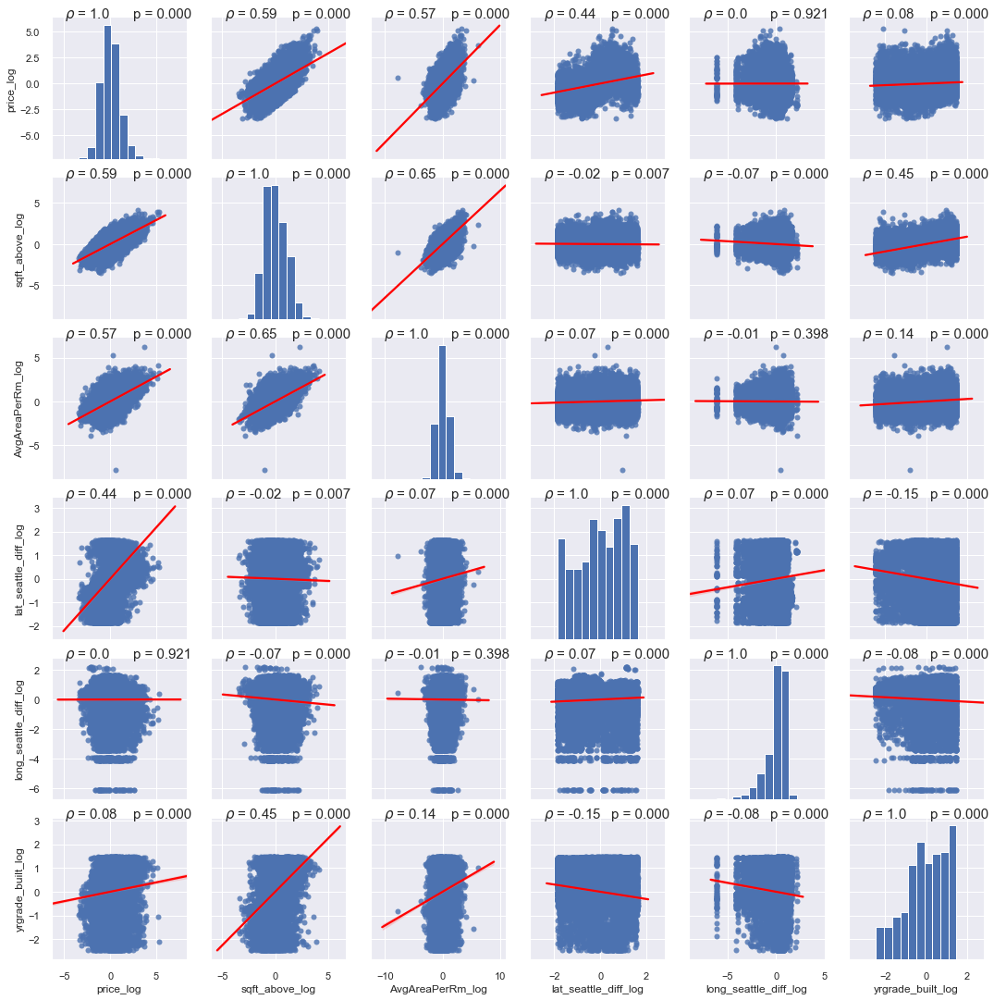

In [132]:
cont_feats = list(kc_log_norm.columns)
g = sns.pairplot(kc_log_norm, vars = cont_feats, kind='reg', plot_kws={'line_kws':{'color':'red'}})
g.map(corrfunc)
plt.show()

### categorical features

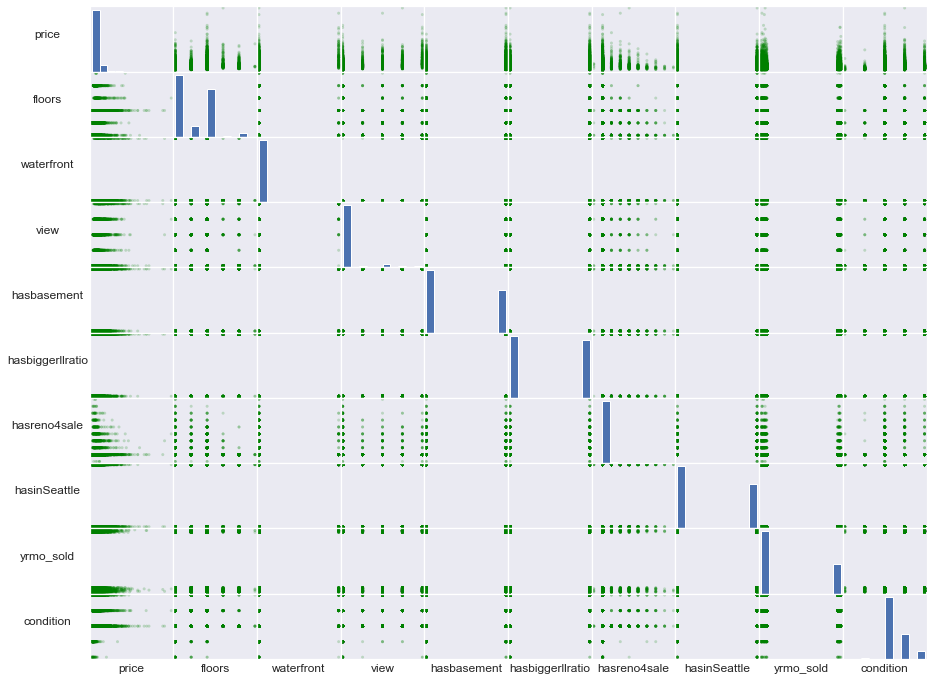

In [134]:
sm = pd.plotting.scatter_matrix(kc_categorical, color='green', alpha=0.2, figsize=[15, 12]);

# Rotates the text
[s.xaxis.label.set_rotation(0) for s in sm.reshape(-1)]
[s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]

# May need to offset label when rotating to prevent overlap of figure
[s.get_yaxis().set_label_coords(-0.5,0.5) for s in sm.reshape(-1)]

# Hide all ticks
[s.set_xticks(()) for s in sm.reshape(-1)]
[s.set_yticks(()) for s in sm.reshape(-1)]

plt.show()

In [135]:
kc_categorical.corr()

,price,floors,waterfront,view,hasbasement,hasbiggerllratio,hasreno4sale,hasinSeattle,yrmo_sold,condition
price,1.000000,0.256804,0.264306,0.393497,0.175472,0.135493,0.073771,-0.011959,0.003231,0.036056
floors,0.256804,1.000000,0.020797,0.028414,-0.248292,0.185191,-0.002031,-0.052148,-0.022559,-0.264075
waterfront,0.264306,0.020797,1.000000,0.380543,0.039933,0.012925,0.085981,0.006124,-0.004713,0.016648
view,0.393497,0.028414,0.380543,1.000000,0.176662,0.013430,0.083930,0.075283,0.000943,0.045622
hasbasement,0.175472,-0.248292,0.039933,0.176662,1.000000,0.193480,0.021566,0.223627,-0.008228,0.129050
hasbiggerllratio,0.135493,0.185191,0.012925,0.013430,0.193480,1.000000,0.026868,0.071422,-0.011479,0.022196
hasreno4sale,0.073771,-0.002031,0.085981,0.083930,0.021566,0.026868,1.000000,0.060212,-0.011351,-0.013741
hasinSeattle,-0.011959,-0.052148,0.006124,0.075283,0.223627,0.071422,0.060212,1.000000,-0.002900,0.037500
yrmo_sold,0.003231,-0.022559,-0.004713,0.000943,-0.008228,-0.011479,-0.011351,-0.002900,1.000000,-0.046803
condition,0.036056,-0.264075,0.016648,0.045622,0.129050,0.022196,-0.013741,0.037500,-0.046803,1.000000


In [136]:
cc2_df = kc_categorical.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc2_df.head())
cc2_df['pairs'] = list(zip(cc2_df.level_0, cc2_df.level_1))
cc2pairs_df = cc2_df.set_index('pairs')
cc2pairs_df = cc2pairs_df.drop(['level_1', 'level_0'], axis=1)
cc2pairs_df.columns = ['cc']
cc2pairs_df = cc2pairs_df.drop_duplicates(keep='first')
cc2pairs_df.head()

         level_0       level_1         0
38          view     yrmo_sold  0.000943
83     yrmo_sold          view  0.000943
16        floors  hasreno4sale  0.002031
61  hasreno4sale        floors  0.002031
87     yrmo_sold  hasinSeattle  0.002900


,cc
pairs,
"(view, yrmo_sold)",0.000943
"(floors, hasreno4sale)",0.002031
"(yrmo_sold, hasinSeattle)",0.002900
"(price, yrmo_sold)",0.003231
"(waterfront, yrmo_sold)",0.004713


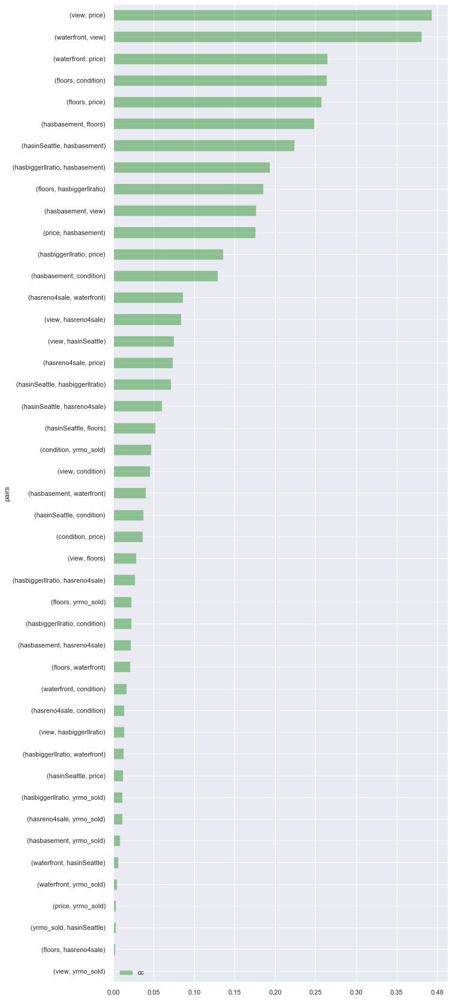

In [137]:
cc2pairs_update_df = cc2pairs_df[cc2pairs_df.cc<1]
cc2pairs_update_df.plot.barh(figsize=(10,30), color='green', alpha=0.4)

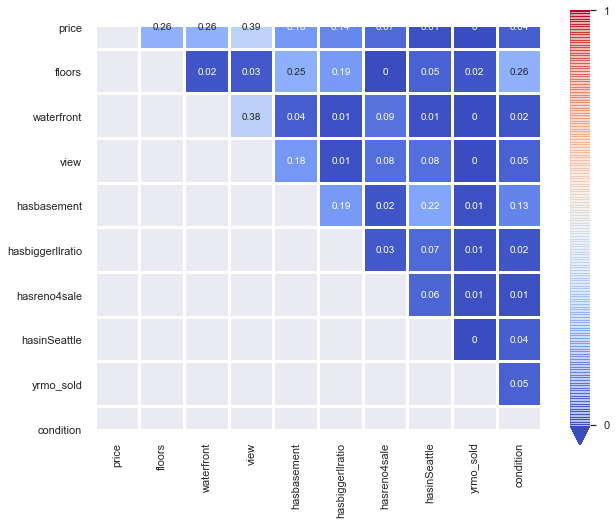

In [138]:
plt.figure(figsize=(10,10))
cbar_kws = {"orientation":"vertical", 
            "shrink":.8,
            'extend':'min', 
            'extendfrac':0.05, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(np.around(kc_categorical.corr().abs(),2), mask=np.tril(kc_categorical.corr().abs()), cmap='coolwarm', 
            center=0.5, linewidths=2, square= True, annot=True, cbar_kws=cbar_kws)
plt.show()

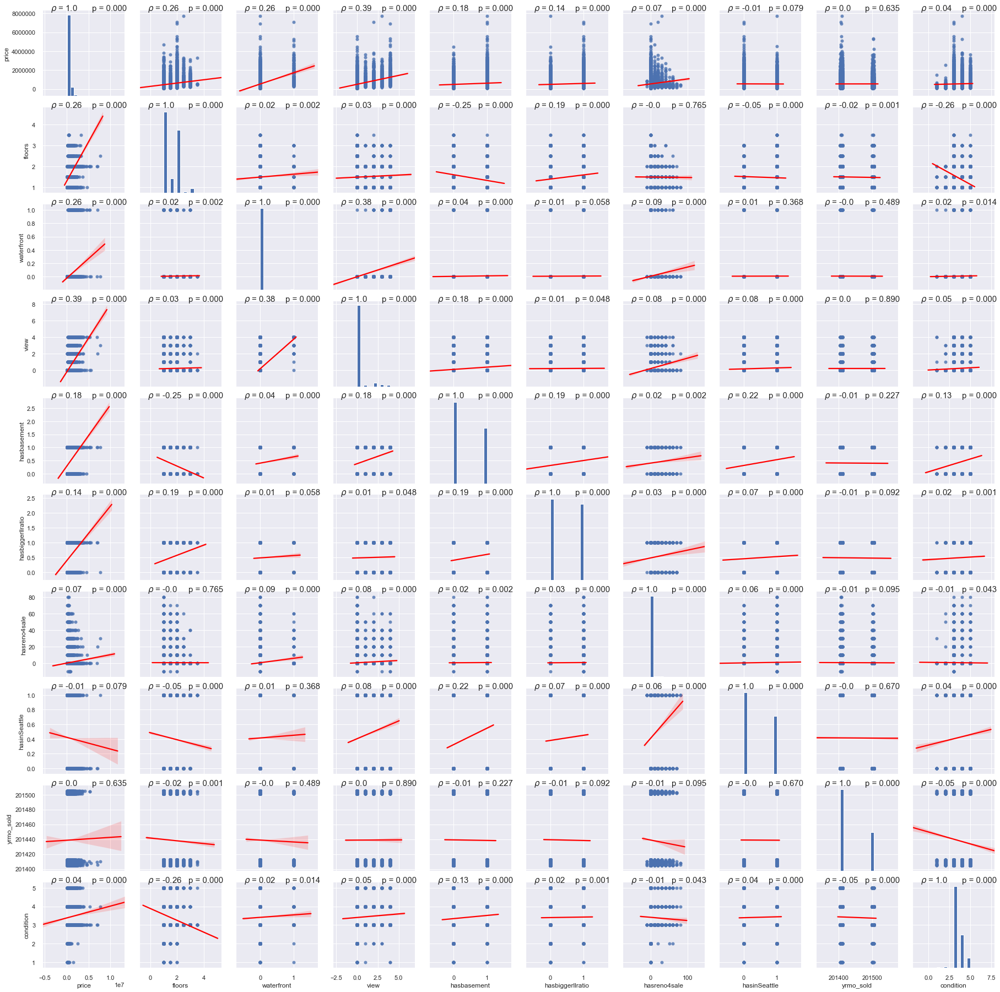

In [139]:
cate_feats = list(kc_categorical.columns)
g = sns.pairplot(kc_categorical, vars = cate_feats, kind='reg', plot_kws={'line_kws':{'color':'red'}})
g.map(corrfunc)
plt.show()

## combine categorical and continuous features

In [140]:
kc_preprocessed = pd.concat([kc_log_norm,kc_categorical],axis=1)
print(kc_preprocessed.shape)
kc_preprocessed.head()

(21597, 16)


,price_log,sqft_above_log,AvgAreaPerRm_log,lat_seattle_diff_log,long_seattle_diff_log,yrgrade_built_log,price,floors,waterfront,view,hasbasement,hasbiggerllratio,hasreno4sale,hasinSeattle,yrmo_sold,condition
0,-1.401998,-0.753565,-0.770991,-0.479738,-0.259714,-0.537535,221900.0,1.0,0,0,0,0,0,1,201410,3
1,0.279938,0.672693,1.165257,1.214572,0.379686,-0.674428,538000.0,2.0,0,0,1,1,30,1,201412,3
2,-1.799430,-1.752954,-1.297186,1.339437,-0.715103,-1.294285,180000.0,1.0,0,0,0,0,0,0,201502,3
3,0.499698,-1.026835,-0.970121,-0.395673,0.809351,-0.196525,604000.0,1.0,0,0,1,1,0,1,201412,5
4,0.178434,0.073515,-0.274420,0.408570,0.565549,0.547966,510000.0,1.0,0,0,0,0,0,0,201502,3


In [141]:
kc_preprocessed.corr()

,price_log,sqft_above_log,AvgAreaPerRm_log,lat_seattle_diff_log,long_seattle_diff_log,yrgrade_built_log,price,floors,waterfront,view,hasbasement,hasbiggerllratio,hasreno4sale,hasinSeattle,yrmo_sold,condition
price_log,1.000000,0.586013,0.567875,0.435444,0.000679,0.079252,0.891745,0.310630,0.170720,0.344653,0.206368,0.158123,0.061861,0.006460,0.004323,0.038918
sqft_above_log,0.586013,1.000000,0.651917,-0.018263,-0.068988,0.450238,0.542675,0.547619,0.059125,0.157019,-0.212167,0.203212,0.014015,-0.383845,-0.025149,-0.150730
AvgAreaPerRm_log,0.567875,0.651917,1.000000,0.069644,-0.005757,0.141515,0.528262,0.183773,0.103029,0.256934,0.189006,0.214279,0.043900,-0.177566,-0.026943,-0.034446
lat_seattle_diff_log,0.435444,-0.018263,0.069644,1.000000,0.072495,-0.151932,0.298955,0.043935,-0.020696,0.012995,0.123418,0.038945,0.018822,0.296134,-0.031027,-0.003074
long_seattle_diff_log,0.000679,-0.068988,-0.005757,0.072495,1.000000,-0.075482,-0.048584,0.078981,0.004718,0.045323,0.017014,0.020927,0.017200,0.359460,-0.012751,-0.069172
yrgrade_built_log,0.079252,0.450238,0.141515,-0.151932,-0.075482,1.000000,0.052964,0.485559,-0.024321,-0.054157,-0.163358,0.089918,-0.183452,-0.461990,0.003391,-0.360247
price,0.891745,0.542675,0.528262,0.298955,-0.048584,0.052964,1.000000,0.256804,0.264306,0.393497,0.175472,0.135493,0.073771,-0.011959,0.003231,0.036056
floors,0.310630,0.547619,0.183773,0.043935,0.078981,0.485559,0.256804,1.000000,0.020797,0.028414,-0.248292,0.185191,-0.002031,-0.052148,-0.022559,-0.264075
waterfront,0.170720,0.059125,0.103029,-0.020696,0.004718,-0.024321,0.264306,0.020797,1.000000,0.380543,0.039933,0.012925,0.085981,0.006124,-0.004713,0.016648
view,0.344653,0.157019,0.256934,0.012995,0.045323,-0.054157,0.393497,0.028414,0.380543,1.000000,0.176662,0.013430,0.083930,0.075283,0.000943,0.045622


In [142]:
cc3_df = kc_preprocessed.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc3_df.head())
cc3_df['pairs'] = list(zip(cc3_df.level_0, cc3_df.level_1))
cc3pairs_df = cc3_df.set_index('pairs')
cc3pairs_df = cc3pairs_df.drop(['level_1', 'level_0'], axis=1)
cc3pairs_df.columns = ['cc']
cc3pairs_df = cc3pairs_df.drop_duplicates(keep='first')
cc3pairs_df.head()

                   level_0                level_1         0
4                price_log  long_seattle_diff_log  0.000679
64   long_seattle_diff_log              price_log  0.000679
158                   view              yrmo_sold  0.000943
233              yrmo_sold                   view  0.000943
199           hasreno4sale                 floors  0.002031


,cc
pairs,
"(price_log, long_seattle_diff_log)",0.000679
"(view, yrmo_sold)",0.000943
"(hasreno4sale, floors)",0.002031
"(hasinSeattle, yrmo_sold)",0.002900
"(lat_seattle_diff_log, condition)",0.003074


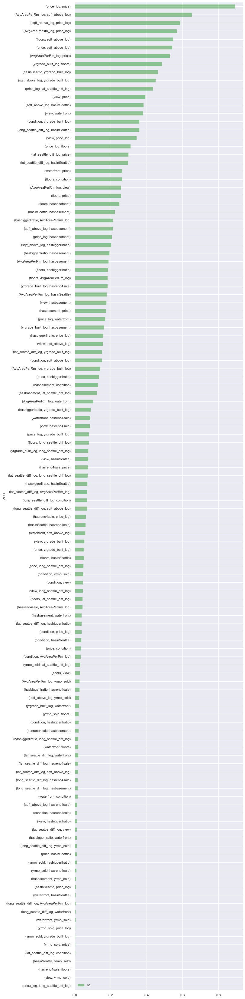

In [143]:
cc3pairs_update_df = cc3pairs_df[cc3pairs_df.cc<1]
cc3pairs_update_df.plot.barh(figsize=(10,60), color='green', alpha=0.4)

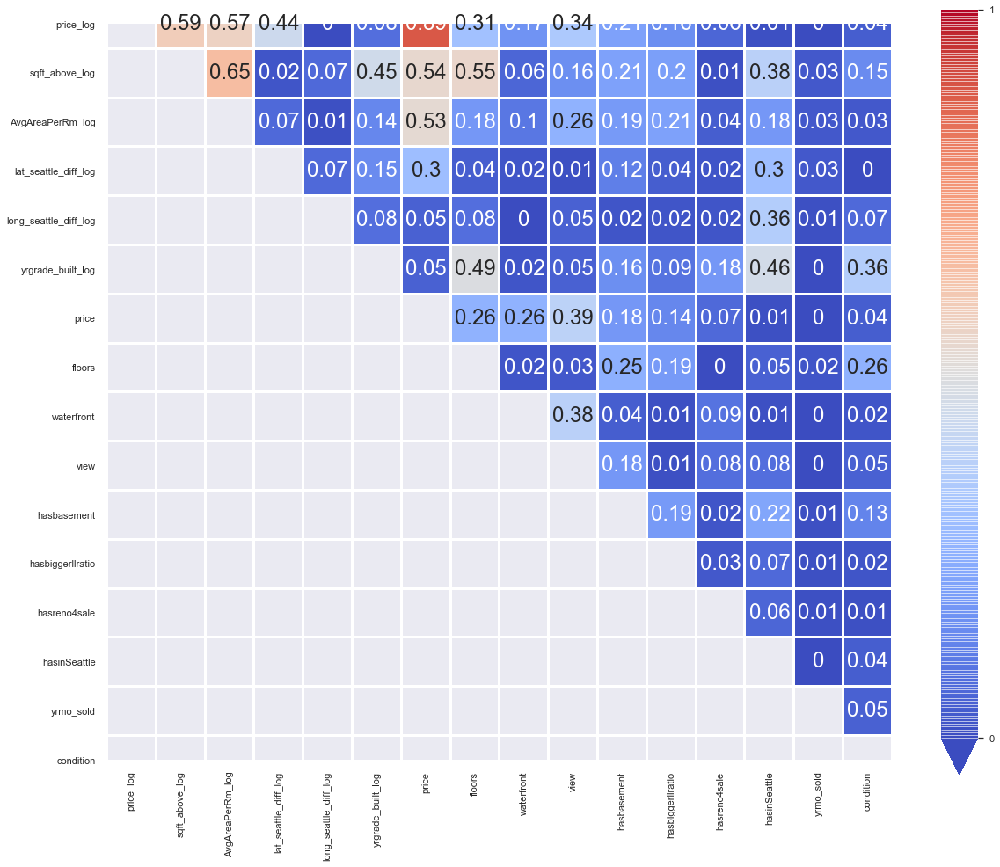

In [144]:
plt.figure(figsize=(20,20))
cbar_kws = {"orientation":"vertical", 
            "shrink":.8,
            'extend':'min', 
            'extendfrac':0.05, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(np.around(kc_preprocessed.corr().abs(),2), mask=np.tril(kc_preprocessed.corr().abs()), cmap="coolwarm", 
            center=0.5, linewidths=2, square= True, annot=True, annot_kws={"fontsize":24}, cbar_kws=cbar_kws)
plt.show()

## make a data decision: investigate multicollinearity

In [145]:
ccpairs_kc = cc3pairs_df[(abs(cc3pairs_df.cc) > 0.75) & (abs(cc3pairs_df.cc) < 1)]
ccpairs_kc

,cc
pairs,
"(price_log, price)",0.891745


In [146]:
x_cols = list(kc_preprocessed.columns)
vif = [variance_inflation_factor(kc_preprocessed.values, i) for i in range(kc_preprocessed.shape[1])]
list(zip(x_cols, np.around(vif,5)))

[('price_log', 7.74971),
 ('sqft_above_log', 4.71702),
 ('AvgAreaPerRm_log', 2.41302),
 ('lat_seattle_diff_log', 1.66005),
 ('long_seattle_diff_log', 1.19781),
 ('yrgrade_built_log', 2.13088),
 ('price', 17.77162),
 ('floors', 17.64098),
 ('waterfront', 1.24386),
 ('view', 1.5167),
 ('hasbasement', 2.77737),
 ('hasbiggerllratio', 2.27466),
 ('hasreno4sale', 1.09459),
 ('hasinSeattle', 3.40705),
 ('yrmo_sold', 69.51095),
 ('condition', 35.40768)]

remove the chosen variables from kc_preprocessed. 

* price: redundant 

In [147]:
kc_preprocessed_v2 = kc_preprocessed.drop(['price'],axis=1)
kc_preprocessed_v2.head()

,price_log,sqft_above_log,AvgAreaPerRm_log,lat_seattle_diff_log,long_seattle_diff_log,yrgrade_built_log,floors,waterfront,view,hasbasement,hasbiggerllratio,hasreno4sale,hasinSeattle,yrmo_sold,condition
0,-1.401998,-0.753565,-0.770991,-0.479738,-0.259714,-0.537535,1.0,0,0,0,0,0,1,201410,3
1,0.279938,0.672693,1.165257,1.214572,0.379686,-0.674428,2.0,0,0,1,1,30,1,201412,3
2,-1.799430,-1.752954,-1.297186,1.339437,-0.715103,-1.294285,1.0,0,0,0,0,0,0,201502,3
3,0.499698,-1.026835,-0.970121,-0.395673,0.809351,-0.196525,1.0,0,0,1,1,0,1,201412,5
4,0.178434,0.073515,-0.274420,0.408570,0.565549,0.547966,1.0,0,0,0,0,0,0,201502,3


In [148]:
cc4_df = kc_preprocessed_v2.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc3_df.head())
cc4_df['pairs'] = list(zip(cc4_df.level_0, cc4_df.level_1))
cc4pairs_df = cc4_df.set_index('pairs')
cc4pairs_df = cc4pairs_df.drop(['level_1', 'level_0'], axis=1)
cc4pairs_df.columns = ['cc']
cc4pairs_df = cc4pairs_df.drop_duplicates(keep='first')
cc4pairs_df.head()

                   level_0                level_1         0  \
4                price_log  long_seattle_diff_log  0.000679   
64   long_seattle_diff_log              price_log  0.000679   
158                   view              yrmo_sold  0.000943   
233              yrmo_sold                   view  0.000943   
199           hasreno4sale                 floors  0.002031   

                                  pairs  
4    (price_log, long_seattle_diff_log)  
64   (long_seattle_diff_log, price_log)  
158                   (view, yrmo_sold)  
233                   (yrmo_sold, view)  
199              (hasreno4sale, floors)  


,cc
pairs,
"(long_seattle_diff_log, price_log)",0.000679
"(yrmo_sold, view)",0.000943
"(floors, hasreno4sale)",0.002031
"(yrmo_sold, hasinSeattle)",0.002900
"(condition, lat_seattle_diff_log)",0.003074


In [149]:
cc2pairs_kc = cc4pairs_df[(abs(cc4pairs_df.cc) > 0.75) & (abs(cc4pairs_df.cc) < 1)]
cc2pairs_kc

,cc
pairs,


In [150]:
x_cols = list(kc_preprocessed_v2.columns)
vif = [variance_inflation_factor(kc_preprocessed_v2.values, i) for i in range(kc_preprocessed_v2.shape[1])]
list(zip(x_cols, np.around(vif,5)))

[('price_log', 3.19944),
 ('sqft_above_log', 4.71274),
 ('AvgAreaPerRm_log', 2.41302),
 ('lat_seattle_diff_log', 1.60819),
 ('long_seattle_diff_log', 1.18172),
 ('yrgrade_built_log', 2.12623),
 ('floors', 17.60535),
 ('waterfront', 1.19923),
 ('view', 1.50127),
 ('hasbasement', 2.77394),
 ('hasbiggerllratio', 2.27466),
 ('hasreno4sale', 1.09457),
 ('hasinSeattle', 3.40038),
 ('yrmo_sold', 54.88887),
 ('condition', 35.35258)]

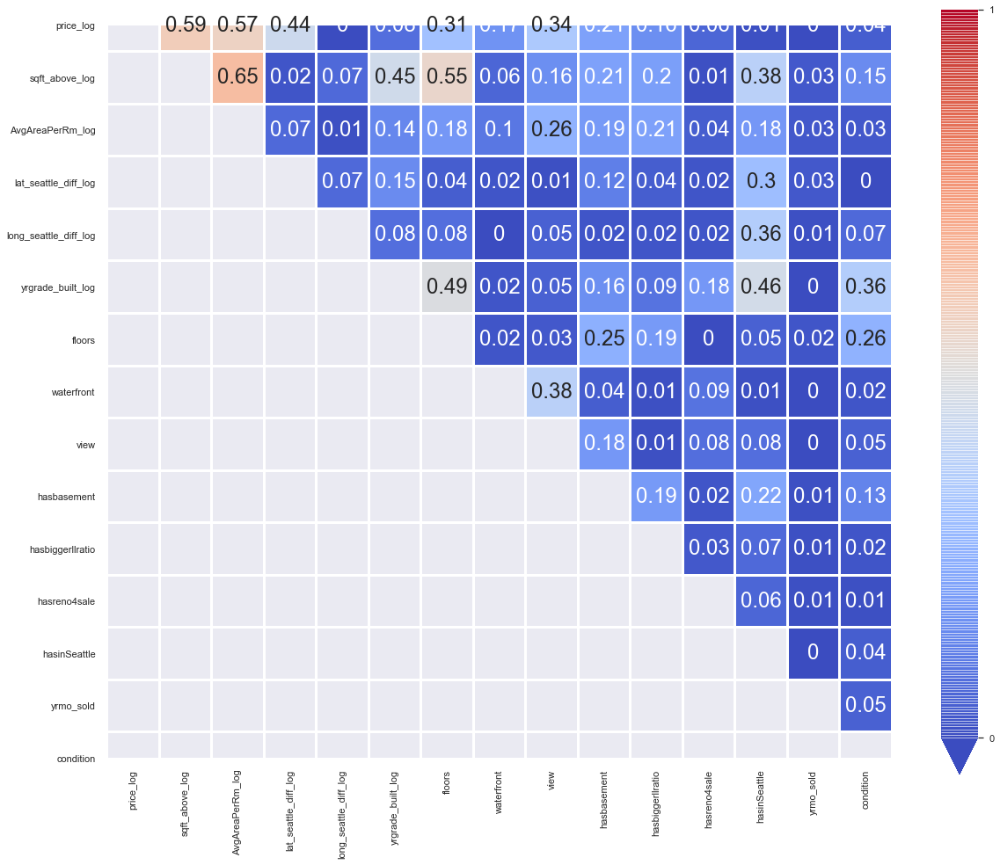

In [151]:
plt.figure(figsize=(20,20))
cbar_kws = {"orientation":"vertical", 
            "shrink":.8,
            'extend':'min', 
            'extendfrac':0.05, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(np.around(kc_preprocessed_v2.corr().abs(),2), mask=np.tril(kc_preprocessed_v2.corr().abs()), cmap="coolwarm", 
            center=0.5, linewidths=2, square= True, annot=True, annot_kws={"fontsize":24}, cbar_kws=cbar_kws)
plt.show()

# modeling data: build baseline model
## simple linear regression

Note: uncomment lines below to process one-to-one simple linear regression fit

King Housing DataSet - Regression Analysis and Diagnostics for price_log~price_log
-------------------------------------------------------------------------------------


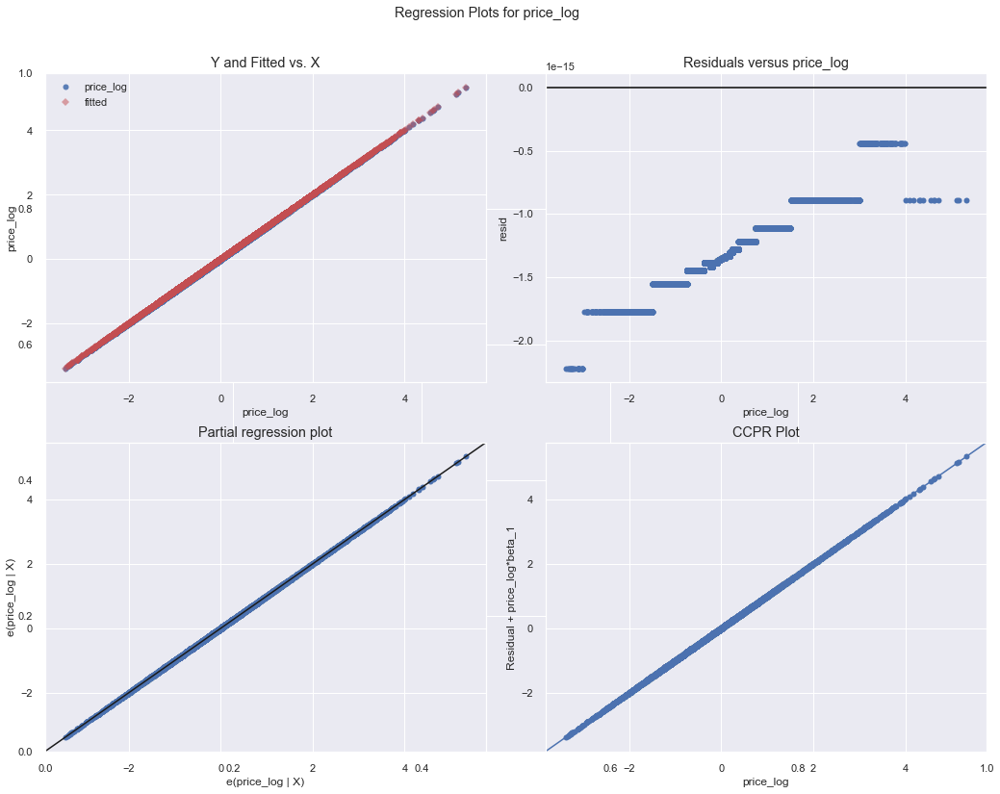

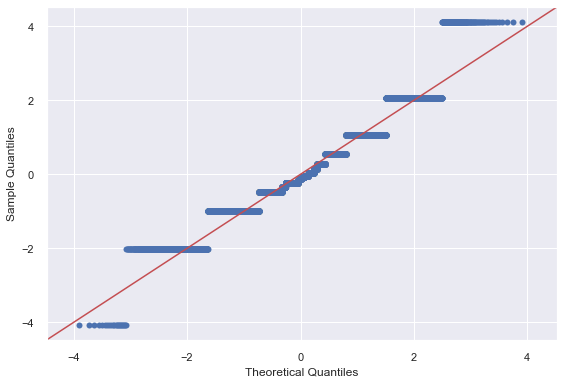

price_log: R2 1.000 , intercept 0.000 , slope 1.000 , p-value 0.000 , JB 2485.319
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~sqft_above_log
-------------------------------------------------------------------------------------


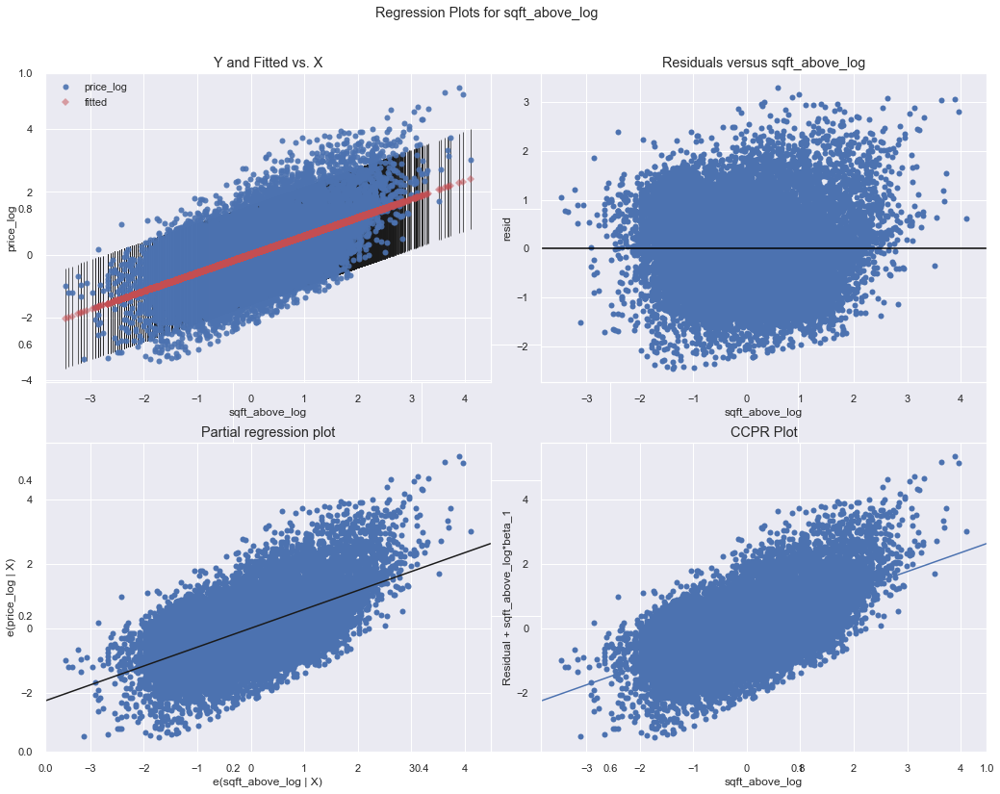

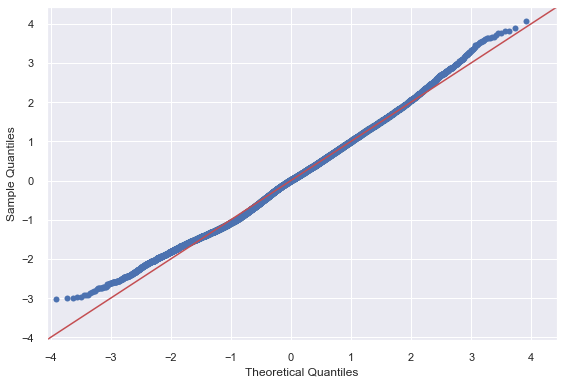

sqft_above_log: R2 0.343 , intercept 0.000 , slope 0.586 , p-value 0.000 , JB 139.438
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~AvgAreaPerRm_log
-------------------------------------------------------------------------------------


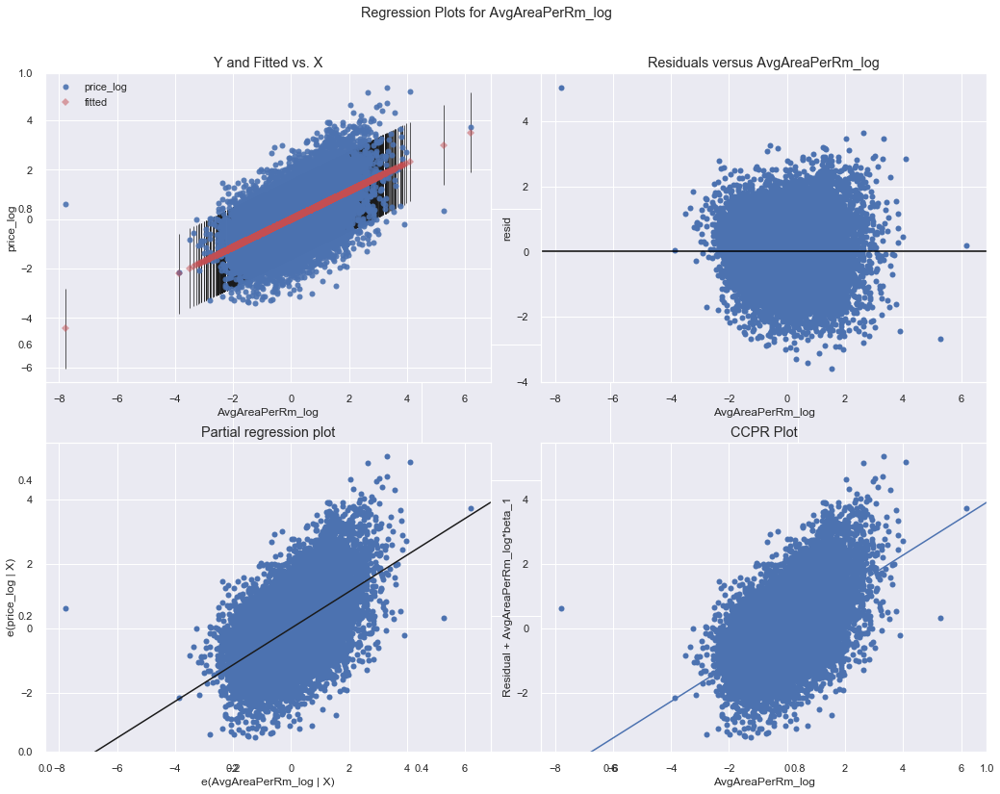

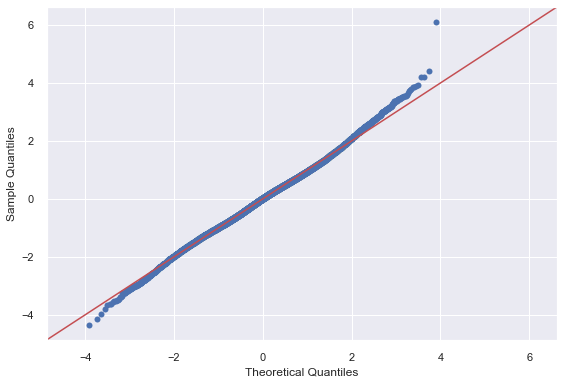

AvgAreaPerRm_log: R2 0.322 , intercept 0.000 , slope 0.568 , p-value 0.000 , JB 175.726
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~lat_seattle_diff_log
-------------------------------------------------------------------------------------


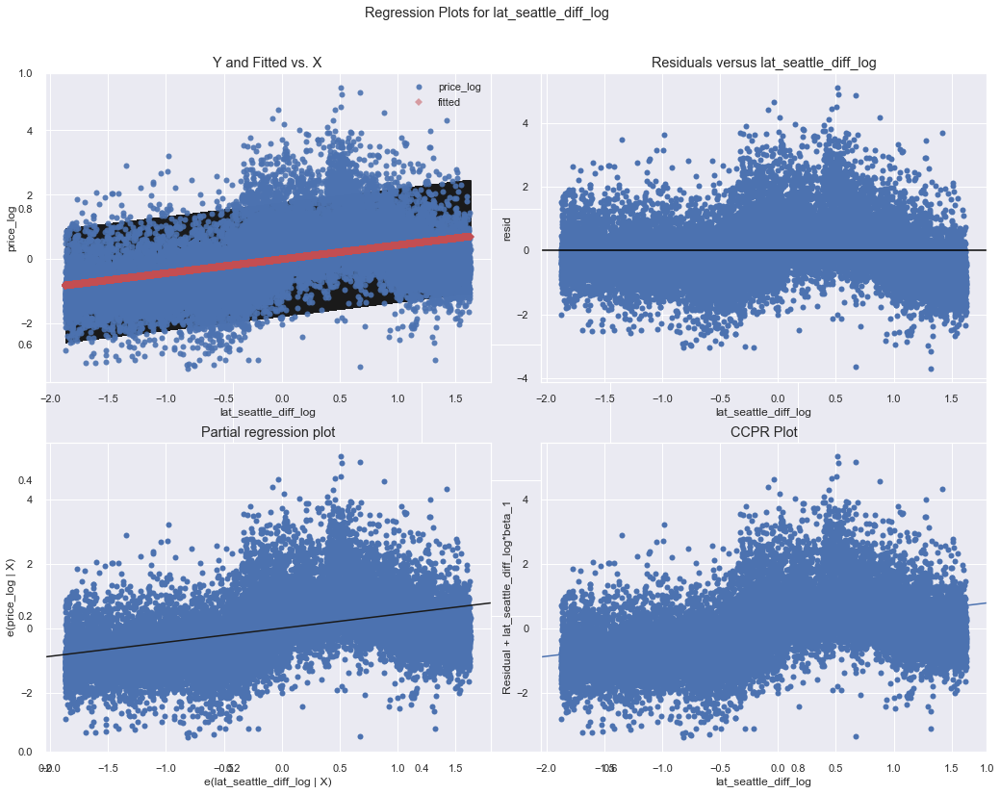

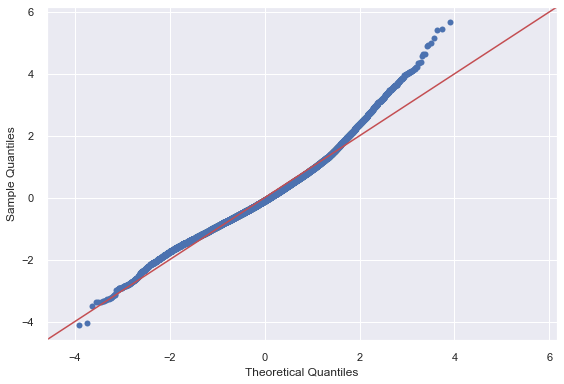

lat_seattle_diff_log: R2 0.190 , intercept 0.000 , slope 0.435 , p-value 0.000 , JB 2643.240
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~long_seattle_diff_log
-------------------------------------------------------------------------------------


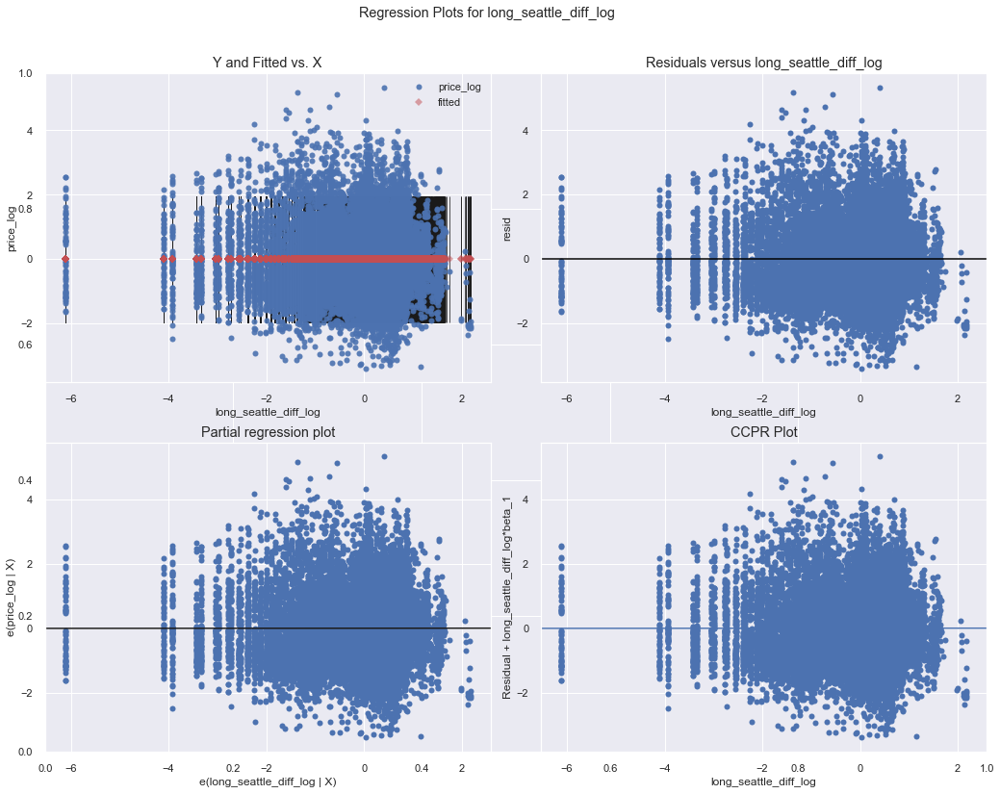

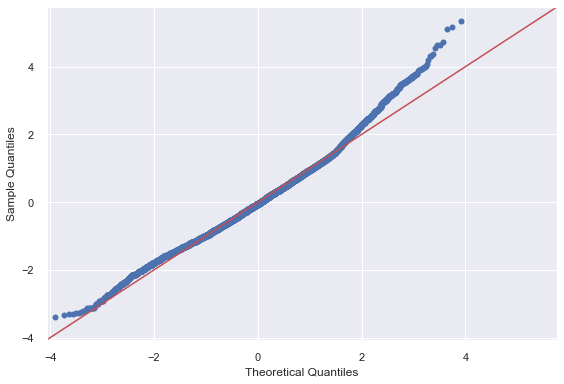

long_seattle_diff_log: R2 0.000 , intercept 0.000 , slope 0.001 , p-value 0.921 , JB 1100.016
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~yrgrade_built_log
-------------------------------------------------------------------------------------


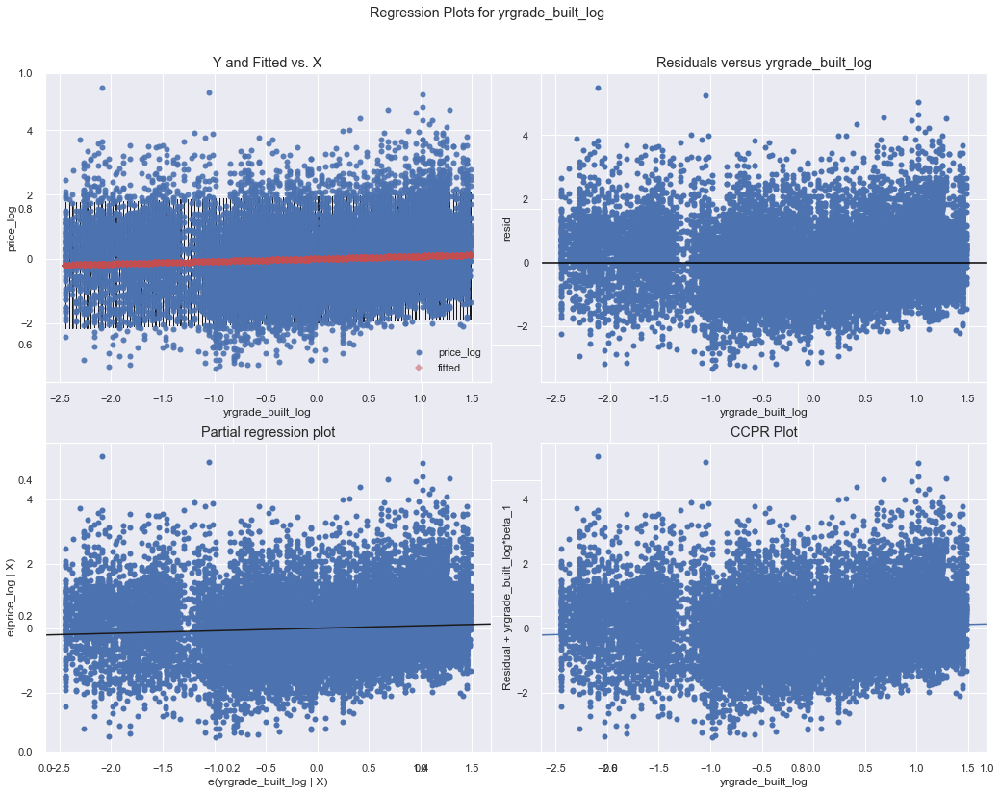

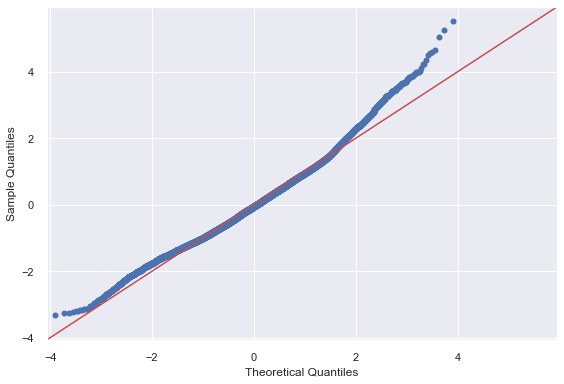

yrgrade_built_log: R2 0.006 , intercept -0.000 , slope 0.079 , p-value 0.000 , JB 1132.921
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~floors
-------------------------------------------------------------------------------------


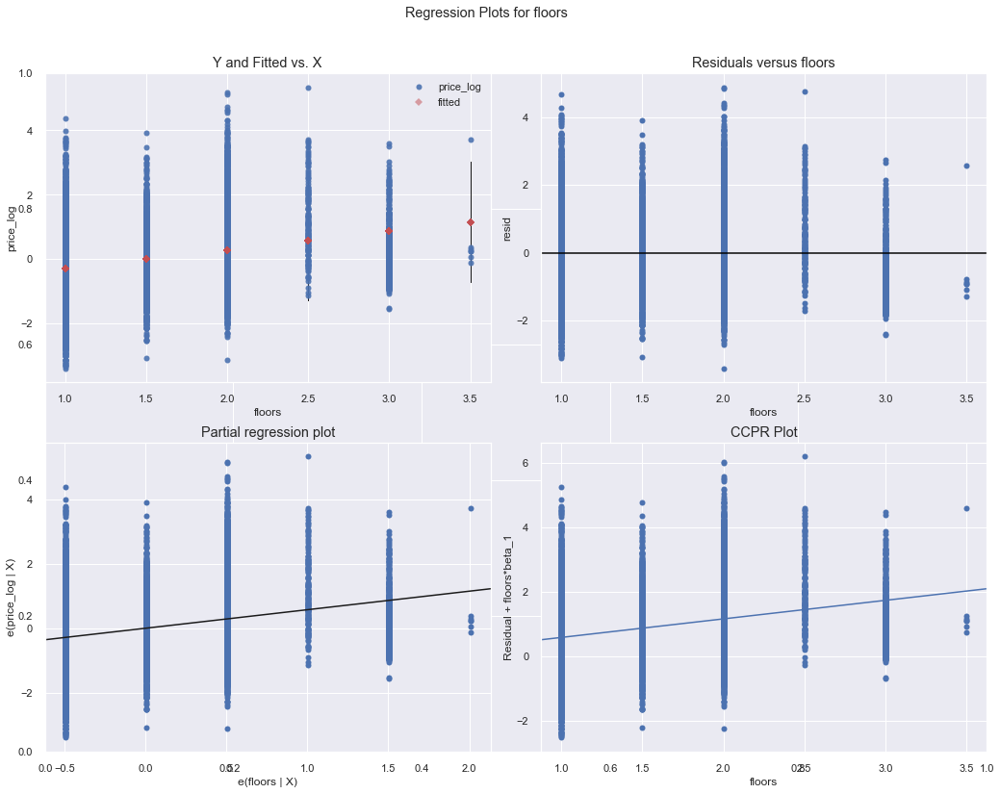

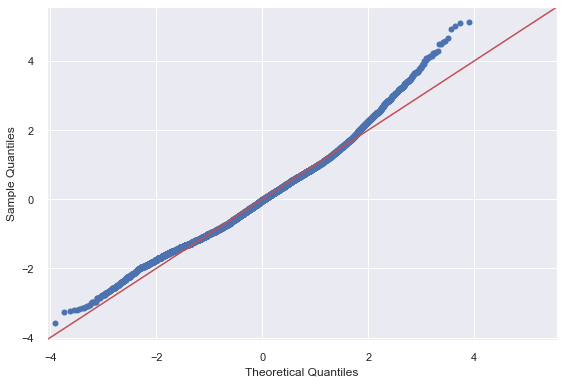

floors: R2 0.096 , intercept -0.860 , slope 0.576 , p-value 0.000 , JB 1031.279
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~waterfront
-------------------------------------------------------------------------------------


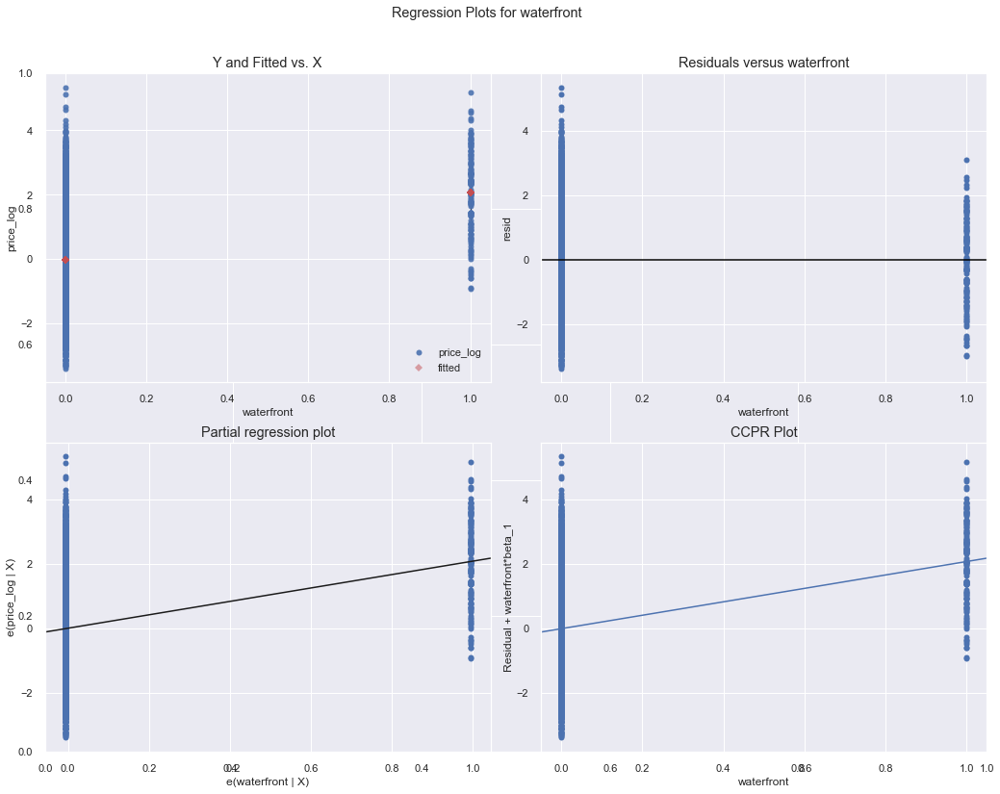

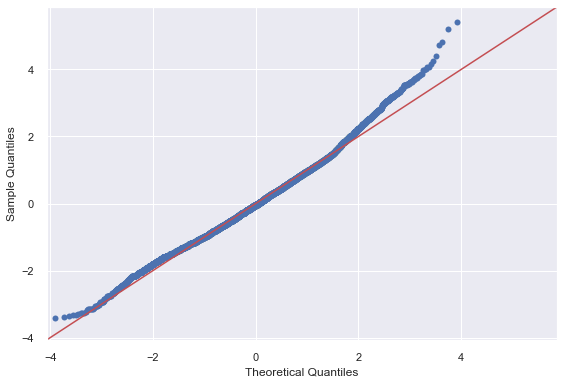

waterfront: R2 0.029 , intercept -0.014 , slope 2.083 , p-value 0.000 , JB 701.596
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~view
-------------------------------------------------------------------------------------


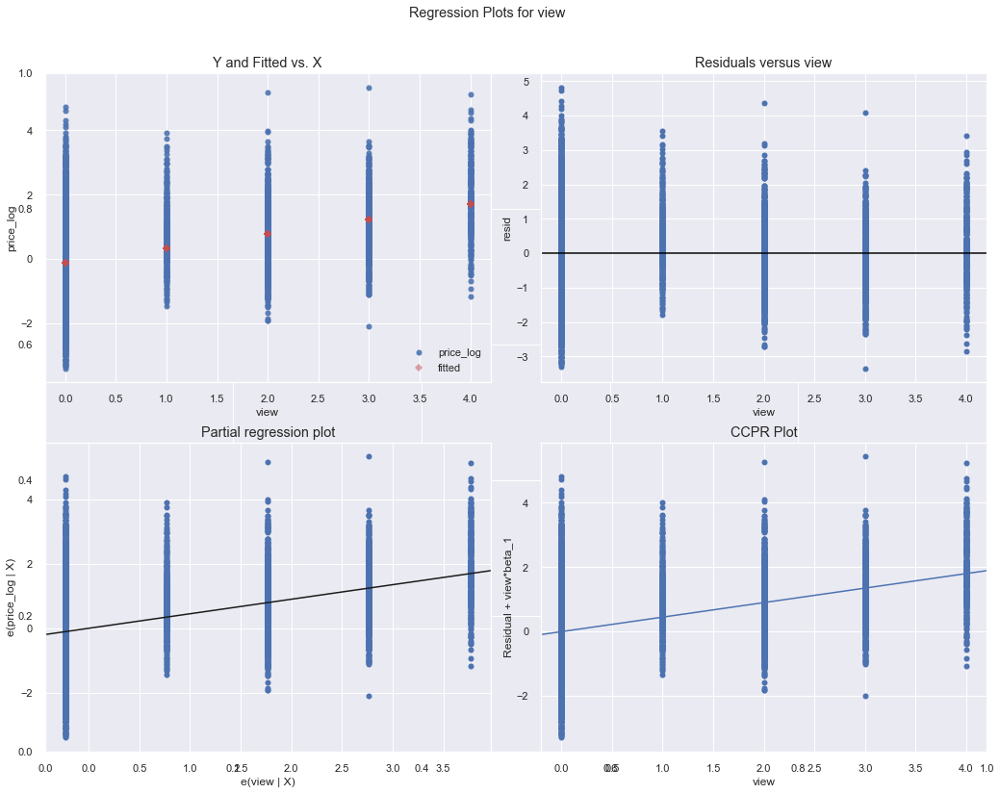

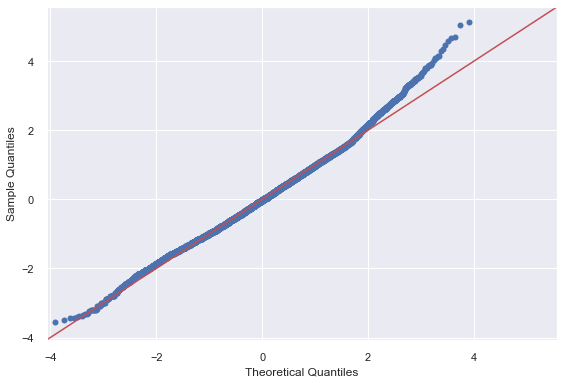

view: R2 0.119 , intercept -0.105 , slope 0.451 , p-value 0.000 , JB 436.570
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasbasement
-------------------------------------------------------------------------------------


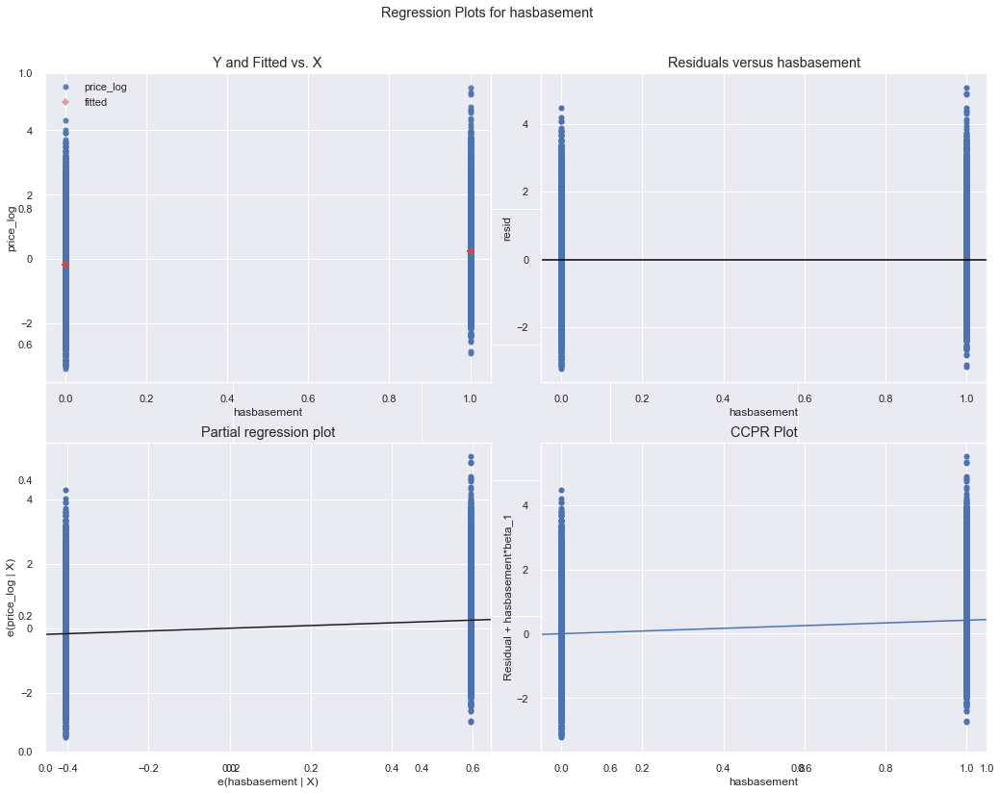

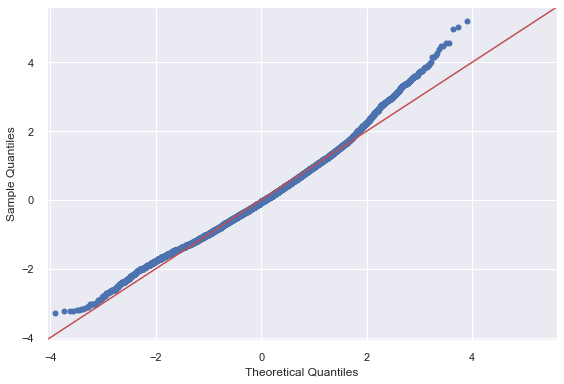

hasbasement: R2 0.043 , intercept -0.171 , slope 0.420 , p-value 0.000 , JB 1029.302
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasbiggerllratio
-------------------------------------------------------------------------------------


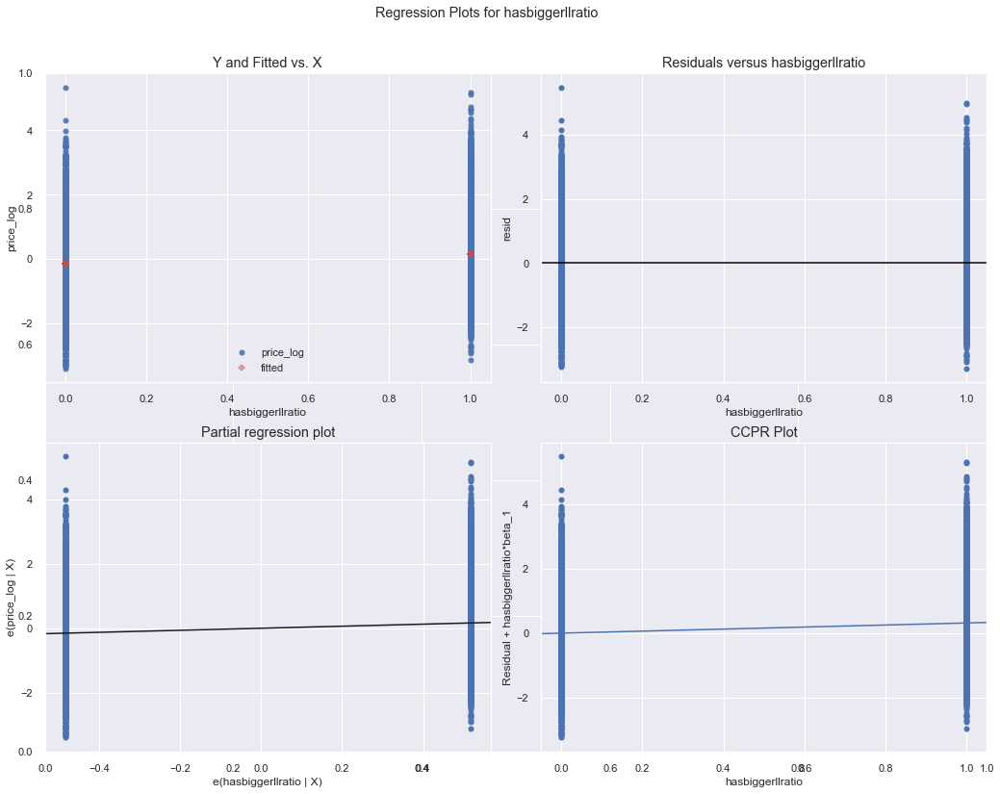

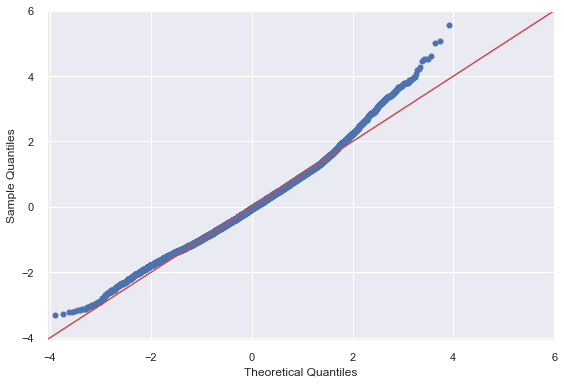

hasbiggerllratio: R2 0.025 , intercept -0.153 , slope 0.316 , p-value 0.000 , JB 1034.058
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasreno4sale
-------------------------------------------------------------------------------------


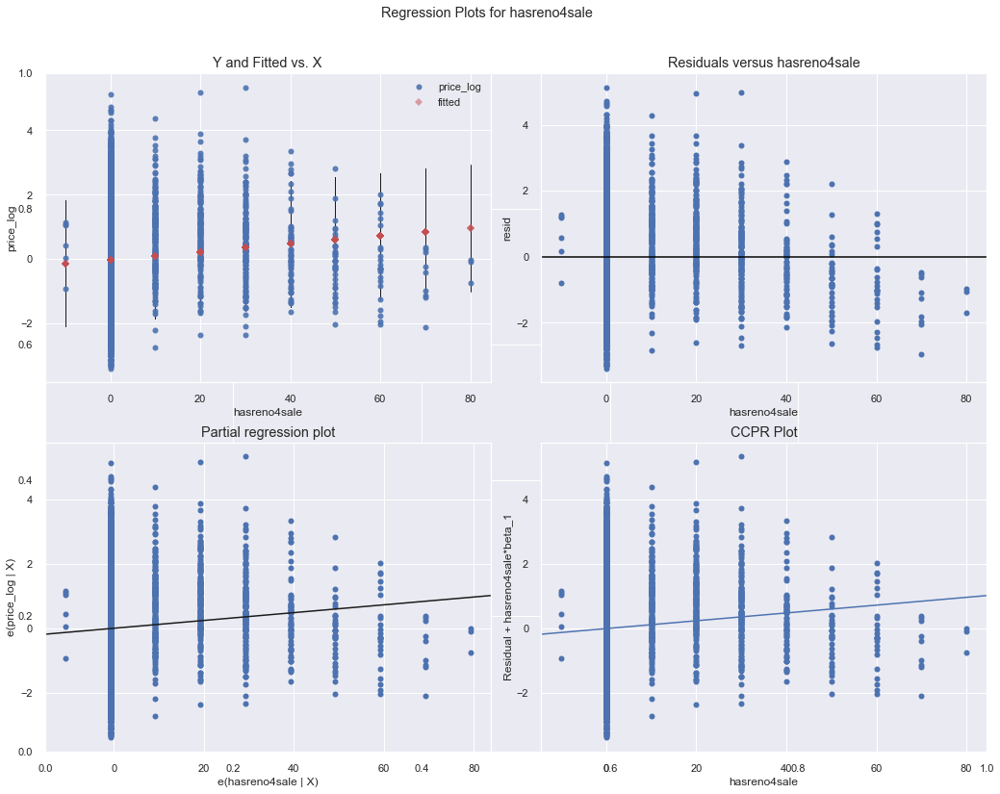

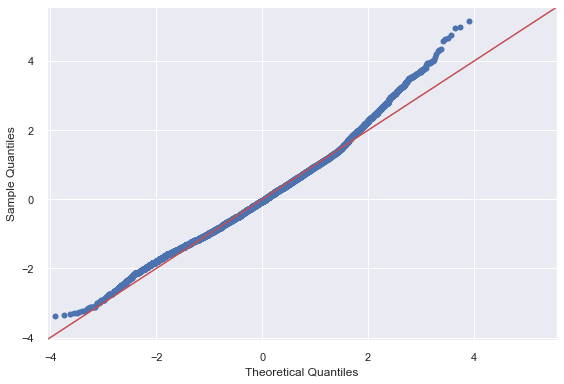

hasreno4sale: R2 0.004 , intercept -0.009 , slope 0.012 , p-value 0.000 , JB 1029.023
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasinSeattle
-------------------------------------------------------------------------------------


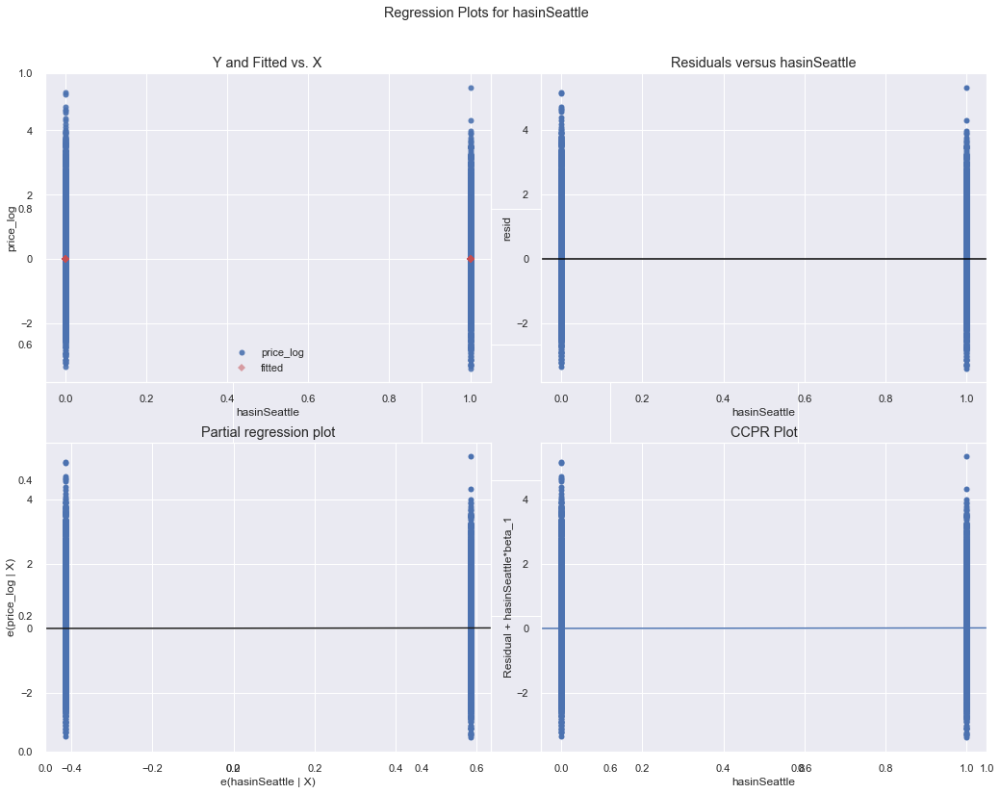

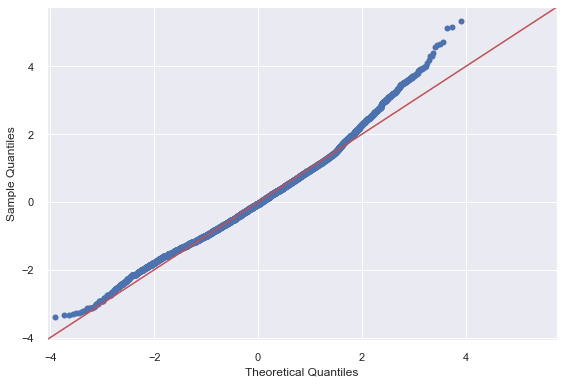

hasinSeattle: R2 0.000 , intercept -0.005 , slope 0.013 , p-value 0.342 , JB 1105.466
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~yrmo_sold
-------------------------------------------------------------------------------------


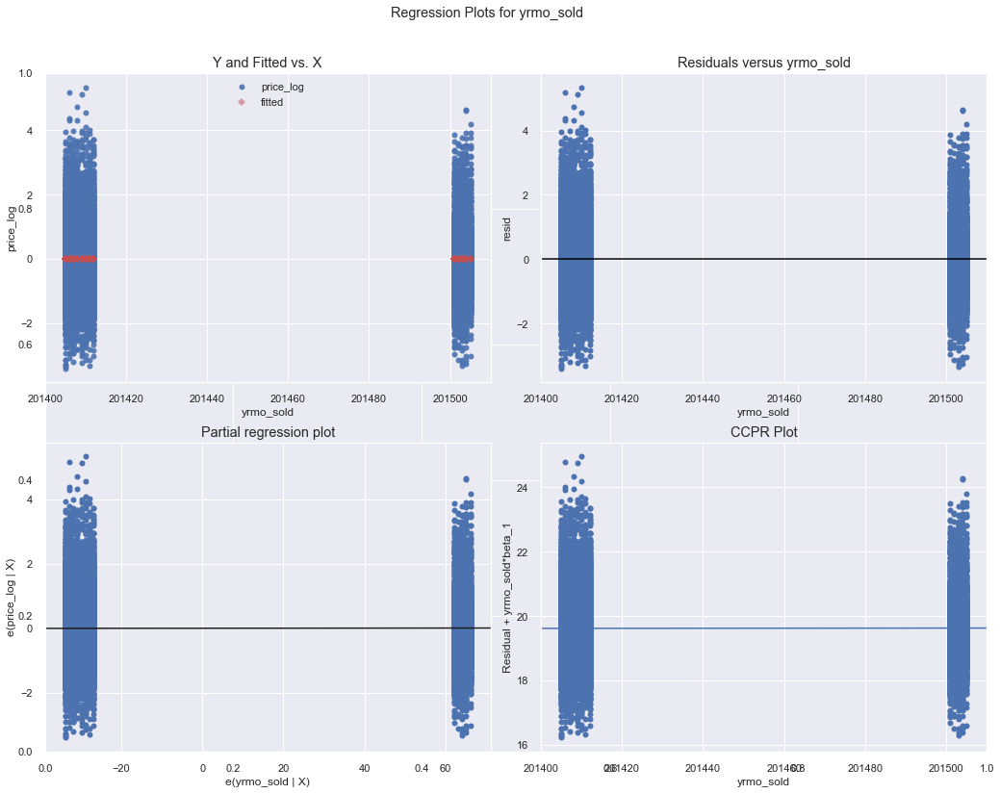

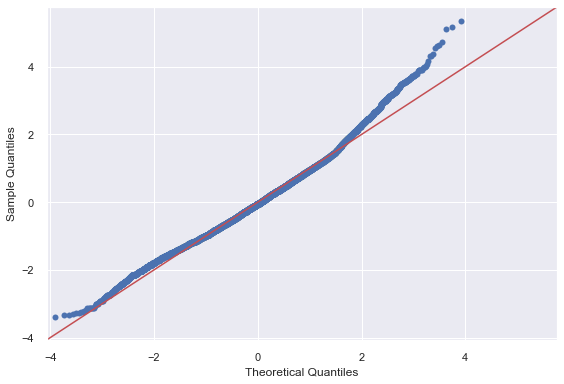

yrmo_sold: R2 0.000 , intercept -19.628 , slope 0.000 , p-value 0.525 , JB 1097.721
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~condition
-------------------------------------------------------------------------------------


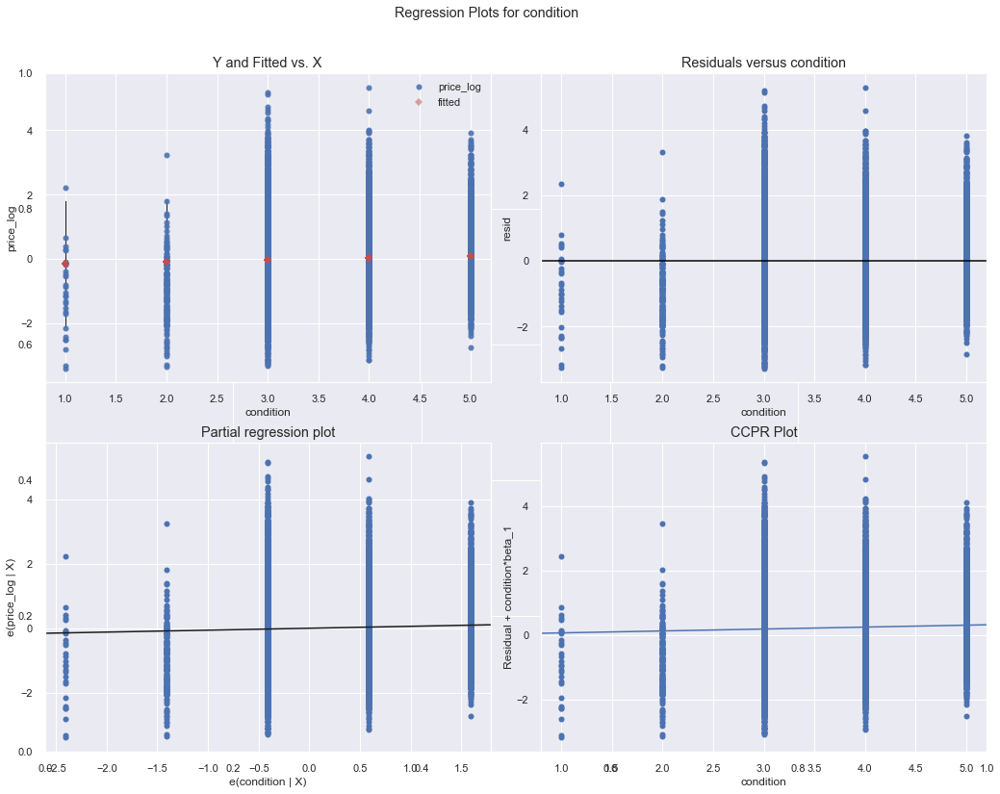

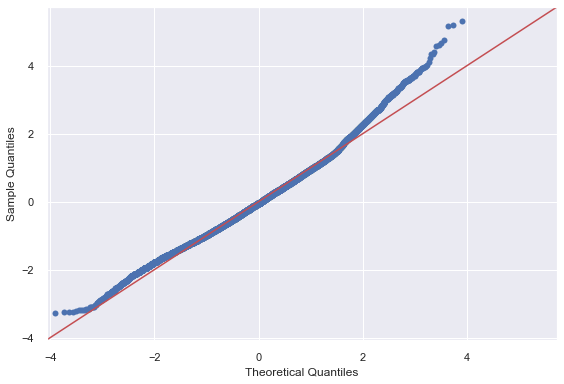

condition: R2 0.002 , intercept -0.204 , slope 0.060 , p-value 0.000 , JB 1086.243
Press Enter to continue...


[['price_log', 1.0, 0.0, 1.0, 0.0, 2485.319],
 ['sqft_above_log', 0.343, 0.0, 0.586, 0.0, 139.438],
 ['AvgAreaPerRm_log', 0.322, 0.0, 0.568, 0.0, 175.726],
 ['lat_seattle_diff_log', 0.19, 0.0, 0.435, 0.0, 2643.24],
 ['long_seattle_diff_log', 0.0, 0.0, 0.001, 0.921, 1100.016],
 ['yrgrade_built_log', 0.006, -0.0, 0.079, 0.0, 1132.921],
 ['floors', 0.096, -0.86, 0.576, 0.0, 1031.279],
 ['waterfront', 0.029, -0.014, 2.083, 0.0, 701.596],
 ['view', 0.119, -0.105, 0.451, 0.0, 436.57],
 ['hasbasement', 0.043, -0.171, 0.42, 0.0, 1029.302],
 ['hasbiggerllratio', 0.025, -0.153, 0.316, 0.0, 1034.058],
 ['hasreno4sale', 0.004, -0.009, 0.012, 0.0, 1029.023],
 ['hasinSeattle', 0.0, -0.005, 0.013, 0.342, 1105.466],
 ['yrmo_sold', 0.0, -19.628, 0.0, 0.525, 1097.721],
 ['condition', 0.002, -0.204, 0.06, 0.0, 1086.243]]

In [153]:
results = []
for idx, col in enumerate(kc_preprocessed_v2.columns):
    print (f"King Housing DataSet - Regression Analysis and Diagnostics for price_log~{col}")
    print ("-------------------------------------------------------------------------------------")

    f = f'price_log~{col}'
    model = ols(formula=f, data=kc_preprocessed_v2).fit()
    
    fig, axes = plt.subplots(figsize=(15,12))
    fig = sm.graphics.plot_regress_exog(model, col, fig=fig)
    fig = sm.graphics.qqplot(model.resid, dist=stats.norm, line='45', fit=True)
    fig.tight_layout()
    plt.show()
    
    print(f'{col}: R2 {model.rsquared:5.3f} , intercept {model.params[0]:5.3f} , slope {model.params[1]:5.3f} , p-value {model.pvalues[1]:5.3f} , JB {sms.jarque_bera(model.resid)[0]:5.3f}')
    results.append([col, round(model.rsquared,3), round(model.params[0],3), round(model.params[1],3), round(model.pvalues[1],3), round(sms.jarque_bera(model.resid)[0],3)])
    input("Press Enter to continue...")
    
results

## multiple linear regression (before dummy creation)
### run a linear model with price as the target variable in statsmodels

In [154]:
X = kc_preprocessed_v2.drop('price_log', axis=1)
Y = kc_preprocessed_v2.price_log
print(Y.head(),'\n')
X.head()

0   -1.401998
1    0.279938
2   -1.799430
3    0.499698
4    0.178434
Name: price_log, dtype: float64 



,sqft_above_log,AvgAreaPerRm_log,lat_seattle_diff_log,long_seattle_diff_log,yrgrade_built_log,floors,waterfront,view,hasbasement,hasbiggerllratio,hasreno4sale,hasinSeattle,yrmo_sold,condition
0,-0.753565,-0.770991,-0.479738,-0.259714,-0.537535,1.0,0,0,0,0,0,1,201410,3
1,0.672693,1.165257,1.214572,0.379686,-0.674428,2.0,0,0,1,1,30,1,201412,3
2,-1.752954,-1.297186,1.339437,-0.715103,-1.294285,1.0,0,0,0,0,0,0,201502,3
3,-1.026835,-0.970121,-0.395673,0.809351,-0.196525,1.0,0,0,1,1,0,1,201412,5
4,0.073515,-0.274420,0.408570,0.565549,0.547966,1.0,0,0,0,0,0,0,201502,3


In [155]:
linreg = LinearRegression()
mse = make_scorer(mean_squared_error)

crossvalidation = KFold(n_splits=80, shuffle=True, random_state=1) # 10-fold
baseline_r2 = np.mean(cross_val_score(linreg, X, Y, scoring='r2', cv=crossvalidation))
baseline_mse = np.mean(cross_val_score(linreg, X, Y, scoring=mse, cv=crossvalidation))
baseline_rmse = np.sqrt(baseline_mse)

print(f' baseline model - r2:{baseline_r2:.5f}, mse:{baseline_mse:.5f}, rmse:{baseline_rmse:.5f}')

 baseline model - r2:0.68591, mse:0.31132, rmse:0.55796


In [156]:
X_baseline = sm.add_constant(X)
model = sm.OLS(Y,X_baseline).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.689
Model:                            OLS   Adj. R-squared:                  0.689
Method:                 Least Squares   F-statistic:                     3418.
Date:                Sun, 26 Jul 2020   Prob (F-statistic):               0.00
Time:                        16:02:53   Log-Likelihood:                -18027.
No. Observations:               21597   AIC:                         3.608e+04
Df Residuals:                   21582   BIC:                         3.620e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  -188.2615     17.279    -10.896      0.000    -222.129    -154.394
sqft_above_log            0.5921      0.007     82.317      0.000       0.578       0.606
AvgAreaPerRm_log          0.0860      0.006     14.657      0.000       0.074       0.097
lat_seattle_diff_log      0.3866      0.004     95.671      0.000       0.379       0.395
long_seattle_diff_log    -0.0182      0.004     -4.412      0.000      -0.026      -0.010
yrgrade_built_log        -0.0730      0.006    -13.245      0.000      -0.084      -0.062
floors                    0.1515      0.010     15.191      0.000       0.132       0.171
waterfront                0.7989      0.050     15.896      0.000       0.700       0.897
view                      0.1892      0.006     33.354      0.000       0.178       0.200
hasbasement               0.4840      0.009     51.712      0.000       0.466       0.502
hasbiggerllratio         -0.1156      0.008    -14.107      0.000      -0.132      -0.100
hasreno4sale              0.0014      0.001      1.805      0.071      -0.000       0.003
hasinSeattle              0.0966      0.011      8.917      0.000       0.075       0.118
yrmo_sold                 0.0009   8.58e-05     10.843      0.000       0.001       0.001
condition                 0.1376      0.006     21.347      0.000       0.125       0.150
==============================================================================
Omnibus:                      231.531   Durbin-Watson:                   2.004
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              370.367
Skew:                           0.084   Prob(JB):                     3.77e-81
Kurtosis:                       3.619   Cond. No.                     9.17e+08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.17e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### check normality

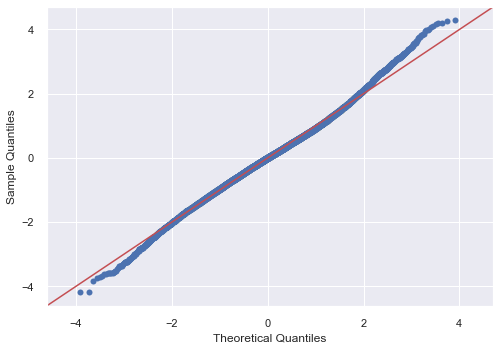

In [157]:
fig = sm.graphics.qqplot(model.resid, dist=stats.norm, line='45', fit=True)

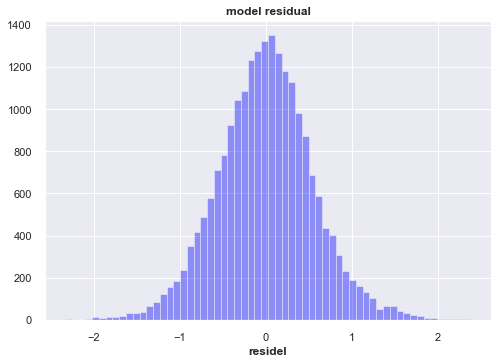

In [158]:
fig, ax = plt.subplots() 
#plt.hist(model.resid,bins=50,color='green',alpha=0.4)
#model.resid.plot(kind='hist',bins=50,color='red',alpha=0.4)
ax.hist(model.resid,bins=60,color='blue',alpha=0.4)
ax.set_xlabel('residel',fontweight ='bold')
ax.grid(True)
ax.set_title('model residual',fontweight='bold')
plt.show()

### check homoscedasticity

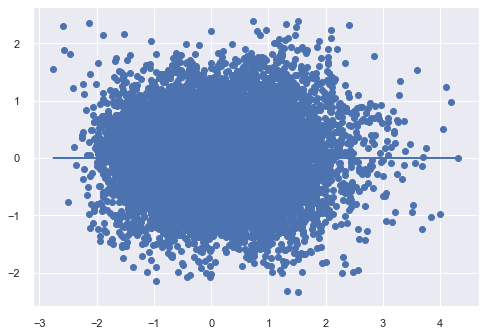

In [159]:
plt.scatter(model.predict(X_baseline), model.resid)
plt.plot(model.predict(X_baseline), [0 for i in range(len(X_baseline))])

### run the same model in scikit-learn

In [160]:
# Importing and initialize the linear regression model class
linreg = LinearRegression()
linreg.fit(X, Y)
linreg.coef_

array([ 0.59214469,  0.08599579,  0.38661129, -0.01819519, -0.07299851,
        0.15151702,  0.79890226,  0.18919128,  0.48402204, -0.11561498,
        0.00138808,  0.09663828,  0.00092998,  0.13760542])

In [161]:
linreg.intercept_

-188.26152176270844

### use feature ranking with recursive feature elimination: Top 5 features

In [162]:
selector = RFE(linreg, n_features_to_select=5)
selector = selector.fit(X, Y.values.ravel())

In [163]:
selector.support_ 

array([ True, False,  True, False, False, False,  True,  True,  True,
       False, False, False, False, False])

In [164]:
selector.ranking_

array([ 1,  6,  1,  8,  7,  5,  1,  1,  1,  4,  9,  3, 10,  2])

In [165]:
estimators = selector.estimator_
print(estimators.coef_)
print(estimators.intercept_)

[0.61620079 0.41464906 0.82029049 0.22528234 0.51477053]
-0.2671360196052821


In [166]:
print(X.columns)
selected_columns = X.columns[selector.support_]
selected_columns

Index(['sqft_above_log', 'AvgAreaPerRm_log', 'lat_seattle_diff_log',
       'long_seattle_diff_log', 'yrgrade_built_log', 'floors', 'waterfront',
       'view', 'hasbasement', 'hasbiggerllratio', 'hasreno4sale',
       'hasinSeattle', 'yrmo_sold', 'condition'],
      dtype='object')


Index(['sqft_above_log', 'lat_seattle_diff_log', 'waterfront', 'view',
       'hasbasement'],
      dtype='object')

In [167]:
linreg.fit(X[selected_columns],Y)
yhat = linreg.predict(X[selected_columns])
yhat

array([-0.93040657,  1.16576994, -0.79191148, ..., -0.84774561,
       -0.40704041, -0.84876564])

Now, using the formulas of R-squared and adjusted R-squared below, and your Python/numpy knowledge, compute them and contrast them with the R-squared and adjusted R-squared in your statsmodels output using stepwise selection. Which of the two models would you prefer?

$SS_{residual} = \sum (y - \hat{y})^2 $

$SS_{total} = \sum (y - \bar{y})^2 $

$R^2 = 1- \dfrac{SS_{residual}}{SS_{total}}$

$R^2_{adj}= 1-(1-R^2)\dfrac{n-1}{n-p-1}$

In [168]:
SS_residual = np.dot(Y-yhat,Y-yhat)
SS_total = np.dot(Y-np.mean(Y),Y-np.mean(Y))
R_squared = 1 - (SS_residual / SS_total)
adjusted_R_squared = 1 - (1 - R_squared) * ((len(Y) - 1) / (len(Y) - X[selected_columns].shape[1] - 1))

print(round(R_squared,5))
print(round(adjusted_R_squared,5))

0.66468
0.6646


###  train-test split

In [169]:
# Split the data into training and test sets (assign 20% to test set)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=42)
print('X_train:', len(X_train), 'X_test:', len(X_test), 'y_train:', len(y_train), 'y_test:', len(y_test))
print('X_test/X_train:',round(np.divide(len(X_test),len(X_train)),3),'\ty_test/y_train:',round(np.divide(len(y_test),len(y_train)),3))

X_train: 17277 X_test: 4320 y_train: 17277 y_test: 4320
X_test/X_train: 0.25 	y_test/y_train: 0.25


### fit the model
* Apply your model to the train set
* Calculate predictions on training and test sets

Fit a linear regression model and apply the model to make predictions on test set

In [170]:
# Fit the model to train data
linreg.fit(X_train, y_train)
# Calculate predictions on training and test sets
y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)

### residuals and MSE
* Calculate training and test residuals
* Calculate the Mean Squared Error (MSE)

A good way to compare overall performance is to compare the mean squarred error for the predicted values on the training and test sets. Calculate the residuals and the mean squared error on the test set

In [171]:
# Calculate residuals
train_residuals = y_hat_train - y_train
test_residuals = y_hat_test - y_test
# Import mean_squared_error from sklearn.metrics
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error (sklearn.metrics):', round(train_mse,3))
print('Test Mean Squarred Error (sklearn.metrics):', round(test_mse,3))
# Calculate training and test MSE
mse_train = np.dot((y_train-y_hat_train).T, y_train-y_hat_train) / np.size(y_train)
mse_test = np.dot((y_test-y_hat_test).T, y_test-y_hat_test) / np.size(y_test)
print('Train Mean Squarred Error (statistics):', round(mse_train,3))
print('Test Mean Squarred Error (statistics):', round(mse_test,3))
rmse_train = np.sqrt(mse_train)
rmse_test = np.sqrt(mse_test)
print('Train Root Mean Squarred Error (statistics):', round(rmse_train,3))
print('Test Root Mean Squarred Error (statistics):', round(rmse_test,3))

Train Mean Squarred Error (sklearn.metrics): 0.311
Test Mean Squarred Error (sklearn.metrics): 0.31
Train Mean Squarred Error (statistics): 0.311
Test Mean Squarred Error (statistics): 0.31
Train Root Mean Squarred Error (statistics): 0.558
Test Root Mean Squarred Error (statistics): 0.557


### cross-validation using Scikit-Learn

In [172]:
mse = make_scorer(mean_squared_error)

cv_5_mse  = np.mean(cross_val_score(linreg, X, Y, cv=5,  scoring=mse))
cv_10_mse = np.mean(cross_val_score(linreg, X, Y, cv=10, scoring=mse))
cv_20_mse = np.mean(cross_val_score(linreg, X, Y, cv=20, scoring=mse))
cv_40_mse = np.mean(cross_val_score(linreg, X, Y, cv=40, scoring=mse))
cv_80_mse = np.mean(cross_val_score(linreg, X, Y, cv=80, scoring=mse))
print(f'5-fold:{cv_5_mse.mean():.5f}, 10-fold:{cv_10_mse.mean():.5f}, 20-fold:{cv_20_mse.mean():.5f}, 40-fold:{cv_40_mse.mean():.5f}, 80-fold:{cv_80_mse.mean():.5f}')

5-fold:0.31338, 10-fold:0.31280, 20-fold:0.31183, 40-fold:0.31160, 80-fold:0.31149


In [173]:
cv_5_r2  = np.mean(cross_val_score(linreg, X, Y, cv=5,  scoring='r2'))
cv_10_r2 = np.mean(cross_val_score(linreg, X, Y, cv=10, scoring='r2'))
cv_20_r2 = np.mean(cross_val_score(linreg, X, Y, cv=20, scoring='r2'))
cv_40_r2 = np.mean(cross_val_score(linreg, X, Y, cv=40, scoring='r2'))
cv_80_r2 = np.mean(cross_val_score(linreg, X, Y, cv=80, scoring='r2'))
print(f'5-fold:{cv_5_r2.mean():.5f}, 10-fold:{cv_10_r2.mean():.5f}, 20-fold:{cv_20_r2.mean():.5f}, 40-fold:{cv_40_r2.mean():.5f}, 80-fold:{cv_80_r2.mean():.5f}')

5-fold:0.68541, 10-fold:0.68484, 20-fold:0.68566, 40-fold:0.68504, 80-fold:0.68364


### conclusion:

Top 5 features in this baseline model, where there is no dummy created, are as follow:

- **'sqft_above_log'** (continuous), 

- **'lat_seattle_diff_log'** (continuous),

- **'waterfront'** (categorical), 

- **'view'** (categorical), 

- **'hasbasement'** (categorical)

baseline model : r2:0.74, mse:0.25, rmse:0.50

### conclusion (baseline model w/o dummies):

final features:

- **'sqft_above_log'** (continuous) (Top5), 

- **'AvgAreaPerRm_log'** (continuous),

- **'lat_seattle_diff_log'** (continuous) (Top5), 

- **'long_seattle_diff_log'** (continuous),

- **'yrgrade_built_log'** (continuous),

- **'floors'** (discrete), 

- **'waterfront'** (categorical) (Top5), 

- **'view'** (categorical) (Top5), 

- **'condition'** (categorical),

- **'hasbasement'** (categorical) (Top5), 

- **'hasbiggerllratio'** (categorical),

- **'hasreno4sale'** (categorical),

- **'hasinSeattle'** (categorical),

- **'yrmo_sold'** (discrete)

## multiple linear regression (after dummy creation)

In [174]:
kc_preprocessed_v2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 15 columns):
price_log                21597 non-null float64
sqft_above_log           21597 non-null float64
AvgAreaPerRm_log         21597 non-null float64
lat_seattle_diff_log     21597 non-null float64
long_seattle_diff_log    21597 non-null float64
yrgrade_built_log        21597 non-null float64
floors                   21597 non-null float64
waterfront               21597 non-null int64
view                     21597 non-null int64
hasbasement              21597 non-null int64
hasbiggerllratio         21597 non-null int64
hasreno4sale             21597 non-null int64
hasinSeattle             21597 non-null int64
yrmo_sold                21597 non-null int64
condition                21597 non-null int64
dtypes: float64(7), int64(8)
memory usage: 2.5 MB


In [175]:
# one hot encode categoricals
import pandas as pd

print(categorical)
print('-----------------------------------------------------------------------------------------------------')
categoricals = list(cat for cat in categorical if cat != 'price')

kc_preprocessed_v3 = pd.get_dummies(kc_preprocessed_v2, columns=categoricals, drop_first=True)
print(kc_preprocessed_v3.columns)
kc_preprocessed_v3.head()

['price', 'floors', 'waterfront', 'view', 'hasbasement', 'hasbiggerllratio', 'hasreno4sale', 'hasinSeattle', 'yrmo_sold', 'condition']
-----------------------------------------------------------------------------------------------------
Index(['price_log', 'sqft_above_log', 'AvgAreaPerRm_log',
       'lat_seattle_diff_log', 'long_seattle_diff_log', 'yrgrade_built_log',
       'floors_1.5', 'floors_2.0', 'floors_2.5', 'floors_3.0', 'floors_3.5',
       'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'hasbasement_1',
       'hasbiggerllratio_1', 'hasreno4sale_0', 'hasreno4sale_10',
       'hasreno4sale_20', 'hasreno4sale_30', 'hasreno4sale_40',
       'hasreno4sale_50', 'hasreno4sale_60', 'hasreno4sale_70',
       'hasreno4sale_80', 'hasinSeattle_1', 'yrmo_sold_201406',
       'yrmo_sold_201407', 'yrmo_sold_201408', 'yrmo_sold_201409',
       'yrmo_sold_201410', 'yrmo_sold_201411', 'yrmo_sold_201412',
       'yrmo_sold_201501', 'yrmo_sold_201502', 'yrmo_sold_201503',
       'yrmo

,price_log,sqft_above_log,AvgAreaPerRm_log,lat_seattle_diff_log,long_seattle_diff_log,yrgrade_built_log,floors_1.5,floors_2.0,floors_2.5,floors_3.0,...,yrmo_sold_201412,yrmo_sold_201501,yrmo_sold_201502,yrmo_sold_201503,yrmo_sold_201504,yrmo_sold_201505,condition_2,condition_3,condition_4,condition_5
0,-1.401998,-0.753565,-0.770991,-0.479738,-0.259714,-0.537535,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0.279938,0.672693,1.165257,1.214572,0.379686,-0.674428,0,1,0,0,...,1,0,0,0,0,0,0,1,0,0
2,-1.799430,-1.752954,-1.297186,1.339437,-0.715103,-1.294285,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
3,0.499698,-1.026835,-0.970121,-0.395673,0.809351,-0.196525,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4,0.178434,0.073515,-0.274420,0.408570,0.565549,0.547966,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


In [176]:
kc_preprocessed_v3 = transform_colname(kc_preprocessed_v3)
kc_preprocessed_v3.columns

Index(['price_log', 'sqft_above_log', 'AvgAreaPerRm_log',
       'lat_seattle_diff_log', 'long_seattle_diff_log', 'yrgrade_built_log',
       'floors_15', 'floors_20', 'floors_25', 'floors_30', 'floors_35',
       'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'hasbasement_1',
       'hasbiggerllratio_1', 'hasreno4sale_0', 'hasreno4sale_10',
       'hasreno4sale_20', 'hasreno4sale_30', 'hasreno4sale_40',
       'hasreno4sale_50', 'hasreno4sale_60', 'hasreno4sale_70',
       'hasreno4sale_80', 'hasinSeattle_1', 'yrmo_sold_201406',
       'yrmo_sold_201407', 'yrmo_sold_201408', 'yrmo_sold_201409',
       'yrmo_sold_201410', 'yrmo_sold_201411', 'yrmo_sold_201412',
       'yrmo_sold_201501', 'yrmo_sold_201502', 'yrmo_sold_201503',
       'yrmo_sold_201504', 'yrmo_sold_201505', 'condition_2', 'condition_3',
       'condition_4', 'condition_5'],
      dtype='object')

In [177]:
kc_preprocessed_v3.head()

,price_log,sqft_above_log,AvgAreaPerRm_log,lat_seattle_diff_log,long_seattle_diff_log,yrgrade_built_log,floors_15,floors_20,floors_25,floors_30,...,yrmo_sold_201412,yrmo_sold_201501,yrmo_sold_201502,yrmo_sold_201503,yrmo_sold_201504,yrmo_sold_201505,condition_2,condition_3,condition_4,condition_5
0,-1.401998,-0.753565,-0.770991,-0.479738,-0.259714,-0.537535,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0.279938,0.672693,1.165257,1.214572,0.379686,-0.674428,0,1,0,0,...,1,0,0,0,0,0,0,1,0,0
2,-1.799430,-1.752954,-1.297186,1.339437,-0.715103,-1.294285,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
3,0.499698,-1.026835,-0.970121,-0.395673,0.809351,-0.196525,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4,0.178434,0.073515,-0.274420,0.408570,0.565549,0.547966,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


In [178]:
kc_preprocessed_v3.shape

(21597, 44)

### check feature linearity before model fit

In [179]:
cc4_df = kc_preprocessed_v3.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc4_df.head())
cc4_df['pairs'] = list(zip(cc4_df.level_0, cc4_df.level_1))
cc4pairs_df = cc4_df.set_index('pairs')
cc4pairs_df = cc4pairs_df.drop(['level_1', 'level_0'], axis=1)
cc4pairs_df.columns = ['cc']
cc4pairs_df = cc4pairs_df.drop_duplicates(keep='first')
cc4pairs_df

                    level_0                level_1         0
200   long_seattle_diff_log        hasreno4sale_60  0.000042
1060        hasreno4sale_60  long_seattle_diff_log  0.000042
1375       yrmo_sold_201409           waterfront_1  0.000057
515            waterfront_1       yrmo_sold_201409  0.000057
735           hasbasement_1       yrmo_sold_201409  0.000083


,cc
pairs,
"(long_seattle_diff_log, hasreno4sale_60)",0.000042
"(yrmo_sold_201409, waterfront_1)",0.000057
"(hasbasement_1, yrmo_sold_201409)",0.000083
"(yrmo_sold_201501, view_1)",0.000102
"(long_seattle_diff_log, floors_20)",0.000126
...,...
"(sqft_above_log, price_log)",0.586013
"(floors_20, sqft_above_log)",0.594322
"(sqft_above_log, AvgAreaPerRm_log)",0.651917


In [180]:
cc4pairs_df[(cc4pairs_df['cc']>0.75) & (cc4pairs_df['cc']<1)]

,cc
pairs,
"(condition_3, condition_4)",0.812294


In [181]:
x_cols = list(kc_preprocessed_v3.columns)
vif = [variance_inflation_factor(kc_preprocessed_v3.values, i) for i in range(kc_preprocessed_v3.shape[1])]
list(zip(x_cols, np.around(vif,5)))

[('price_log', 3.28076),
 ('sqft_above_log', 5.08209),
 ('AvgAreaPerRm_log', 2.43923),
 ('lat_seattle_diff_log', 1.63697),
 ('long_seattle_diff_log', 1.18818),
 ('yrgrade_built_log', 2.6958),
 ('floors_15', 1.44686),
 ('floors_20', 3.75702),
 ('floors_25', 1.07455),
 ('floors_30', 1.40812),
 ('floors_35', 1.00509),
 ('waterfront_1', 1.51801),
 ('view_1', 1.04842),
 ('view_2', 1.11826),
 ('view_3', 1.10139),
 ('view_4', 1.58275),
 ('hasbasement_1', 2.7989),
 ('hasbiggerllratio_1', 2.28456),
 ('hasreno4sale_0', 609.86752),
 ('hasreno4sale_10', 7.14094),
 ('hasreno4sale_20', 6.05104),
 ('hasreno4sale_30', 5.31517),
 ('hasreno4sale_40', 2.98093),
 ('hasreno4sale_50', 2.12371),
 ('hasreno4sale_60', 1.70958),
 ('hasreno4sale_70', 1.26928),
 ('hasreno4sale_80', 1.0905),
 ('hasinSeattle_1', 3.47515),
 ('yrmo_sold_201406', 2.23342),
 ('yrmo_sold_201407', 2.25143),
 ('yrmo_sold_201408', 2.09875),
 ('yrmo_sold_201409', 2.00285),
 ('yrmo_sold_201410', 2.06171),
 ('yrmo_sold_201411', 1.80048),
 ('y

### make a data decision: multicollinearity features removal

In [182]:
kc_preprocessed_v3.columns

Index(['price_log', 'sqft_above_log', 'AvgAreaPerRm_log',
       'lat_seattle_diff_log', 'long_seattle_diff_log', 'yrgrade_built_log',
       'floors_15', 'floors_20', 'floors_25', 'floors_30', 'floors_35',
       'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'hasbasement_1',
       'hasbiggerllratio_1', 'hasreno4sale_0', 'hasreno4sale_10',
       'hasreno4sale_20', 'hasreno4sale_30', 'hasreno4sale_40',
       'hasreno4sale_50', 'hasreno4sale_60', 'hasreno4sale_70',
       'hasreno4sale_80', 'hasinSeattle_1', 'yrmo_sold_201406',
       'yrmo_sold_201407', 'yrmo_sold_201408', 'yrmo_sold_201409',
       'yrmo_sold_201410', 'yrmo_sold_201411', 'yrmo_sold_201412',
       'yrmo_sold_201501', 'yrmo_sold_201502', 'yrmo_sold_201503',
       'yrmo_sold_201504', 'yrmo_sold_201505', 'condition_2', 'condition_3',
       'condition_4', 'condition_5'],
      dtype='object')

In [183]:
#kc_preprocessed_v4 = kc_preprocessed_v3.drop(['condition_3','hasreno4sale_0'],axis=1)
kc_preprocessed_v4 = kc_preprocessed_v3
kc_preprocessed_v4.head()

,price_log,sqft_above_log,AvgAreaPerRm_log,lat_seattle_diff_log,long_seattle_diff_log,yrgrade_built_log,floors_15,floors_20,floors_25,floors_30,...,yrmo_sold_201412,yrmo_sold_201501,yrmo_sold_201502,yrmo_sold_201503,yrmo_sold_201504,yrmo_sold_201505,condition_2,condition_3,condition_4,condition_5
0,-1.401998,-0.753565,-0.770991,-0.479738,-0.259714,-0.537535,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0.279938,0.672693,1.165257,1.214572,0.379686,-0.674428,0,1,0,0,...,1,0,0,0,0,0,0,1,0,0
2,-1.799430,-1.752954,-1.297186,1.339437,-0.715103,-1.294285,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
3,0.499698,-1.026835,-0.970121,-0.395673,0.809351,-0.196525,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4,0.178434,0.073515,-0.274420,0.408570,0.565549,0.547966,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


In [184]:
cc5_df = kc_preprocessed_v4.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc5_df.head())
cc5_df['pairs'] = list(zip(cc5_df.level_0, cc5_df.level_1))
cc5pairs_df = cc5_df.set_index('pairs')
cc5pairs_df = cc5pairs_df.drop(['level_1', 'level_0'], axis=1)
cc5pairs_df.columns = ['cc']
cc5pairs_df = cc5pairs_df.drop_duplicates(keep='first')
cc5pairs_df

                    level_0                level_1         0
200   long_seattle_diff_log        hasreno4sale_60  0.000042
1060        hasreno4sale_60  long_seattle_diff_log  0.000042
1375       yrmo_sold_201409           waterfront_1  0.000057
515            waterfront_1       yrmo_sold_201409  0.000057
735           hasbasement_1       yrmo_sold_201409  0.000083


,cc
pairs,
"(long_seattle_diff_log, hasreno4sale_60)",0.000042
"(yrmo_sold_201409, waterfront_1)",0.000057
"(hasbasement_1, yrmo_sold_201409)",0.000083
"(yrmo_sold_201501, view_1)",0.000102
"(long_seattle_diff_log, floors_20)",0.000126
...,...
"(sqft_above_log, price_log)",0.586013
"(floors_20, sqft_above_log)",0.594322
"(sqft_above_log, AvgAreaPerRm_log)",0.651917


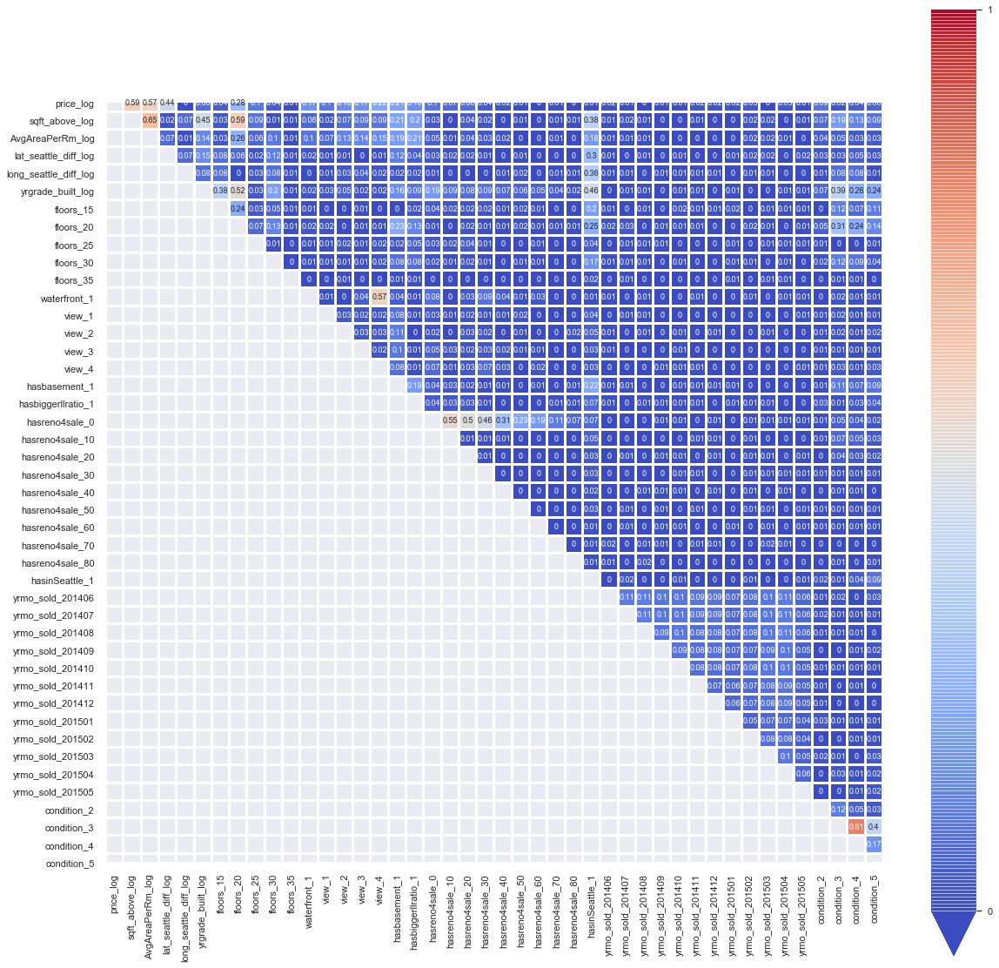

In [185]:
plt.figure(figsize=(20,20))
cbar_kws = {"orientation":"vertical", 
            "shrink":1.,
            'extend':'min', 
            'extendfrac':0.05, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(np.around(kc_preprocessed_v4.corr().abs(),2), mask=np.tril(kc_preprocessed_v4.corr().abs()), cmap="coolwarm", 
            center=0.5, linewidths=2, square= True, annot=True, annot_kws={"fontsize":9}, cbar_kws=cbar_kws)
plt.show()

### 1st-fit (before p-Value selection): 

In [186]:
X = kc_preprocessed_v4.drop('price_log', axis=1)
Y = kc_preprocessed_v4.price_log
print(Y.head(),'\n')
X.head()

0   -1.401998
1    0.279938
2   -1.799430
3    0.499698
4    0.178434
Name: price_log, dtype: float64 



,sqft_above_log,AvgAreaPerRm_log,lat_seattle_diff_log,long_seattle_diff_log,yrgrade_built_log,floors_15,floors_20,floors_25,floors_30,floors_35,...,yrmo_sold_201412,yrmo_sold_201501,yrmo_sold_201502,yrmo_sold_201503,yrmo_sold_201504,yrmo_sold_201505,condition_2,condition_3,condition_4,condition_5
0,-0.753565,-0.770991,-0.479738,-0.259714,-0.537535,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0.672693,1.165257,1.214572,0.379686,-0.674428,0,1,0,0,0,...,1,0,0,0,0,0,0,1,0,0
2,-1.752954,-1.297186,1.339437,-0.715103,-1.294285,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
3,-1.026835,-0.970121,-0.395673,0.809351,-0.196525,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4,0.073515,-0.274420,0.408570,0.565549,0.547966,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


In [187]:
X_adfeats = sm.add_constant(X)
model2 = sm.OLS(Y,X_adfeats).fit()
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.696
Model:                            OLS   Adj. R-squared:                  0.695
Method:                 Least Squares   F-statistic:                     1147.
Date:                Sun, 26 Jul 2020   Prob (F-statistic):               0.00
Time:                        16:24:45   Log-Likelihood:                -17793.
No. Observations:               21597   AIC:                         3.567e+04
Df Residuals:                   21553   BIC:                         3.603e+04
Df Model:                          43                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -1.6454      0.249     -6.614      0.000      -2.133      -1.158
sqft_above_log            0.5923      0.007     79.524      0.000       0.578       0.607
AvgAreaPerRm_log          0.0845      0.006     14.476      0.000       0.073       0.096
lat_seattle_diff_log      0.3861      0.004     95.903      0.000       0.378       0.394
long_seattle_diff_log    -0.0155      0.004     -3.790      0.000      -0.024      -0.007
yrgrade_built_log        -0.0802      0.006    -13.039      0.000      -0.092      -0.068
floors_15                -0.0141      0.015     -0.927      0.354      -0.044       0.016
floors_20                 0.1462      0.012     12.440      0.000       0.123       0.169
floors_25                 0.2960      0.045      6.569      0.000       0.208       0.384
floors_30                 0.3156      0.026     11.949      0.000       0.264       0.367
floors_35                 0.5181      0.209      2.477      0.013       0.108       0.928
waterfront_1              0.7808      0.056     13.928      0.000       0.671       0.891
view_1                    0.4392      0.031     14.180      0.000       0.379       0.500
view_2                    0.3491      0.019     18.647      0.000       0.312       0.386
view_3                    0.5343      0.025     20.991      0.000       0.484       0.584
view_4                    0.7888      0.039     20.375      0.000       0.713       0.865
hasbasement_1             0.4737      0.009     50.823      0.000       0.455       0.492
hasbiggerllratio_1       -0.1177      0.008    -14.481      0.000      -0.134      -0.102
hasreno4sale_0            0.8433      0.226      3.731      0.000       0.400       1.286
hasreno4sale_10           1.2855      0.229      5.612      0.000       0.837       1.735
hasreno4sale_20           1.1612      0.230      5.054      0.000       0.711       1.612
hasreno4sale_30           0.8706      0.230      3.779      0.000       0.419       1.322
hasreno4sale_40           0.7894      0.236      3.349      0.001       0.327       1.252
hasreno4sale_50           0.5573      0.243      2.293      0.022       0.081       1.034
hasreno4sale_60           0.4733      0.253      1.874      0.061      -0.022       0.968
hasreno4sale_70           0.4947      0.292      1.697      0.090      -0.077       1.066
hasreno4sale_80           0.8954      0.391      2.290      0.022       0.129       1.662
hasinSeattle_1            0.0922      0.011      8.496      0.000       0.071       0.113
yrmo_sold_201406          0.0137      0.018      0.773      0.440      -0.021       0.048
yrmo_sold_201407         -0.0068      0.018     -0.386      0.699      -0.041       0.028
yrmo_sold_201408         -0.0211      0.018     -1.164      0.245      -0.057       0.014
yrmo_sold_201409       

### 2nd-fit (before p-Value selection): 
#### train-test split

In [188]:
train, test = train_test_split(kc_preprocessed_v4, test_size=0.20, random_state=42)
#X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=42)
print('train:', len(train), 'test:', len(test))
print('test/train:',round(np.divide(len(test),len(train)),3))

train: 17277 test: 4320
test/train: 0.25


In [189]:
outcome = 'price_log'
predictors = '+'.join(X.columns)
formula = outcome + '~' + predictors
model3 = ols(formula=formula, data=train).fit()
model3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.698
Model:                            OLS   Adj. R-squared:                  0.697
Method:                 Least Squares   F-statistic:                     924.8
Date:                Sun, 26 Jul 2020   Prob (F-statistic):               0.00
Time:                        16:24:58   Log-Likelihood:                -14219.
No. Observations:               17277   AIC:                         2.853e+04
Df Residuals:                   17233   BIC:                         2.887e+04
Df Model:                          43                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                -1.7534      0.279     -6.293      0.000      -2.300      -1.207
sqft_above_log            0.5889      0.008     70.873      0.000       0.573       0.605
AvgAreaPerRm_log          0.0900      0.007     13.791      0.000       0.077       0.103
lat_seattle_diff_log      0.3842      0.005     85.267      0.000       0.375       0.393
long_seattle_diff_log    -0.0147      0.005     -3.218      0.001      -0.024      -0.006
yrgrade_built_log        -0.0866      0.007    -12.605      0.000      -0.100      -0.073
floors_15                -0.0196      0.017     -1.154      0.249      -0.053       0.014
floors_20                 0.1554      0.013     11.807      0.000       0.130       0.181
floors_25                 0.2866      0.051      5.651      0.000       0.187       0.386
floors_30                 0.3211      0.029     10.963      0.000       0.264       0.379
floors_35                 0.5315      0.209      2.541      0.011       0.122       0.941
waterfront_1              0.8220      0.062     13.209      0.000       0.700       0.944
view_1                    0.4439      0.035     12.651      0.000       0.375       0.513
view_2                    0.3449      0.021     16.355      0.000       0.304       0.386
view_3                    0.5229      0.029     18.136      0.000       0.466       0.579
view_4                    0.7646      0.042     18.033      0.000       0.681       0.848
hasbasement_1             0.4696      0.010     45.141      0.000       0.449       0.490
hasbiggerllratio_1       -0.1198      0.009    -13.197      0.000      -0.138      -0.102
hasreno4sale_0            0.8327      0.248      3.362      0.001       0.347       1.318
hasreno4sale_10           1.3032      0.251      5.193      0.000       0.811       1.795
hasreno4sale_20           1.1479      0.252      4.558      0.000       0.654       1.642
hasreno4sale_30           0.8407      0.253      3.325      0.001       0.345       1.336
hasreno4sale_40           0.7304      0.259      2.817      0.005       0.222       1.239
hasreno4sale_50           0.5609      0.266      2.108      0.035       0.039       1.082
hasreno4sale_60           0.5455      0.281      1.938      0.053      -0.006       1.097
hasreno4sale_70           0.3827      0.315      1.214      0.225      -0.235       1.001
hasreno4sale_80           0.7636      0.605      1.262      0.207      -0.422       1.950
hasinSeattle_1            0.0916      0.012      7.562      0.000       0.068       0.115
yrmo_sold_201406          0.0015      0.020      0.077      0.939      -0.037       0.040
yrmo_sold_201407         -0.0276      0.020     -1.408      0.159      -0.066       0.011
yrmo_sold_201408         -0.0255      0.020     -1.267      0.205      -0.065       0.014
yrmo_sold_201409       

In [190]:
coefs_0_list = list(model3.params[idx] for idx in range(len(model3.params)) if idx != 0)
coefs_0_list

[0.5888712577377135,
 0.09002759878189603,
 0.38417643791782197,
 -0.014743550540841945,
 -0.08663972721445529,
 -0.019566919666915702,
 0.15538173604209382,
 0.28660011605164326,
 0.3210960314780109,
 0.5314963950207219,
 0.8219865951206811,
 0.4439346906202303,
 0.3448803314671657,
 0.5228912639484952,
 0.7646067146194484,
 0.46962898381977436,
 -0.11977638970282233,
 0.8326526523798524,
 1.3031984738430893,
 1.147933977547436,
 0.8406668662432326,
 0.7304158997006736,
 0.5609265065992031,
 0.5455294683475441,
 0.3826922471535692,
 0.7635643965909037,
 0.09158533090979513,
 0.0015175918983948294,
 -0.027645578436705457,
 -0.025539958567799042,
 -0.03728417729582073,
 -0.026731445525727142,
 -0.04367641439916186,
 -0.04659227456068401,
 -0.05850311740556228,
 -0.006809915181876597,
 0.08308923623032793,
 0.12036683024508643,
 0.14628395817776296,
 0.33327419221382715,
 0.5641272259015954,
 0.68960757784627,
 0.8698846854872803]

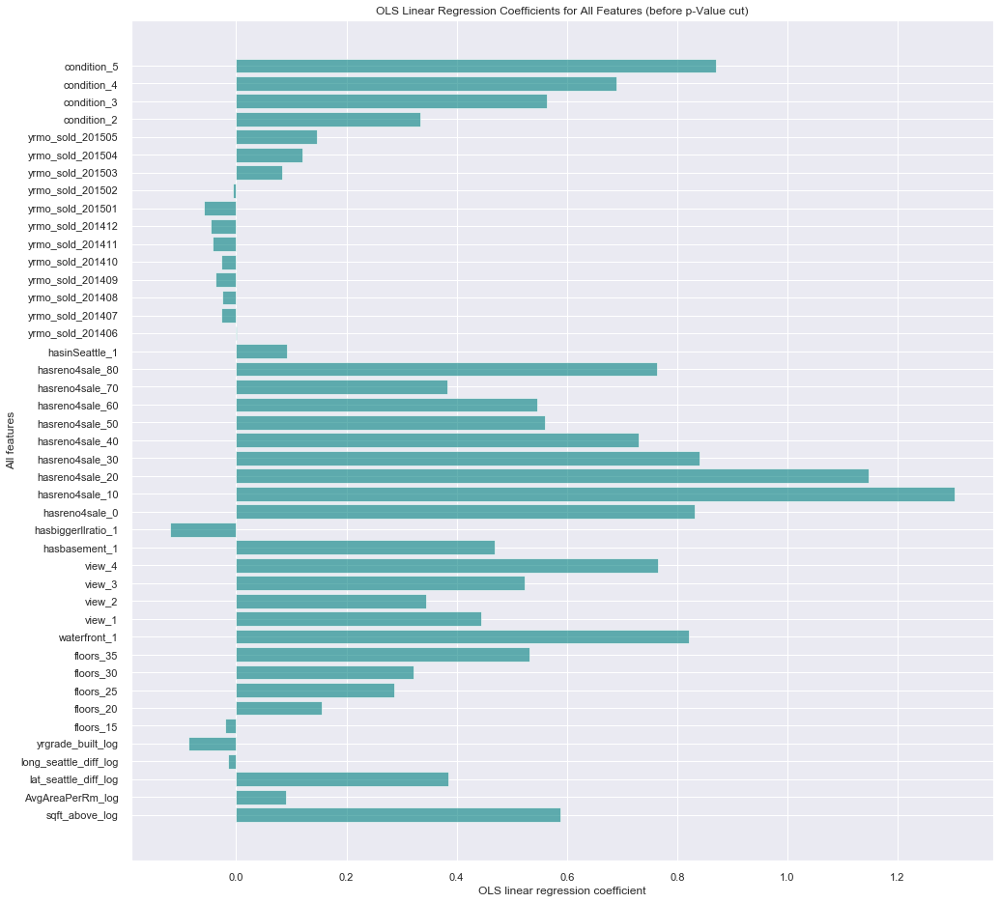

In [191]:
fig = plt.figure(figsize = (16, 16)) 
plt.barh(X.columns, coefs_0_list, color='teal', alpha=0.6) 
plt.xlabel("OLS linear regression coefficient") 
plt.ylabel("All features") 
plt.title("OLS Linear Regression Coefficients for All Features (before p-Value cut)") 
plt.show() 

#### check normality

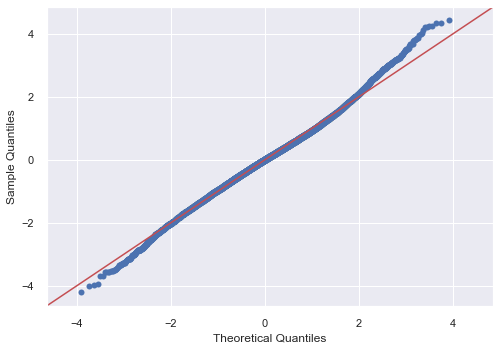

In [192]:
fig = sm.graphics.qqplot(model2.resid, dist=stats.norm, line='45', fit=True)

#### check homoscedasticity

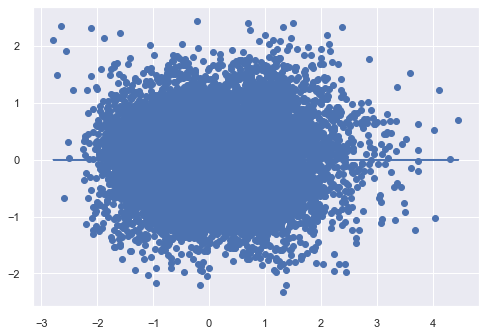

In [193]:
plt.scatter(model2.predict(X_adfeats), model2.resid)
plt.plot(model2.predict(X_adfeats), [0 for i in range(len(X_adfeats))])

### remove non-influential features
Based on the initial model, remove those features which do not appear to be statistically relevant and rerun the model.

#### 1st fit 

In [194]:
summaryA = model2.summary()
pA_table = summaryA.tables[1]
pA_table = pd.DataFrame(pA_table.data)
pA_table.columns = pA_table.iloc[0]
pA_table = pA_table.drop(0)
pA_table = pA_table.set_index(pA_table.columns[0])
pA_table['P>|t|'] = pA_table['P>|t|'].astype(float)
xA_cols = list(pA_table[pA_table['P>|t|'] < 0.05].index)
xA_cols.remove('const')
removed_cols = list(pA_table[pA_table['P>|t|'] > 0.05].index)
#removed_cols.remove('const')
pA_table.head()

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
const,-1.6454,0.249,-6.614,0.0,-2.133,-1.158
sqft_above_log,0.5923,0.007,79.524,0.0,0.578,0.607
AvgAreaPerRm_log,0.0845,0.006,14.476,0.0,0.073,0.096
lat_seattle_diff_log,0.3861,0.004,95.903,0.0,0.378,0.394
long_seattle_diff_log,-0.0155,0.004,-3.790,0.0,-0.024,-0.007


In [195]:
print(xA_cols)

['sqft_above_log', 'AvgAreaPerRm_log', 'lat_seattle_diff_log', 'long_seattle_diff_log', 'yrgrade_built_log', 'floors_20', 'floors_25', 'floors_30', 'floors_35', 'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'hasbasement_1', 'hasbiggerllratio_1', 'hasreno4sale_0', 'hasreno4sale_10', 'hasreno4sale_20', 'hasreno4sale_30', 'hasreno4sale_40', 'hasreno4sale_50', 'hasreno4sale_80', 'hasinSeattle_1', 'yrmo_sold_201412', 'yrmo_sold_201503', 'yrmo_sold_201504', 'yrmo_sold_201505', 'condition_3', 'condition_4', 'condition_5']


#### 2nd fit

In [196]:
summaryB = model3.summary()
pB_table = summaryB.tables[1]
pB_table = pd.DataFrame(pB_table.data)
pB_table.columns = pB_table.iloc[0]
pB_table = pB_table.drop(0)
pB_table = pB_table.set_index(pB_table.columns[0])
pB_table['P>|t|'] = pB_table['P>|t|'].astype(float)
xB_cols = list(pB_table[pB_table['P>|t|'] < 0.05].index)
xB_cols.remove('Intercept')
#xB_cols.remove('hasreno4sale_8')
pB_table.head()

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
Intercept,-1.7534,0.279,-6.293,0.000,-2.300,-1.207
sqft_above_log,0.5889,0.008,70.873,0.000,0.573,0.605
AvgAreaPerRm_log,0.0900,0.007,13.791,0.000,0.077,0.103
lat_seattle_diff_log,0.3842,0.005,85.267,0.000,0.375,0.393
long_seattle_diff_log,-0.0147,0.005,-3.218,0.001,-0.024,-0.006


In [197]:
print(xB_cols)

['sqft_above_log', 'AvgAreaPerRm_log', 'lat_seattle_diff_log', 'long_seattle_diff_log', 'yrgrade_built_log', 'floors_20', 'floors_25', 'floors_30', 'floors_35', 'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'hasbasement_1', 'hasbiggerllratio_1', 'hasreno4sale_0', 'hasreno4sale_10', 'hasreno4sale_20', 'hasreno4sale_30', 'hasreno4sale_40', 'hasreno4sale_50', 'hasinSeattle_1', 'yrmo_sold_201411', 'yrmo_sold_201412', 'yrmo_sold_201501', 'yrmo_sold_201503', 'yrmo_sold_201504', 'yrmo_sold_201505', 'condition_2', 'condition_3', 'condition_4', 'condition_5']


#### 1st fit (after p-Value selection)

In [198]:
X = X[xA_cols]
XA_adfeats = sm.add_constant(X)
model4 = sm.OLS(Y,XA_adfeats).fit()
model4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.696
Model:                            OLS   Adj. R-squared:                  0.695
Method:                 Least Squares   F-statistic:                     1589.
Date:                Sun, 26 Jul 2020   Prob (F-statistic):               0.00
Time:                        16:43:27   Log-Likelihood:                -17803.
No. Observations:               21597   AIC:                         3.567e+04
Df Residuals:                   21565   BIC:                         3.593e+04
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -1.1037      0.097    -11.351      0.000      -1.294      -0.913
sqft_above_log            0.5905      0.007     82.632      0.000       0.576       0.604
AvgAreaPerRm_log          0.0852      0.006     14.741      0.000       0.074       0.097
lat_seattle_diff_log      0.3861      0.004     95.926      0.000       0.378       0.394
long_seattle_diff_log    -0.0156      0.004     -3.806      0.000      -0.024      -0.008
yrgrade_built_log        -0.0784      0.006    -13.269      0.000      -0.090      -0.067
floors_20                 0.1486      0.011     12.962      0.000       0.126       0.171
floors_25                 0.3020      0.045      6.745      0.000       0.214       0.390
floors_30                 0.3176      0.026     12.048      0.000       0.266       0.369
floors_35                 0.5179      0.209      2.476      0.013       0.108       0.928
waterfront_1              0.7831      0.056     13.980      0.000       0.673       0.893
view_1                    0.4394      0.031     14.189      0.000       0.379       0.500
view_2                    0.3496      0.019     18.680      0.000       0.313       0.386
view_3                    0.5343      0.025     20.998      0.000       0.484       0.584
view_4                    0.7853      0.039     20.317      0.000       0.710       0.861
hasbasement_1             0.4743      0.009     50.907      0.000       0.456       0.493
hasbiggerllratio_1       -0.1181      0.008    -14.543      0.000      -0.134      -0.102
hasreno4sale_0            0.4307      0.089      4.846      0.000       0.257       0.605
hasreno4sale_10           0.8752      0.096      9.073      0.000       0.686       1.064
hasreno4sale_20           0.7509      0.098      7.658      0.000       0.559       0.943
hasreno4sale_30           0.4572      0.099      4.595      0.000       0.262       0.652
hasreno4sale_40           0.3790      0.111      3.406      0.001       0.161       0.597
hasreno4sale_50           0.1438      0.126      1.142      0.253      -0.103       0.391
hasreno4sale_80           0.4890      0.331      1.477      0.140      -0.160       1.138
hasinSeattle_1            0.0910      0.011      8.417      0.000       0.070       0.112
yrmo_sold_201412         -0.0329      0.015     -2.178      0.029      -0.062      -0.003
yrmo_sold_201503          0.0990      0.014      7.315      0.000       0.072       0.125
yrmo_sold_201504          0.1379      0.013     11.011      0.000       0.113       0.163
yrmo_sold_201505          0.1692      0.022      7.622      0.000       0.126       0.213
condition_3               0.2947      0.040      7.396      0.000       0.217       0.373
condition_4               0.4217      0.040     10.549      0.000       0.343       0.500
condition_5            

In [199]:
mse = make_scorer(mean_squared_error)

crossvalidation = KFold(n_splits=80, shuffle=True, random_state=1) # 10-fold
adfeats_r2 = np.mean(cross_val_score(linreg, X, Y, scoring='r2', cv=crossvalidation))
adfeats_mse = np.mean(cross_val_score(linreg, X, Y, scoring=mse, cv=crossvalidation))
adfeats_rmse = np.sqrt(adfeats_mse)

print(f' dummy features added model r2:{adfeats_r2:.5f}, mse:{adfeats_mse:.5f}, rmse:{adfeats_rmse:.5f}')

 dummy features added model r2:0.69166, mse:0.30554, rmse:0.55275


In [200]:
summaryC = model4.summary()
pC_table = summaryC.tables[1]
pC_table = pd.DataFrame(pC_table.data)
pC_table.columns = pC_table.iloc[0]
pC_table = pC_table.drop(0)
pC_table = pC_table.set_index(pC_table.columns[0])
pC_table['P>|t|'] = pC_table['P>|t|'].astype(float)
xC_cols = list(pC_table[pC_table['P>|t|'] < 0.05].index)
xC_cols.remove('const')
removed_cols = list(pC_table[pC_table['P>|t|'] > 0.05].index)
#removed_cols.remove('const')
pC_table.head()

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
const,-1.1037,0.097,-11.351,0.0,-1.294,-0.913
sqft_above_log,0.5905,0.007,82.632,0.0,0.576,0.604
AvgAreaPerRm_log,0.0852,0.006,14.741,0.0,0.074,0.097
lat_seattle_diff_log,0.3861,0.004,95.926,0.0,0.378,0.394
long_seattle_diff_log,-0.0156,0.004,-3.806,0.0,-0.024,-0.008


In [201]:
print(xC_cols)

['sqft_above_log', 'AvgAreaPerRm_log', 'lat_seattle_diff_log', 'long_seattle_diff_log', 'yrgrade_built_log', 'floors_20', 'floors_25', 'floors_30', 'floors_35', 'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'hasbasement_1', 'hasbiggerllratio_1', 'hasreno4sale_0', 'hasreno4sale_10', 'hasreno4sale_20', 'hasreno4sale_30', 'hasreno4sale_40', 'hasinSeattle_1', 'yrmo_sold_201412', 'yrmo_sold_201503', 'yrmo_sold_201504', 'yrmo_sold_201505', 'condition_3', 'condition_4', 'condition_5']


In [202]:
X = X[xC_cols]
XC_adfeats = sm.add_constant(X)
model6 = sm.OLS(Y,XC_adfeats).fit()
model6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.695
Model:                            OLS   Adj. R-squared:                  0.695
Method:                 Least Squares   F-statistic:                     1699.
Date:                Sun, 26 Jul 2020   Prob (F-statistic):               0.00
Time:                        16:43:59   Log-Likelihood:                -17804.
No. Observations:               21597   AIC:                         3.567e+04
Df Residuals:                   21567   BIC:                         3.591e+04
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -1.0172      0.074    -13.790      0.000      -1.162      -0.873
sqft_above_log            0.5903      0.007     82.624      0.000       0.576       0.604
AvgAreaPerRm_log          0.0853      0.006     14.753      0.000       0.074       0.097
lat_seattle_diff_log      0.3860      0.004     95.917      0.000       0.378       0.394
long_seattle_diff_log    -0.0155      0.004     -3.798      0.000      -0.024      -0.008
yrgrade_built_log        -0.0784      0.006    -13.260      0.000      -0.090      -0.067
floors_20                 0.1486      0.011     12.964      0.000       0.126       0.171
floors_25                 0.3016      0.045      6.735      0.000       0.214       0.389
floors_30                 0.3176      0.026     12.047      0.000       0.266       0.369
floors_35                 0.5178      0.209      2.476      0.013       0.108       0.928
waterfront_1              0.7830      0.056     13.980      0.000       0.673       0.893
view_1                    0.4399      0.031     14.208      0.000       0.379       0.501
view_2                    0.3501      0.019     18.710      0.000       0.313       0.387
view_3                    0.5338      0.025     20.980      0.000       0.484       0.584
view_4                    0.7844      0.039     20.296      0.000       0.709       0.860
hasbasement_1             0.4744      0.009     50.908      0.000       0.456       0.493
hasbiggerllratio_1       -0.1180      0.008    -14.531      0.000      -0.134      -0.102
hasreno4sale_0            0.3440      0.062      5.522      0.000       0.222       0.466
hasreno4sale_10           0.7886      0.073     10.839      0.000       0.646       0.931
hasreno4sale_20           0.6643      0.075      8.874      0.000       0.518       0.811
hasreno4sale_30           0.3706      0.077      4.828      0.000       0.220       0.521
hasreno4sale_40           0.2924      0.092      3.195      0.001       0.113       0.472
hasinSeattle_1            0.0910      0.011      8.421      0.000       0.070       0.112
yrmo_sold_201412         -0.0328      0.015     -2.175      0.030      -0.062      -0.003
yrmo_sold_201503          0.0988      0.014      7.301      0.000       0.072       0.125
yrmo_sold_201504          0.1380      0.013     11.011      0.000       0.113       0.163
yrmo_sold_201505          0.1692      0.022      7.621      0.000       0.126       0.213
condition_3               0.2948      0.040      7.399      0.000       0.217       0.373
condition_4               0.4219      0.040     10.554      0.000       0.344       0.500
condition_5               0.5916      0.042     14.231      0.000       0.510       0.673
==============================================================================
Omnibus:                      234.

#### 2nd fit (after p-Value selection)

In [203]:
predictors = '+'.join(xB_cols)
formula = outcome + '~' + predictors
model5 = ols(formula=formula, data=train).fit()
model5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.697
Model:                            OLS   Adj. R-squared:                  0.697
Method:                 Least Squares   F-statistic:                     1204.
Date:                Sun, 26 Jul 2020   Prob (F-statistic):               0.00
Time:                        16:44:06   Log-Likelihood:                -14225.
No. Observations:               17277   AIC:                         2.852e+04
Df Residuals:                   17243   BIC:                         2.878e+04
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                -1.3432      0.162     -8.307      0.000      -1.660      -1.026
sqft_above_log            0.5860      0.008     73.478      0.000       0.570       0.602
AvgAreaPerRm_log          0.0911      0.006     14.090      0.000       0.078       0.104
lat_seattle_diff_log      0.3842      0.005     85.303      0.000       0.375       0.393
long_seattle_diff_log    -0.0150      0.005     -3.285      0.001      -0.024      -0.006
yrgrade_built_log        -0.0845      0.007    -12.781      0.000      -0.097      -0.072
floors_20                 0.1587      0.013     12.376      0.000       0.134       0.184
floors_25                 0.2947      0.050      5.849      0.000       0.196       0.393
floors_30                 0.3239      0.029     11.087      0.000       0.267       0.381
floors_35                 0.5335      0.209      2.551      0.011       0.124       0.943
waterfront_1              0.8269      0.062     13.305      0.000       0.705       0.949
view_1                    0.4452      0.035     12.692      0.000       0.376       0.514
view_2                    0.3458      0.021     16.407      0.000       0.304       0.387
view_3                    0.5242      0.029     18.185      0.000       0.468       0.581
view_4                    0.7614      0.042     17.993      0.000       0.678       0.844
hasbasement_1             0.4698      0.010     45.182      0.000       0.449       0.490
hasbiggerllratio_1       -0.1201      0.009    -13.249      0.000      -0.138      -0.102
hasreno4sale_0            0.4059      0.100      4.073      0.000       0.211       0.601
hasreno4sale_10           0.8785      0.108      8.149      0.000       0.667       1.090
hasreno4sale_20           0.7236      0.110      6.580      0.000       0.508       0.939
hasreno4sale_30           0.4145      0.112      3.703      0.000       0.195       0.634
hasreno4sale_40           0.3056      0.126      2.429      0.015       0.059       0.552
hasreno4sale_50           0.1340      0.139      0.963      0.336      -0.139       0.407
hasinSeattle_1            0.0902      0.012      7.478      0.000       0.067       0.114
yrmo_sold_201411         -0.0253      0.017     -1.460      0.144      -0.059       0.009
yrmo_sold_201412         -0.0283      0.017     -1.668      0.095      -0.062       0.005
yrmo_sold_201501         -0.0400      0.020     -1.954      0.051      -0.080       0.000
yrmo_sold_201503          0.1014      0.015      6.672      0.000       0.072       0.131
yrmo_sold_201504          0.1385      0.014      9.772      0.000       0.111       0.166
yrmo_sold_201505          0.1643      0.025      6.538      0.000       0.115       0.214
condition_2               0.3312      0.135      2.449      0.014       0.066       0.596
condition_3            

In [204]:
train2 = train[xB_cols]
Y2 = train.price_log

mse = make_scorer(mean_squared_error)

crossvalidation = KFold(n_splits=80, shuffle=True, random_state=1) # 10-fold
adfeats_r2 = np.mean(cross_val_score(linreg, train2, Y2, scoring='r2', cv=crossvalidation))
adfeats_mse = np.mean(cross_val_score(linreg, train2, Y2, scoring=mse, cv=crossvalidation))
adfeats_rmse = np.sqrt(adfeats_mse)

print(f' dummy features added model r2:{adfeats_r2:.5f}, mse:{adfeats_mse:.5f}, rmse:{adfeats_rmse:.5f}')

 dummy features added model r2:0.69226, mse:0.30531, rmse:0.55254


In [205]:
summaryD = model5.summary()
#print(summaryD)
#print('****************************************************************************************************************')
pD_table = summaryD.tables[1]
pD_table = pd.DataFrame(pD_table.data)
#print(pD_table)
#print('****************************************************************************************************************')
pD_table.columns = pD_table.iloc[0]
#print(pD_table.columns)
#print('****************************************************************************************************************')
pD_table = pD_table.drop(0)
pD_table = pD_table.set_index(pD_table.columns[0])
pD_table['P>|t|'] = pD_table['P>|t|'].astype(float)
xD_cols = list(pD_table[pD_table['P>|t|'] < 0.05].index)
xD_cols.remove('Intercept')
#xD_cols.remove('hasreno4sale_0')
pD_table.head()

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
Intercept,-1.3432,0.162,-8.307,0.000,-1.660,-1.026
sqft_above_log,0.5860,0.008,73.478,0.000,0.570,0.602
AvgAreaPerRm_log,0.0911,0.006,14.090,0.000,0.078,0.104
lat_seattle_diff_log,0.3842,0.005,85.303,0.000,0.375,0.393
long_seattle_diff_log,-0.0150,0.005,-3.285,0.001,-0.024,-0.006


In [206]:
print(xD_cols)

['sqft_above_log', 'AvgAreaPerRm_log', 'lat_seattle_diff_log', 'long_seattle_diff_log', 'yrgrade_built_log', 'floors_20', 'floors_25', 'floors_30', 'floors_35', 'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'hasbasement_1', 'hasbiggerllratio_1', 'hasreno4sale_0', 'hasreno4sale_10', 'hasreno4sale_20', 'hasreno4sale_30', 'hasreno4sale_40', 'hasinSeattle_1', 'yrmo_sold_201503', 'yrmo_sold_201504', 'yrmo_sold_201505', 'condition_2', 'condition_3', 'condition_4', 'condition_5']


In [207]:
predictors = '+'.join(xD_cols)
formula = outcome + '~' + predictors
model7 = ols(formula=formula, data=train).fit()
model7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.697
Model:                            OLS   Adj. R-squared:                  0.697
Method:                 Least Squares   F-statistic:                     1370.
Date:                Sun, 26 Jul 2020   Prob (F-statistic):               0.00
Time:                        16:44:43   Log-Likelihood:                -14229.
No. Observations:               17277   AIC:                         2.852e+04
Df Residuals:                   17247   BIC:                         2.875e+04
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                -1.2838      0.145     -8.832      0.000      -1.569      -0.999
sqft_above_log            0.5861      0.008     73.495      0.000       0.570       0.602
AvgAreaPerRm_log          0.0911      0.006     14.089      0.000       0.078       0.104
lat_seattle_diff_log      0.3843      0.005     85.329      0.000       0.375       0.393
long_seattle_diff_log    -0.0147      0.005     -3.222      0.001      -0.024      -0.006
yrgrade_built_log        -0.0845      0.007    -12.775      0.000      -0.097      -0.072
floors_20                 0.1586      0.013     12.369      0.000       0.134       0.184
floors_25                 0.2958      0.050      5.872      0.000       0.197       0.394
floors_30                 0.3248      0.029     11.116      0.000       0.268       0.382
floors_35                 0.5329      0.209      2.548      0.011       0.123       0.943
waterfront_1              0.8259      0.062     13.289      0.000       0.704       0.948
view_1                    0.4463      0.035     12.724      0.000       0.378       0.515
view_2                    0.3458      0.021     16.403      0.000       0.304       0.387
view_3                    0.5242      0.029     18.184      0.000       0.468       0.581
view_4                    0.7610      0.042     17.986      0.000       0.678       0.844
hasbasement_1             0.4701      0.010     45.212      0.000       0.450       0.490
hasbiggerllratio_1       -0.1202      0.009    -13.269      0.000      -0.138      -0.102
hasreno4sale_0            0.3367      0.070      4.800      0.000       0.199       0.474
hasreno4sale_10           0.8109      0.081      9.966      0.000       0.651       0.970
hasreno4sale_20           0.6562      0.084      7.792      0.000       0.491       0.821
hasreno4sale_30           0.3448      0.087      3.971      0.000       0.175       0.515
hasreno4sale_40           0.2385      0.104      2.292      0.022       0.035       0.442
hasinSeattle_1            0.0899      0.012      7.453      0.000       0.066       0.114
yrmo_sold_201503          0.1084      0.015      7.238      0.000       0.079       0.138
yrmo_sold_201504          0.1455      0.014     10.446      0.000       0.118       0.173
yrmo_sold_201505          0.1713      0.025      6.853      0.000       0.122       0.220
condition_2               0.3315      0.135      2.451      0.014       0.066       0.597
condition_3               0.5623      0.127      4.425      0.000       0.313       0.811
condition_4               0.6894      0.127      5.426      0.000       0.440       0.938
condition_5               0.8698      0.128      6.814      0.000       0.620       1.120
==============================================================================
Omnibus:                      192.

In [208]:
with open('modelsummary.txt', 'w') as fh:
    fh.write(model7.summary().as_text())

In [244]:
mse = make_scorer(mean_squared_error)

crossvalidation = KFold(n_splits=80, shuffle=True, random_state=1) # 10-fold
adfeats_r2 = np.mean(cross_val_score(linreg, train[xD_cols], train.price_log, scoring='r2', cv=crossvalidation))
adfeats_mse = np.mean(cross_val_score(linreg, train[xD_cols], train.price_log, scoring=mse, cv=crossvalidation))
adfeats_rmse = np.sqrt(adfeats_mse)

print(f' dummy features added model r2:{adfeats_r2:.5f}, mse:{adfeats_mse:.5f}, rmse:{adfeats_rmse:.5f}')

 dummy features added model r2:0.69228, mse:0.30530, rmse:0.55254


In [209]:
coefs_list = list(model7.params[idx] for idx in range(len(model7.params)) if idx != 0)
coefs_list

[0.5861157421350276,
 0.09107188197285157,
 0.38430303671514077,
 -0.014736285677431075,
 -0.08446274502464582,
 0.1586418001194962,
 0.2957527961835761,
 0.32478065728984795,
 0.5329219372986792,
 0.8258867382369386,
 0.446311289944622,
 0.3457510781873672,
 0.5241686009578166,
 0.7609537718897258,
 0.47010925969470857,
 -0.12023317479932692,
 0.336718395472846,
 0.8108707766291579,
 0.6562181751923537,
 0.34478968407910127,
 0.2385239597379264,
 0.08990966068427095,
 0.10836489086464574,
 0.14553067117722351,
 0.1712772494549994,
 0.33146808632592256,
 0.5622665630761877,
 0.6894307899445669,
 0.8698027343043564]

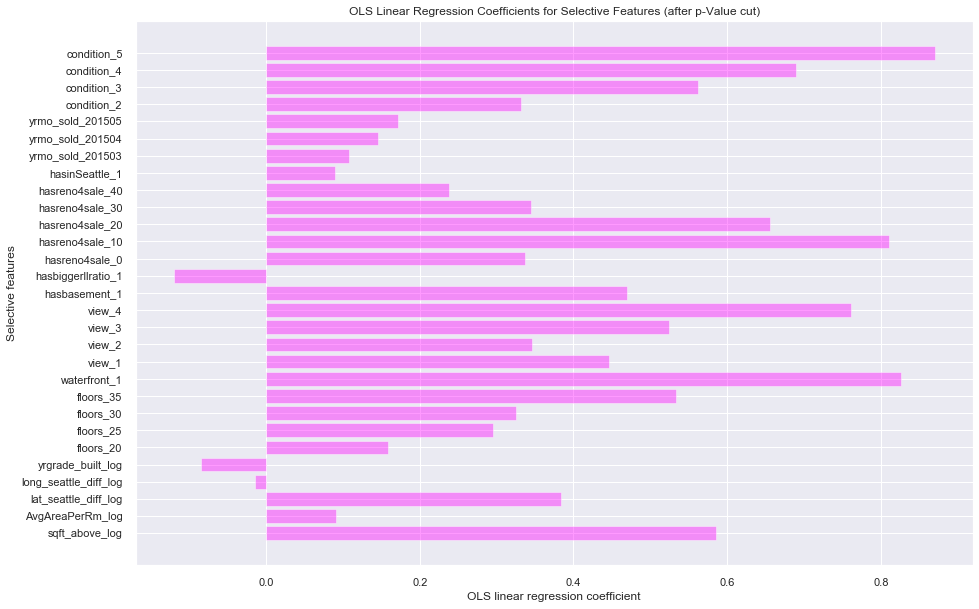

In [210]:
fig = plt.figure(figsize = (15, 10)) 
plt.barh(xD_cols, coefs_list, color='magenta', alpha=0.4) 
plt.xlabel("OLS linear regression coefficient") 
plt.ylabel("Selective features") 
plt.title("OLS Linear Regression Coefficients for Selective Features (after p-Value cut)") 
plt.show() 

#### multicollinearity check

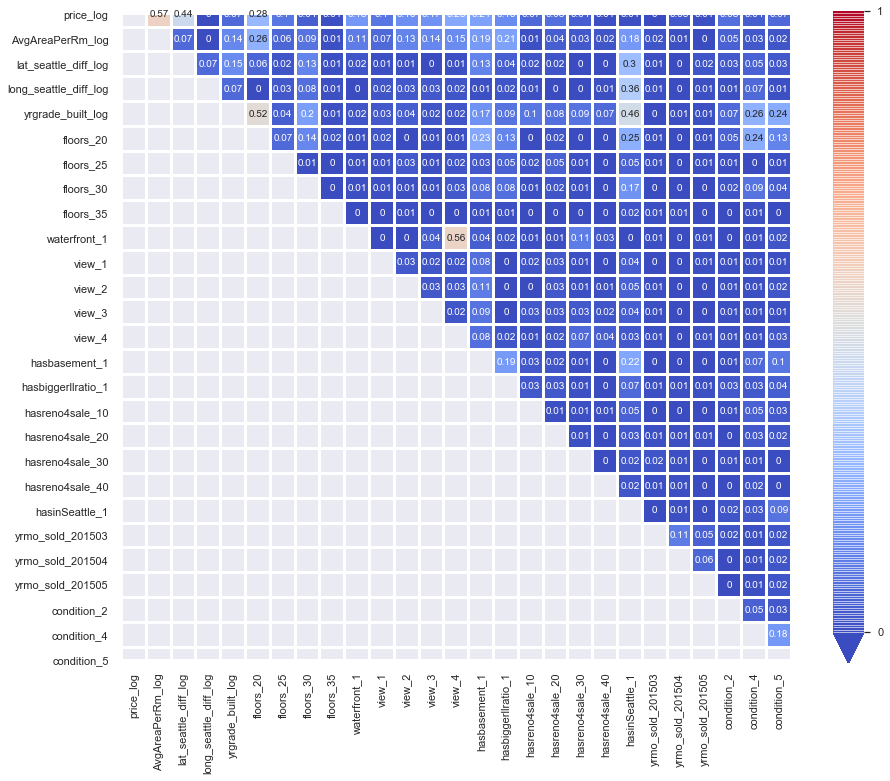

In [243]:
x_cols = ['price_log', 'AvgAreaPerRm_log', 'lat_seattle_diff_log', 'long_seattle_diff_log', 'yrgrade_built_log', 
          'floors_20', 'floors_25', 'floors_30', 'floors_35', 'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 
          'hasbasement_1', 'hasbiggerllratio_1', 'hasreno4sale_10', 'hasreno4sale_20', 'hasreno4sale_30', 
          'hasreno4sale_40', 'hasinSeattle_1', 'yrmo_sold_201503', 'yrmo_sold_201504', 'yrmo_sold_201505', 'condition_2', 
          'condition_4', 'condition_5']
plt.figure(figsize=(15,15))
cbar_kws = {"orientation":"vertical", 
            "shrink":.8,
            'extend':'min', 
            'extendfrac':0.05, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(np.around(train[x_cols].corr().abs(),2), mask=np.tril(train[x_cols].corr().abs()), cmap="coolwarm", center=0.5, 
            linewidths=2, square= True, annot=True, annot_kws={"fontsize":10}, cbar_kws=cbar_kws)
plt.show()

In [213]:
vif = [variance_inflation_factor(train[x_cols].values, i) for i in range(train[x_cols].shape[1])]
list(zip(train[x_cols].columns, np.around(vif,5)))

[('price_log', 2.50496),
 ('AvgAreaPerRm_log', 1.74926),
 ('lat_seattle_diff_log', 1.55381),
 ('long_seattle_diff_log', 1.18126),
 ('yrgrade_built_log', 2.42612),
 ('floors_20', 3.19696),
 ('floors_25', 1.04432),
 ('floors_30', 1.40187),
 ('floors_35', 1.00556),
 ('waterfront_1', 1.50387),
 ('view_1', 1.04776),
 ('view_2', 1.11562),
 ('view_3', 1.09837),
 ('view_4', 1.57421),
 ('hasbasement_1', 2.2502),
 ('hasbiggerllratio_1', 2.21956),
 ('hasreno4sale_0', 206.22074),
 ('hasreno4sale_10', 3.152),
 ('hasreno4sale_20', 2.69126),
 ('hasreno4sale_30', 2.40571),
 ('hasreno4sale_40', 1.62771),
 ('hasinSeattle_1', 3.31116),
 ('yrmo_sold_201503', 1.11766),
 ('yrmo_sold_201504', 1.13959),
 ('yrmo_sold_201505', 1.04162),
 ('condition_2', 2.67036),
 ('condition_3', 140.3334),
 ('condition_4', 57.14275),
 ('condition_5', 18.21913)]

In [214]:
x2_cols = ['price_log', 'AvgAreaPerRm_log', 'lat_seattle_diff_log', 'long_seattle_diff_log', 'yrgrade_built_log', 
           'floors_20', 'floors_25', 'floors_30', 'floors_35', 'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 
           'hasbasement_1', 'hasbiggerllratio_1', 'hasreno4sale_10', 'hasreno4sale_20', 'hasreno4sale_30', 
           'hasreno4sale_40', 'hasinSeattle_1', 'yrmo_sold_201503', 'yrmo_sold_201504', 'yrmo_sold_201505', 'condition_2', 
           'condition_3', 'condition_4', 'condition_5']
vif = [variance_inflation_factor(train[x2_cols].values, i) for i in range(train[x2_cols].shape[1])]
list(zip(train[x2_cols].columns, np.around(vif,5)))

[('price_log', 2.50474),
 ('AvgAreaPerRm_log', 1.74925),
 ('lat_seattle_diff_log', 1.5538),
 ('long_seattle_diff_log', 1.18095),
 ('yrgrade_built_log', 2.41738),
 ('floors_20', 3.19693),
 ('floors_25', 1.04432),
 ('floors_30', 1.40183),
 ('floors_35', 1.00556),
 ('waterfront_1', 1.50367),
 ('view_1', 1.0477),
 ('view_2', 1.1156),
 ('view_3', 1.09831),
 ('view_4', 1.57383),
 ('hasbasement_1', 2.24932),
 ('hasbiggerllratio_1', 2.21929),
 ('hasreno4sale_10', 1.05392),
 ('hasreno4sale_20', 1.04033),
 ('hasreno4sale_30', 1.03803),
 ('hasreno4sale_40', 1.01503),
 ('hasinSeattle_1', 3.30906),
 ('yrmo_sold_201503', 1.11762),
 ('yrmo_sold_201504', 1.13959),
 ('yrmo_sold_201505', 1.04141),
 ('condition_2', 1.04158),
 ('condition_3', 4.0825),
 ('condition_4', 1.92939),
 ('condition_5', 1.40332)]

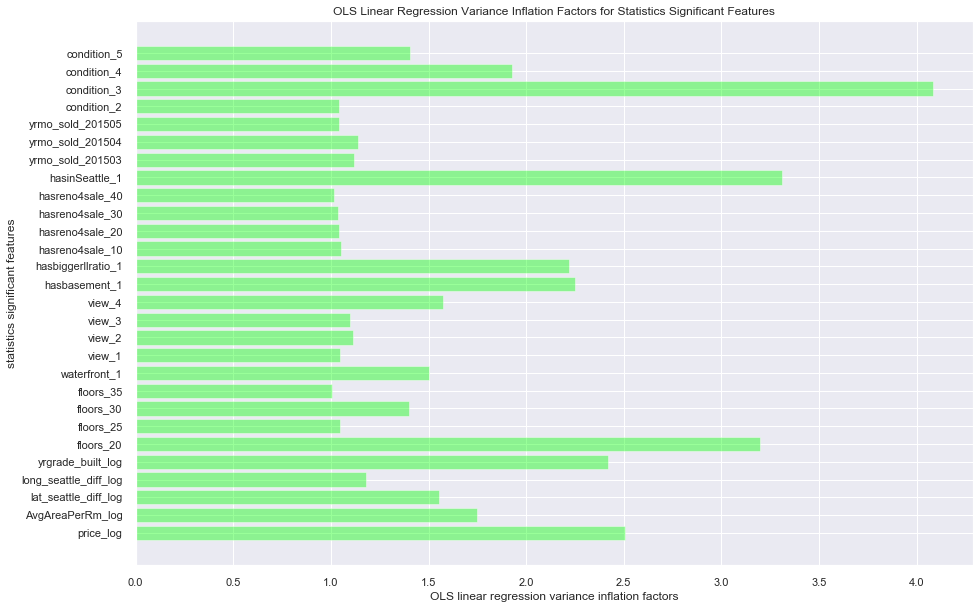

In [215]:
fig = plt.figure(figsize = (15, 10)) 
plt.barh(x2_cols, vif, color='lime', alpha=0.4) 
plt.xlabel("OLS linear regression variance inflation factors") 
plt.ylabel("statistics significant features") 
plt.title("OLS Linear Regression Variance Inflation Factors for Statistics Significant Features") 
plt.show() 

In [217]:
x3_cols = ['price_log', 'AvgAreaPerRm_log', 'lat_seattle_diff_log', 'long_seattle_diff_log', 'yrgrade_built_log', 
           'floors_20', 'floors_25', 'floors_30', 'floors_35', 'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 
           'hasbasement_1', 'hasbiggerllratio_1', 'hasreno4sale_10', 'hasreno4sale_20', 'hasreno4sale_30', 'hasreno4sale_40', 
           'hasinSeattle_1', 'yrmo_sold_201503', 'yrmo_sold_201504', 'yrmo_sold_201505', 'condition_2', 'condition_3', 
           'condition_4', 'condition_5']
vif = [variance_inflation_factor(train[x3_cols].values, i) for i in range(train[x3_cols].shape[1])]
list(zip(train[x3_cols].columns, np.around(vif,5)))

[('price_log', 2.50474),
 ('AvgAreaPerRm_log', 1.74925),
 ('lat_seattle_diff_log', 1.5538),
 ('long_seattle_diff_log', 1.18095),
 ('yrgrade_built_log', 2.41738),
 ('floors_20', 3.19693),
 ('floors_25', 1.04432),
 ('floors_30', 1.40183),
 ('floors_35', 1.00556),
 ('waterfront_1', 1.50367),
 ('view_1', 1.0477),
 ('view_2', 1.1156),
 ('view_3', 1.09831),
 ('view_4', 1.57383),
 ('hasbasement_1', 2.24932),
 ('hasbiggerllratio_1', 2.21929),
 ('hasreno4sale_10', 1.05392),
 ('hasreno4sale_20', 1.04033),
 ('hasreno4sale_30', 1.03803),
 ('hasreno4sale_40', 1.01503),
 ('hasinSeattle_1', 3.30906),
 ('yrmo_sold_201503', 1.11762),
 ('yrmo_sold_201504', 1.13959),
 ('yrmo_sold_201505', 1.04141),
 ('condition_2', 1.04158),
 ('condition_3', 4.0825),
 ('condition_4', 1.92939),
 ('condition_5', 1.40332)]

###  use feature ranking with recursive feature elimination: Top 15 features
####  1st fit (after p-Value selection)

In [218]:
selector = RFE(linreg, n_features_to_select=15)
selector = selector.fit(X[xC_cols], Y.values.ravel())
selector.support_ 

array([ True, False,  True, False, False, False,  True, False,  True,
        True,  True,  True,  True,  True,  True, False, False,  True,
        True,  True,  True, False, False, False, False, False, False,
       False,  True])

In [219]:
selector.ranking_

array([ 1, 12,  1, 15,  9,  8,  1,  7,  1,  1,  1,  1,  1,  1,  1, 10,  2,
        1,  1,  1,  1, 13, 14, 11,  6,  5,  4,  3,  1])

In [220]:
estimators = selector.estimator_
print(estimators.coef_)
print(estimators.intercept_)

[0.61741048 0.41122952 0.25328188 0.35120547 0.80241149 0.50986327
 0.42233502 0.61839764 0.88596242 0.49365388 0.48793421 0.37687896
 0.10991686 0.09133159 0.27725619]
-0.29256164376506566


In [221]:
print(X[xC_cols].columns)
selected_columns = X[xC_cols].columns[selector.support_]
selected_columns

Index(['sqft_above_log', 'AvgAreaPerRm_log', 'lat_seattle_diff_log',
       'long_seattle_diff_log', 'yrgrade_built_log', 'floors_20', 'floors_25',
       'floors_30', 'floors_35', 'waterfront_1', 'view_1', 'view_2', 'view_3',
       'view_4', 'hasbasement_1', 'hasbiggerllratio_1', 'hasreno4sale_0',
       'hasreno4sale_10', 'hasreno4sale_20', 'hasreno4sale_30',
       'hasreno4sale_40', 'hasinSeattle_1', 'yrmo_sold_201412',
       'yrmo_sold_201503', 'yrmo_sold_201504', 'yrmo_sold_201505',
       'condition_3', 'condition_4', 'condition_5'],
      dtype='object')


Index(['sqft_above_log', 'lat_seattle_diff_log', 'floors_25', 'floors_35',
       'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'hasbasement_1',
       'hasreno4sale_10', 'hasreno4sale_20', 'hasreno4sale_30',
       'hasreno4sale_40', 'condition_5'],
      dtype='object')

In [222]:
linreg.fit(X[selected_columns],Y)
yhat = linreg.predict(X[selected_columns])
yhat

array([-0.95510329,  1.22580499, -0.82403789, ..., -0.87527023,
       -0.43156839, -0.87628185])

In [223]:
SS_residual = np.dot(Y-yhat,Y-yhat)
SS_total = np.dot(Y-np.mean(Y),Y-np.mean(Y))
R_squared = 1 - (SS_residual / SS_total)
adjusted_R_squared = 1 - (1 - R_squared) * ((len(Y) - 1) / (len(Y) - X[selected_columns].shape[1] - 1))

print(round(R_squared,6))
print(round(adjusted_R_squared,6))

0.675348
0.675123


#### 2nd fit (after p-Value selection)

In [224]:
selector = RFE(linreg, n_features_to_select=15)
selector = selector.fit(train[xD_cols], train['price_log'].values.ravel())
selector.support_ 

array([ True, False,  True, False, False, False,  True, False,  True,
        True,  True,  True,  True,  True,  True, False, False,  True,
        True,  True,  True, False, False, False, False, False, False,
       False,  True])

In [225]:
selector.ranking_

array([ 1, 13,  1, 15, 10,  9,  1,  8,  1,  1,  1,  1,  1,  1,  1, 11,  2,
        1,  1,  1,  1, 14, 12,  7,  6,  5,  4,  3,  1])

In [226]:
estimators = selector.estimator_
print(estimators.coef_)
print(estimators.intercept_)

[0.6168177  0.41128003 0.25305359 0.35084386 0.85233285 0.52730901
 0.42075106 0.61780074 0.85563679 0.49167733 0.52355153 0.37739636
 0.09468599 0.05642725 0.29432053]
-0.29395538431048135


In [227]:
print(train[xD_cols].columns)
selected_columns = train[xD_cols].columns[selector.support_]
selected_columns

Index(['sqft_above_log', 'AvgAreaPerRm_log', 'lat_seattle_diff_log',
       'long_seattle_diff_log', 'yrgrade_built_log', 'floors_20', 'floors_25',
       'floors_30', 'floors_35', 'waterfront_1', 'view_1', 'view_2', 'view_3',
       'view_4', 'hasbasement_1', 'hasbiggerllratio_1', 'hasreno4sale_0',
       'hasreno4sale_10', 'hasreno4sale_20', 'hasreno4sale_30',
       'hasreno4sale_40', 'hasinSeattle_1', 'yrmo_sold_201503',
       'yrmo_sold_201504', 'yrmo_sold_201505', 'condition_2', 'condition_3',
       'condition_4', 'condition_5'],
      dtype='object')


Index(['sqft_above_log', 'lat_seattle_diff_log', 'floors_25', 'floors_35',
       'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'hasbasement_1',
       'hasreno4sale_10', 'hasreno4sale_20', 'hasreno4sale_30',
       'hasreno4sale_40', 'condition_5'],
      dtype='object')

In [228]:
linreg.fit(train[selected_columns],train['price_log'])
yhat = linreg.predict(train[selected_columns])
yhat

array([-0.45529272, -0.14731897,  0.73715387, ..., -0.10969232,
       -2.70302191,  1.02106873])

In [229]:
linreg.fit(train[xD_cols],train['price_log'])
yhatp = linreg.predict(train[xD_cols])
yhatp

array([-0.3095813 , -0.22508646,  0.72059666, ..., -0.20837914,
       -2.73812218,  0.95863259])

In [230]:
SS_residual = np.dot(train['price_log']-yhat,train['price_log']-yhat)
SS_total = np.dot(train['price_log']-np.mean(train['price_log']),train['price_log']-np.mean(train['price_log']))
R_squared = 1 - (SS_residual / SS_total)
adjusted_R_squared = 1 - (1 - R_squared) * ((len(train['price_log']) - 1) / (len(train['price_log']) - train[selected_columns].shape[1] - 1))

print(round(R_squared,5))
print(round(adjusted_R_squared,5))

0.67586
0.67557


In [231]:
SS_residual = np.dot(train['price_log']-yhatp,train['price_log']-yhatp)
SS_total = np.dot(train['price_log']-np.mean(train['price_log']),train['price_log']-np.mean(train['price_log']))
R_squared = 1 - (SS_residual / SS_total)
adjusted_R_squared = 1 - (1 - R_squared) * ((len(train['price_log']) - 1) / (len(train['price_log']) - train[xD_cols].shape[1] - 1))

print(round(R_squared,5))
print(round(adjusted_R_squared,5))

0.6973
0.69679


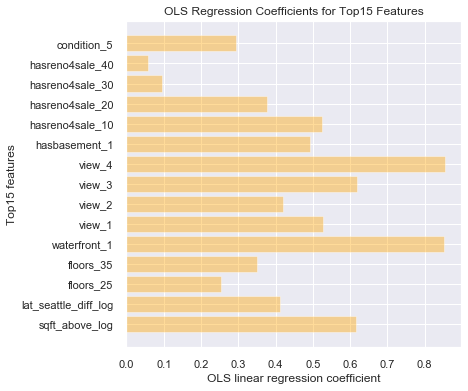

In [232]:
fig = plt.figure(figsize = (6, 6)) 
plt.barh(selected_columns, estimators.coef_, color='orange', alpha=0.4) 
plt.xlabel("OLS linear regression coefficient") 
plt.ylabel("Top15 features") 
plt.title("OLS Regression Coefficients for Top15 Features") 
plt.show() 

### conclusion (baseline model w/ dummy creation & addition):

final features:

- **'sqft_above_log'** (Top15), 

- **'AvgAreaPerRm_log'**,

- **'lat_seattle_diff_log'** (Top15),

- **'long_seattle_diff_log'**,

- **'yrgrade_built_log'**,

- **'floors_20'**,

- **'floors_25'** (Top15),

- **'floors_30'**,

- **'floors_35'** (Top15),

- **'waterfront_1'** (Top15),
         
- **'view_1'** (Top15),

- **'view_2'** (Top15),

- **'view_3'** (Top15),

- **'view_4'** (Top15),

- **'condition_2'**,

- **'condition_3'**,

- **'condition_4'**,

- **'condition_5'** (Top15),

- **'hasbasement_1'** (Top15),

- **'hasbiggerllratio_1'**,

- **'hasreno4sale_0'**,

- **'hasreno4sale_10'** (Top15),
       
- **'hasreno4sale_20'** (Top15), 

- **'hasreno4sale_30'** (Top15), 

- **'hasreno4sale_40'** (Top15),

- **'hasinSeattle_1'**,

- **'yrmo_sold_201503'**

- **'yrmo_sold_201504'**

- **'yrmo_sold_201505'**

### check normality (QQ-plot & Jarque-Bera Test)
#### 1st fit (after p-Value selection)

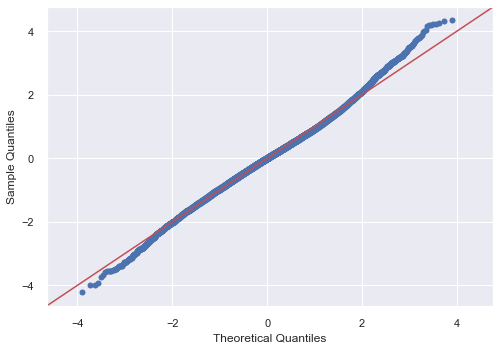

In [233]:
fig = sm.graphics.qqplot(model6.resid, dist=stats.norm, line='45', fit=True)

In [234]:
name = ['Jarque-Bera','Prob','Skew', 'Kurtosis']
test = sms.jarque_bera(model6.resid)
list(zip(name, test))

[('Jarque-Bera', 374.89441582587335),
 ('Prob', 3.9148214140362837e-82),
 ('Skew', 0.08712051859984904),
 ('Kurtosis', 3.6214879516017437)]

#### 2nd fit (after p-Value selection)

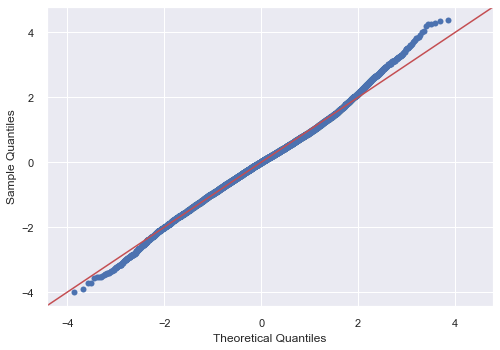

In [235]:
fig = sm.graphics.qqplot(model7.resid, dist=stats.norm, line='45', fit=True)

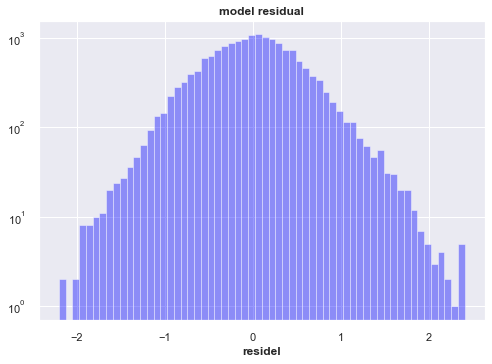

In [236]:
fig, ax = plt.subplots() 
#plt.hist(model.resid,bins=50,color='green',alpha=0.4)
#model.resid.plot(kind='hist',bins=50,color='red',alpha=0.4)
ax.hist(model7.resid,bins=60,color='blue',alpha=0.4,log=True)
ax.set_xlabel('residel',fontweight ='bold')
ax.grid(True)
ax.set_title('model residual',fontweight='bold')
plt.show()

In [237]:
name = ['Jarque-Bera','Prob','Skew', 'Kurtosis']
test = sms.jarque_bera(model7.resid)
list(zip(name, test))

[('Jarque-Bera', 302.16809991393654),
 ('Prob', 2.426782195975101e-66),
 ('Skew', 0.09800003636937447),
 ('Kurtosis', 3.6175230857502996)]

### check homoscedasticity (Goldfeld-Quandt test)

The null hypothesis for the GQ test is homoscedasticity. The larger the F-statistic, the more evidence we will have against the homoscedasticity assumption and the more likely we have heteroscedasticity. The p-value for our tests above tells us whether or not to reject the null-hypothesis of homoscedasticity. 

#### 1st fit (after p-Value selection)

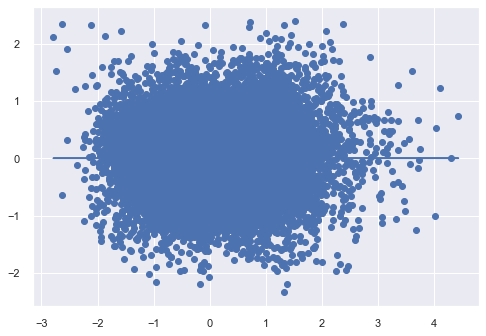

In [238]:
plt.scatter(model6.predict(XC_adfeats), model6.resid)
plt.plot(model6.predict(XC_adfeats), [0 for i in range(len(XC_adfeats))])

In [239]:
name = ['F statistic', 'p-value']
test = sms.het_goldfeldquandt(model6.resid, model6.model.exog)
list(zip(name, test))

[('F statistic', 0.9819979693132047), ('p-value', 0.8270389828753202)]

#### 2nd fit (after p-Value selection)

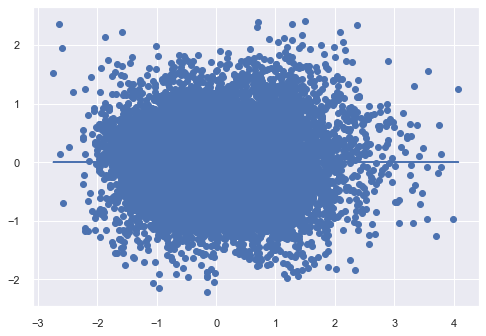

In [240]:
plt.scatter(model7.predict(train[xD_cols]), model7.resid)
plt.plot(model7.predict(train[xD_cols]), [0 for i in range(len(train[xD_cols]))])

In [241]:
# Run Goldfeld Quandt test
name = ['F statistic', 'p-value']
test = sms.het_goldfeldquandt(model7.resid, model7.model.exog)
list(zip(name, test))

[('F statistic', 0.9845093203157367), ('p-value', 0.7655368317966655)]

### Sqft_Above_log

In [ ]:
fig1, axes = plt.subplots(figsize=(15,12))
fig1 = sm.graphics.plot_regress_exog(model7, "sqft_above_log", fig=fig1)
fig1 = sm.graphics.qqplot(model7.resid, dist=stats.norm, line='45', fit=True)
fig1.tight_layout()
plt.show()

f1 = 'price_log~sqft_above_log'
model_sqftAbove = ols(formula=f1, data=train).fit()

print(f'view: R2 {model_sqftAbove.rsquared:5.3f} , intercept {model_sqftAbove.params[0]:5.3f} , slope {model_sqftAbove.params[1]:5.3f}') 
print(f'p-value {model_sqftAbove.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_sqftAbove.resid)[0]:5.3f}')
print(f'JB prob. {sms.jarque_bera(model_sqftAbove.resid)[1]:5.3f} , JB Skew {sms.jarque_bera(model_sqftAbove.resid)[2]:5.3f} , JB Kurtosis {sms.jarque_bera(model_sqftAbove.resid)[3]:5.3f}')

In [ ]:
model_sqftAbove.summary()

In [ ]:
#X_new = pd.DataFrame({'view': [np.min(train.view), np.max(train.view)]})
#preds = model_view.predict(X_new)
#train.plot(kind='scatter', x='view', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()